In [2]:

from sklearn.linear_model import LinearRegression
import xarray as xr 
import matplotlib.pyplot as plt
from pyproj import Proj, Transformer, CRS
import pandas as pd
import seaborn as sns
import numpy as np
from tin_tools import tin_simple_viewer_h5py as tinviewer
import cmocean
import geopandas as gpd
from statsmodels.tsa.seasonal import seasonal_decompose
import pymannkendall as mk
import glob
from Hydrograph.hydrograph import sepBaseflow, filterpeaks, maxFlowVolStats
from Hydrograph.extreme_analysis import exceed, fitGEV, plotPDF, plotCDF, plotGEV

sns.set_style('darkgrid')


In [3]:
precip = xr.open_dataset('../data/forcing_data/prepared/precipitation.nc')
temp = xr.open_dataset('../data/forcing_data/prepared/temperature.nc')
rel_hum = xr.open_dataset('../data/forcing_data/prepared/relative_humidity.nc')
radiation = xr.open_dataset('../data/forcing_data/prepared/radiation.nc')
wind_speed = xr.open_dataset('../data/forcing_data/prepared/wind_speed.nc')

precip_hma = xr.open_mfdataset('../data/HMA/precipitation.nc')
temp_hma = xr.open_mfdataset('../data/HMA/temperature.nc')
rel_hum_hma = xr.open_mfdataset('../data/HMA/relative_humidity.nc')
radiation_hma = xr.open_mfdataset('../data/HMA/radiation.nc')
wind_speed_hma = xr.open_mfdataset('../data/HMA/wind_speed.nc')

observed_discharge = xr.open_dataset('../data/validation_data/prepared/observed_discharge.nc')

cell_data = xr.open_mfdataset('../data/forcing_data/raw/cell_data/cell_data.nc')
cell_data = cell_data.where(cell_data.catchment_id == 10, drop=True)
small_tin = xr.open_mfdataset('../shyft_workspace_copy/shyft_workspace/shyft-data/tin/narayani_cid10_small_tin.nc')
avg_tin = xr.open_mfdataset('../shyft_workspace_copy/shyft_workspace/shyft-data/tin/narayani_cid10_average_tin.nc')
bigger_tin = xr.open_mfdataset('../shyft_workspace_copy/shyft_workspace/shyft-data/tin/narayani_cid10_bigger_tin.nc')
largest_tin = xr.open_mfdataset('../shyft_workspace_copy/shyft_workspace/shyft-data/tin/narayani_cid10_largest_tin.nc')

snowfall = xr.open_mfdataset(glob.glob('../data/forcing_data/raw/WFDE5/snowf/*.nc'))

catchment_outline =  gpd.read_file('../data/forcing_data/raw/cell_data/cid10/10.shp')

In [92]:
observed_discharge_val = observed_discharge.discharge.values

In [93]:
observed_discharge_val_sorted = np.sort(observed_discharge_val)

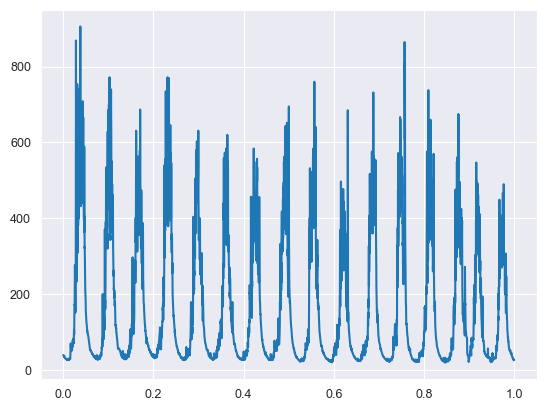

In [94]:
x = np.arange(1, len(observed_discharge_val_sorted)+1) / len(observed_discharge_val_sorted)

plt.plot(x, observed_discharge_val_sorted)
plt.show()

In [321]:
cell_data.crs.unit

AttributeError: 'DataArray' object has no attribute 'unit'

In [323]:
wind_speed.z.values

array([ 689., 1457., 4855., 5159., 1258., 2163., 4381., 4532., 2083.,
       4063., 4773., 4598., 1545., 6612., 4667., 4549.])

In [238]:
wind_speed.sel(station = 13).z.values

array(6612.)

In [120]:
wind_speed.x

<xarray.DataArray 'x' (station: 16)>
array([228932.243758, 230182.070275, 231452.432949, 232743.238165,
       278233.347537, 279255.450765, 280294.354239, 281349.981658,
       327524.816945, 328319.4863  , 329127.221226, 329947.962559,
       376808.793017, 377376.253429, 377953.045701, 378539.127671])
Coordinates:
    x        (station) float64 2.289e+05 2.302e+05 ... 3.78e+05 3.785e+05
    y        (station) float64 3.073e+06 3.128e+06 ... 3.181e+06 3.236e+06
    z        (station) float64 689.0 1.457e+03 4.855e+03 ... 4.667e+03 4.549e+03
Dimensions without coordinates: station
Attributes:
    axis:           X
    standard_name:  projection_x_coordinate
    units:          m

In [176]:
stations = [4,5 ,6,7]
x_l = []
y_l = []
z_l = []
for i in stations:
    x = wind_speed.sel(station = i).x.item()
    y = wind_speed.sel(station = i).y.item()
    z = wind_speed.sel(station = i).z.item()
    x_l.append(x)
    y_l.append(y)
    z_l.append(z)
    
crs_32645 = CRS.from_epsg(32645) # CRS from cell_data file
crs_4326 = CRS.from_epsg(4326) # Lat-lon


## Create transformer to convert from CRS to CRS

transformer = Transformer.from_crs(crs_32645, crs_4326, always_xy = True)

lon_s ,lat_s = transformer.transform(x_l, y_l)

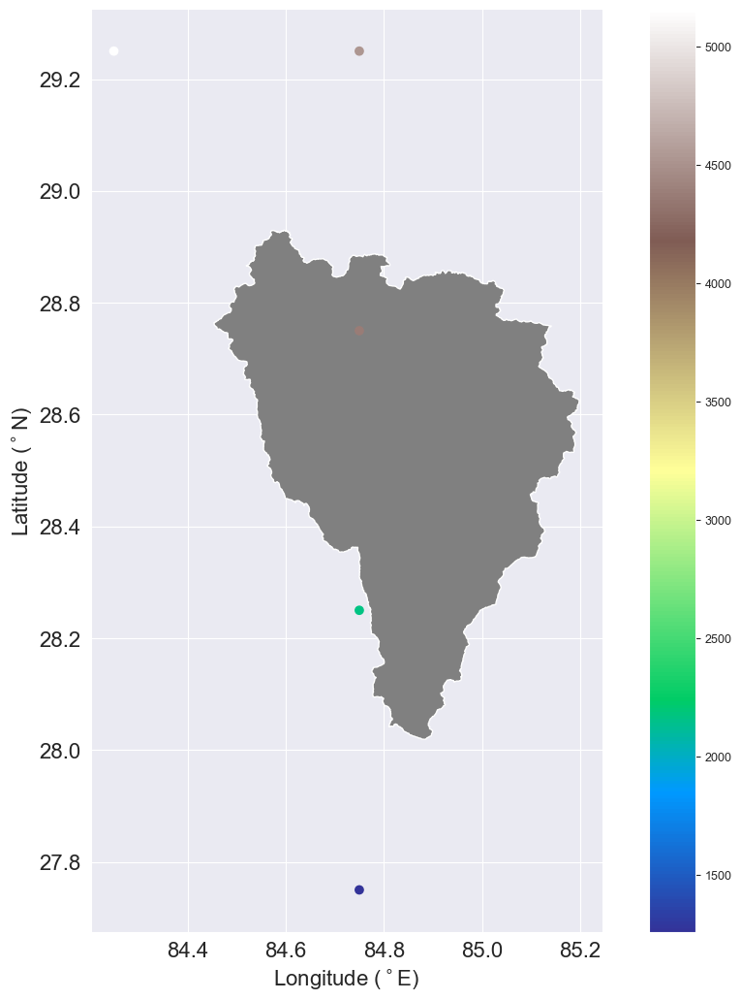

In [175]:
cmap = plt.cm.terrain
fig, ax = plt.subplots(figsize = (10,10))
catchment_outline.plot(ax = ax, color = 'grey')
im = ax.scatter(lon_s, lat_s, c = z_l, cmap = cmap)
# Show colorbar
cbar = fig.colorbar(im, ax=ax)
plt.tight_layout()
ax.tick_params(axis='both', which='major', labelsize=16)
ax.set_xlabel('Longitude ($^\circ$E)', fontsize=16)
ax.set_ylabel('Latitude ($^\circ$N)', fontsize=16)
plt.show()

In [154]:
radiation

<xarray.Dataset>
Dimensions:           (station: 16, time: 262968)
Coordinates:
  * time              (time) datetime64[ns] 1990-01-01 ... 2019-12-31T23:00:00
    x                 (station) float64 ...
    y                 (station) float64 ...
    z                 (station) float64 ...
Dimensions without coordinates: station
Data variables:
    series_name       (station) int64 ...
    crs               int32 ...
    global_radiation  (time, station) float64 ...

In [187]:
temp= temp.sel(time = slice('2000-01-01', '2015-12-31'))
precip = precip.sel(time = slice('2000-01-01', '2015-12-31'))
wind_speed = wind_speed.sel(time = slice('2000-01-01', '2015-12-31'))
rel_hum = rel_hum.sel(time = slice('2000-01-01', '2015-12-31'))
radiation = radiation.sel(time = slice('2000-01-01', '2015-12-31'))

In [188]:
temp_bg = []
precip_bg = []
wind_bg = []
rel_hum_bg = []
radiation_bg = []

for i in stations:
    temp_sel = temp.sel(station = i).temperature.resample(time = '1D').mean()
    precip_sel = precip.sel(station = i).precipitation.resample(time = '1D').sum()
    wind_sel = wind_speed.sel(station = i).wind_speed.resample(time = '1D').mean()
    rel_hum_sel = rel_hum.sel(station = i).relative_humidity.resample(time = '1D').mean()
    radiation_sel = radiation.sel(station = i).global_radiation.resample(time = '1D').mean()
    temp_bg.append(temp_sel)
    precip_bg.append(precip_sel)
    wind_bg.append(wind_sel)
    rel_hum_bg.append(rel_hum_sel)
    radiation_bg.append(radiation_sel)

In [210]:
# Make rolling mean of 365  days
temp_bg_rolling = [i.rolling(time = 365, center = True).mean() for i in temp_bg]
precip_bg_rolling = [i.rolling(time = 365, center = True).mean() for i in precip_bg]
wind_bg_rolling = [i.rolling(time = 365, center = True).mean() for i in wind_bg]
rel_hum_bg_rolling = [i.rolling(time = 365, center = True).mean() for i in rel_hum_bg]
radiation_bg_rolling = [i.rolling(time = 365, center = True).mean() for i in radiation_bg]


In [250]:
temp_bg_mean = []
precip_bg_mean = []
wind_bg_mean = []
rel_hum_bg_mean = []
radiation_bg_mean = []
all_vars = [temp_bg, precip_bg, wind_bg, rel_hum_bg, radiation_bg]
for i, v in enumerate(all_vars):
    if i == 0:
        for j in all_vars[i]:
            temp_bg_mean.append(j.mean().item())
    elif i == 1:
        for j in all_vars[i]:
            precip_bg_mean.append(j.mean().item())
    elif i == 2:
        for j in all_vars[i]:
            wind_bg_mean.append(j.mean().item())
    elif i == 3:
        for j in all_vars[i]:
            rel_hum_bg_mean.append(j.mean().item())
    elif i == 4:
        for j in all_vars[i]:
            radiation_bg_mean.append(j.mean().item())
    

In [260]:
z_bg = temp.sel(station = stations).z.values

/var/folders/07/3pj74xcs7mqdgyzchd88y9840000gn/T/ipykernel_31317/3225256505.py:32: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/var/folders/07/3pj74xcs7mqdgyzchd88y9840000gn/T/ipykernel_31317/3225256505.py:95: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


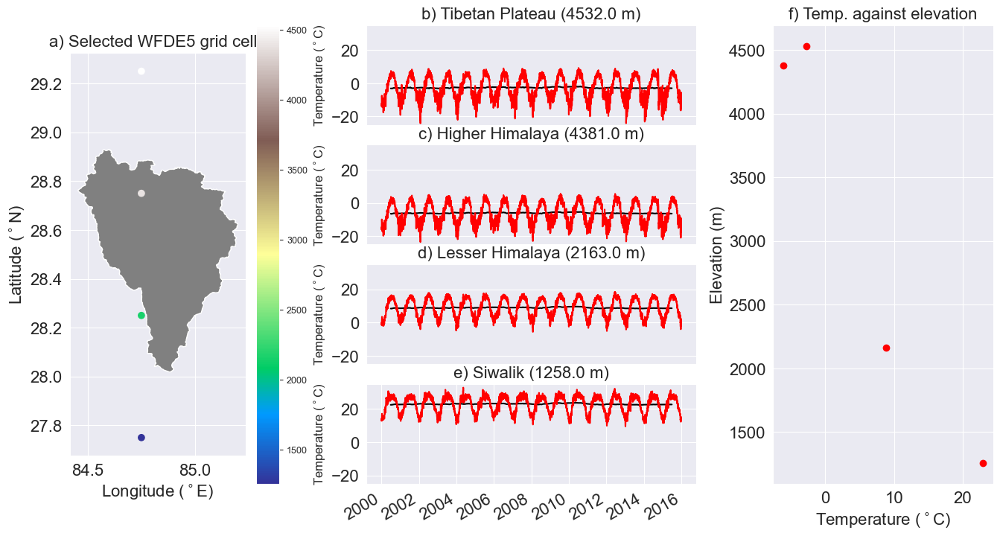

In [290]:

import matplotlib.gridspec as gridspec

# Create the figure and define the grid layout
fig = plt.figure(figsize=(16, 8))
gs = fig.add_gridspec(nrows=4, ncols=3, width_ratios=[1, 1.5,1], wspace=0.3)

# Subfigure to the left (covering all rows)
ax_left = fig.add_subplot(gs[:, 0])
ax_left.set_title('a) Selected WFDE5 grid cells', fontsize=16)

# Subfigures to the right
ax_right_1 = fig.add_subplot(gs[0, 1])
ax_right_1.set_title('Right Subfigure 1')

ax_right_2 = fig.add_subplot(gs[1, 1])
ax_right_2.set_title('Right Subfigure 2')

ax_right_3 = fig.add_subplot(gs[2, 1])
ax_right_3.set_title('Right Subfigure 3')

ax_right_4 = fig.add_subplot(gs[3, 1])
ax_right_4.set_title('Right Subfigure 4')


# Adjust spacing between subfigures
plt.subplots_adjust(wspace=0.9)

catchment_outline.plot(ax = ax_left, color = 'grey')
im = ax_left.scatter(lon_s, lat_s, c = z_l, cmap = cmap)
# Show colorbar
cbar = fig.colorbar(im, ax=ax_left)
plt.tight_layout()
ax_left.tick_params(axis='both', which='major', labelsize=16)
ax_left.set_xlabel('Longitude ($^\circ$E)', fontsize=16)
ax_left.set_ylabel('Latitude ($^\circ$N)', fontsize=16)

temp_bg_rolling[0].plot(ax = ax_right_4, color = 'black')
temp_bg[0].plot(ax = ax_right_4, color = 'red')
ax_right_4.set_ylabel('Temperature ($^\circ$C)', fontsize=12)
ax_right_4.set_title(f'e) Siwalik ({temp_bg[0].z.item()} m)', fontsize=16)


temp_bg_rolling[1].plot(ax = ax_right_3, color = 'black')
temp_bg[1].plot(ax = ax_right_3, color = 'red')
ax_right_3.set_ylabel('Temperature ($^\circ$C)', fontsize=12)
ax_right_3.set_title(f'd) Lesser Himalaya ({temp_bg[1].z.item()} m)', fontsize=16)


temp_bg_rolling[2].plot(ax = ax_right_2, color = 'black')
temp_bg[2].plot(ax = ax_right_2, color = 'red')
ax_right_2.set_ylabel('Temperature ($^\circ$C)', fontsize=12)
ax_right_2.set_title(f'c) Higher Himalaya ({temp_bg[2].z.item()} m)', fontsize=16)


temp_bg_rolling[3].plot(ax = ax_right_1, color = 'black')
temp_bg[3].plot(ax = ax_right_1, color = 'red')
ax_right_1.set_ylabel('Temperature ($^\circ$C)', fontsize=12)
ax_right_1.set_title(f'b) Tibetan Plateau ({temp_bg[3].z.item()} m)', fontsize=16)


ax_right_4.tick_params(axis='both', which='major', labelsize=16)
ax_right_3.tick_params(axis='both', which='major', labelsize=16)
ax_right_2.tick_params(axis='both', which='major', labelsize=16)
ax_right_1.tick_params(axis='both', which='major', labelsize=16)

ax_right_1.set_xticks([])
ax_right_1.set_xticklabels([])

ax_right_2.set_xticks([])
ax_right_2.set_xticklabels([])

ax_right_3.set_xticks([])
ax_right_3.set_xticklabels([])

ax_right_4.set_xlabel('')
ax_right_3.set_xlabel('')
ax_right_2.set_xlabel('')
ax_right_1.set_xlabel('')

ax_right_4.set_ylim(-25,35)
ax_right_3.set_ylim(-25,35)
ax_right_2.set_ylim(-25,35)
ax_right_1.set_ylim(-25,35)


ax_full = fig.add_subplot(gs[:, -1])
ax_full.set_title('f) Temp. against elevation', fontsize=16)

ax_full.scatter(temp_bg_mean, z_bg, color = 'red', label = 'Precipitation')
ax_full.set_xlabel('Temperature ($^\circ$C)', fontsize=16)
ax_full.set_ylabel('Elevation (m)', fontsize=16)    

ax_full.tick_params(axis='both', which='major', labelsize=16)   

plt.tight_layout()
# Show the figure
plt.show()

/var/folders/07/3pj74xcs7mqdgyzchd88y9840000gn/T/ipykernel_31317/3368998741.py:32: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/var/folders/07/3pj74xcs7mqdgyzchd88y9840000gn/T/ipykernel_31317/3368998741.py:95: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


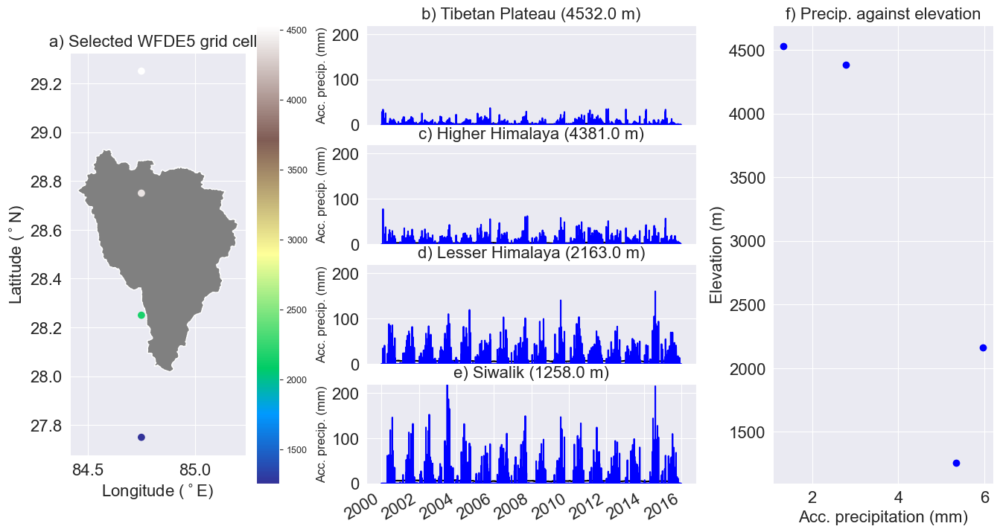

In [289]:

import matplotlib.gridspec as gridspec

# Create the figure and define the grid layout
fig = plt.figure(figsize=(16, 8))
gs = fig.add_gridspec(nrows=4, ncols=3, width_ratios=[1, 1.5,1], wspace=0.3)

# Subfigure to the left (covering all rows)
ax_left = fig.add_subplot(gs[:, 0])
ax_left.set_title('a) Selected WFDE5 grid cells', fontsize=16)

# Subfigures to the right
ax_right_1 = fig.add_subplot(gs[0, 1])
ax_right_1.set_title('Right Subfigure 1')

ax_right_2 = fig.add_subplot(gs[1, 1])
ax_right_2.set_title('Right Subfigure 2')

ax_right_3 = fig.add_subplot(gs[2, 1])
ax_right_3.set_title('Right Subfigure 3')

ax_right_4 = fig.add_subplot(gs[3, 1])
ax_right_4.set_title('Right Subfigure 4')


# Adjust spacing between subfigures
plt.subplots_adjust(wspace=0.9)

catchment_outline.plot(ax = ax_left, color = 'grey')
im = ax_left.scatter(lon_s, lat_s, c = z_l, cmap = cmap)
# Show colorbar
cbar = fig.colorbar(im, ax=ax_left)
plt.tight_layout()
ax_left.tick_params(axis='both', which='major', labelsize=16)
ax_left.set_xlabel('Longitude ($^\circ$E)', fontsize=16)
ax_left.set_ylabel('Latitude ($^\circ$N)', fontsize=16)

precip_bg_rolling[0].plot(ax = ax_right_4, color = 'black')
precip_bg[0].plot(ax = ax_right_4, color = 'blue')
ax_right_4.set_ylabel('Acc. precip. (mm)', fontsize=12)
ax_right_4.set_title(f'e) Siwalik ({temp_bg[0].z.item()} m)', fontsize=16)


precip_bg_rolling[1].plot(ax = ax_right_3, color = 'black')
precip_bg[1].plot(ax = ax_right_3, color = 'blue')
ax_right_3.set_ylabel('Acc. precip. (mm)', fontsize=12)
ax_right_3.set_title(f'd) Lesser Himalaya ({temp_bg[1].z.item()} m)', fontsize=16)


precip_bg_rolling[2].plot(ax = ax_right_2, color = 'black')
precip_bg[2].plot(ax = ax_right_2, color = 'blue')
ax_right_2.set_ylabel('Acc. precip. (mm)', fontsize=12)
ax_right_2.set_title(f'c) Higher Himalaya ({temp_bg[2].z.item()} m)', fontsize=16)


precip_bg_rolling[3].plot(ax = ax_right_1, color = 'black')
precip_bg[3].plot(ax = ax_right_1, color = 'blue')
ax_right_1.set_ylabel('Acc. precip. (mm)', fontsize=12)
ax_right_1.set_title(f'b) Tibetan Plateau ({temp_bg[3].z.item()} m)', fontsize=16)


ax_right_4.tick_params(axis='both', which='major', labelsize=16)
ax_right_3.tick_params(axis='both', which='major', labelsize=16)
ax_right_2.tick_params(axis='both', which='major', labelsize=16)
ax_right_1.tick_params(axis='both', which='major', labelsize=16)

ax_right_1.set_xticks([])
ax_right_1.set_xticklabels([])

ax_right_2.set_xticks([])
ax_right_2.set_xticklabels([])

ax_right_3.set_xticks([])
ax_right_3.set_xticklabels([])

ax_right_4.set_xlabel('')
ax_right_3.set_xlabel('')
ax_right_2.set_xlabel('')
ax_right_1.set_xlabel('')

ax_right_4.set_ylim(0,220)
ax_right_3.set_ylim(0,220)
ax_right_2.set_ylim(0,220)
ax_right_1.set_ylim(0,220)


ax_full = fig.add_subplot(gs[:, -1])
ax_full.set_title('f) Precip. against elevation', fontsize=16)

ax_full.scatter(precip_bg_mean, z_bg, color = 'blue', label = 'Precipitation')
ax_full.set_xlabel('Acc. precipitation (mm)', fontsize=16)
ax_full.set_ylabel('Elevation (m)', fontsize=16)    

ax_full.tick_params(axis='both', which='major', labelsize=16)   

plt.tight_layout()
# Show the figure
plt.show()

/var/folders/07/3pj74xcs7mqdgyzchd88y9840000gn/T/ipykernel_31317/1836727469.py:32: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/var/folders/07/3pj74xcs7mqdgyzchd88y9840000gn/T/ipykernel_31317/1836727469.py:93: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


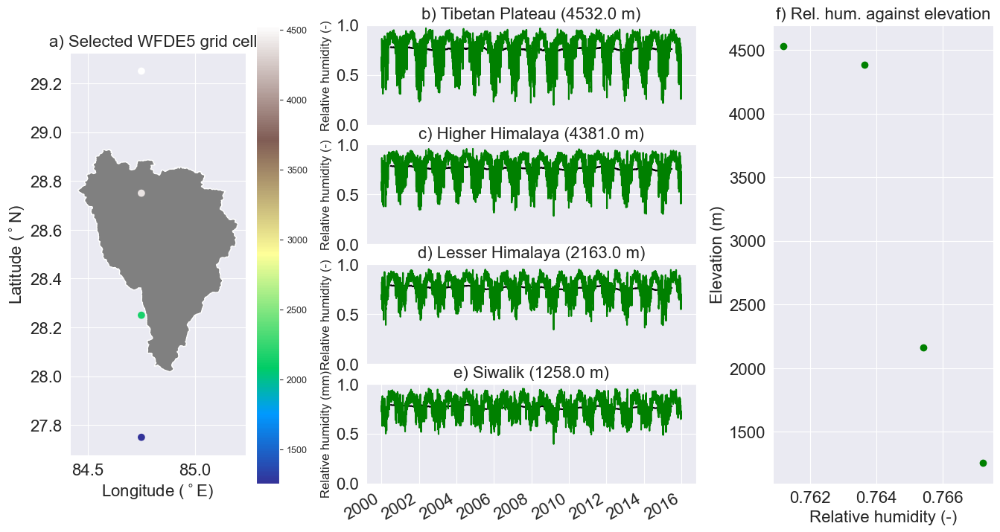

In [288]:
import matplotlib.gridspec as gridspec

# Create the figure and define the grid layout
fig = plt.figure(figsize=(16, 8))
gs = fig.add_gridspec(nrows=4, ncols=3, width_ratios=[1, 1.5, 1], wspace=0.3)

# Subfigure to the left (covering all rows)
ax_left = fig.add_subplot(gs[:, 0])
ax_left.set_title('a) Selected WFDE5 grid cells', fontsize=16)

# Subfigures to the right
ax_right_1 = fig.add_subplot(gs[0, 1])
ax_right_1.set_title('Right Subfigure 1')

ax_right_2 = fig.add_subplot(gs[1, 1])
ax_right_2.set_title('Right Subfigure 2')

ax_right_3 = fig.add_subplot(gs[2, 1])
ax_right_3.set_title('Right Subfigure 3')

ax_right_4 = fig.add_subplot(gs[3, 1])
ax_right_4.set_title('Right Subfigure 4')


# Adjust spacing between subfigures
plt.subplots_adjust(wspace=0.9)

catchment_outline.plot(ax = ax_left, color = 'grey')
im = ax_left.scatter(lon_s, lat_s, c = z_l, cmap = cmap)
# Show colorbar
cbar = fig.colorbar(im, ax=ax_left)
plt.tight_layout()
ax_left.tick_params(axis='both', which='major', labelsize=16)
ax_left.set_xlabel('Longitude ($^\circ$E)', fontsize=16)
ax_left.set_ylabel('Latitude ($^\circ$N)', fontsize=16)

rel_hum_bg_rolling[0].plot(ax = ax_right_4, color = 'black')
rel_hum_bg[0].plot(ax = ax_right_4, color = 'green')
ax_right_4.set_ylabel('Relative humidity (mm)', fontsize=12)
ax_right_4.set_title(f'e) Siwalik ({temp_bg[0].z.item()} m)', fontsize=16)


rel_hum_bg_rolling[1].plot(ax = ax_right_3, color = 'black')
rel_hum_bg[1].plot(ax = ax_right_3, color = 'green')
ax_right_3.set_ylabel('Relative humidity (-)', fontsize=12)
ax_right_3.set_title(f'd) Lesser Himalaya ({temp_bg[1].z.item()} m)', fontsize=16)


rel_hum_bg_rolling[2].plot(ax = ax_right_2, color = 'black')
rel_hum_bg[2].plot(ax = ax_right_2, color = 'green')
ax_right_2.set_ylabel('Relative humidity (-)', fontsize=12)
ax_right_2.set_title(f'c) Higher Himalaya ({temp_bg[2].z.item()} m)', fontsize=16)


rel_hum_bg_rolling[3].plot(ax = ax_right_1, color = 'black')
rel_hum_bg[3].plot(ax = ax_right_1, color = 'green')
ax_right_1.set_ylabel('Relative humidity (-)', fontsize=12)
ax_right_1.set_title(f'b) Tibetan Plateau ({temp_bg[3].z.item()} m)', fontsize=16)


ax_right_4.tick_params(axis='both', which='major', labelsize=16)
ax_right_3.tick_params(axis='both', which='major', labelsize=16)
ax_right_2.tick_params(axis='both', which='major', labelsize=16)
ax_right_1.tick_params(axis='both', which='major', labelsize=16)

ax_right_1.set_xticks([])
ax_right_1.set_xticklabels([])

ax_right_2.set_xticks([])
ax_right_2.set_xticklabels([])

ax_right_3.set_xticks([])
ax_right_3.set_xticklabels([])

ax_right_4.set_xlabel('')
ax_right_3.set_xlabel('')
ax_right_2.set_xlabel('')
ax_right_1.set_xlabel('')

ax_right_4.set_ylim(0,1)
ax_right_3.set_ylim(0,1)
ax_right_2.set_ylim(0,1)
ax_right_1.set_ylim(0,1)

ax_full = fig.add_subplot(gs[:, -1])
ax_full.set_title('f) Rel. hum. against elevation', fontsize=16)

ax_full.scatter(rel_hum_bg_mean, z_bg, color = 'green', label = 'Precipitation')
ax_full.set_xlabel('Relative humidity (-)', fontsize=16)
ax_full.set_ylabel('Elevation (m)', fontsize=16)    

ax_full.tick_params(axis='both', which='major', labelsize=16)   
plt.tight_layout()
# Show the figure
plt.show()

/var/folders/07/3pj74xcs7mqdgyzchd88y9840000gn/T/ipykernel_31317/50613475.py:32: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/var/folders/07/3pj74xcs7mqdgyzchd88y9840000gn/T/ipykernel_31317/50613475.py:95: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


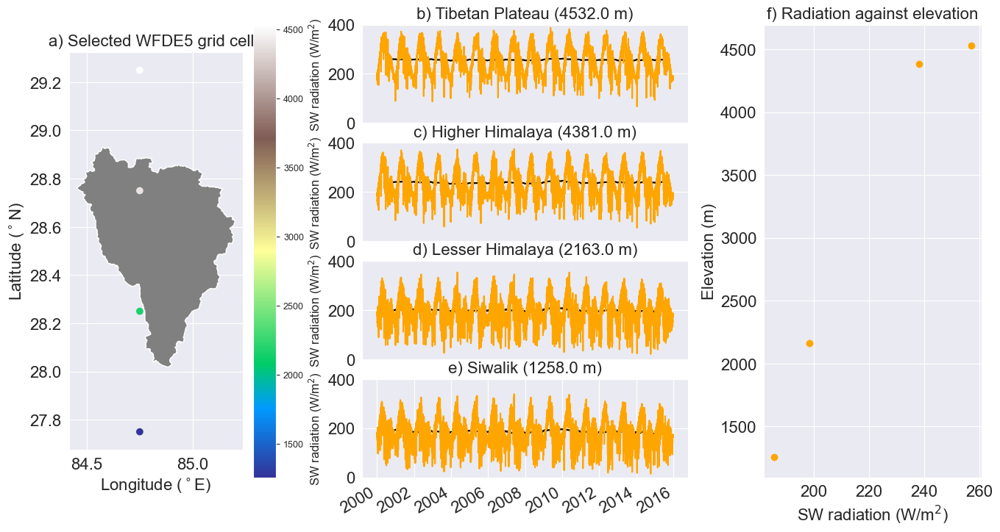

In [291]:

import matplotlib.gridspec as gridspec

# Create the figure and define the grid layout
fig = plt.figure(figsize=(16, 8))
gs = fig.add_gridspec(nrows=4, ncols=3, width_ratios=[1, 1.5,1], wspace=0.3)

# Subfigure to the left (covering all rows)
ax_left = fig.add_subplot(gs[:, 0])
ax_left.set_title('a) Selected WFDE5 grid cells', fontsize=16)

# Subfigures to the right
ax_right_1 = fig.add_subplot(gs[0, 1])
ax_right_1.set_title('Right Subfigure 1')

ax_right_2 = fig.add_subplot(gs[1, 1])
ax_right_2.set_title('Right Subfigure 2')

ax_right_3 = fig.add_subplot(gs[2, 1])
ax_right_3.set_title('Right Subfigure 3')

ax_right_4 = fig.add_subplot(gs[3, 1])
ax_right_4.set_title('Right Subfigure 4')


# Adjust spacing between subfigures
plt.subplots_adjust(wspace=0.9)

catchment_outline.plot(ax = ax_left, color = 'grey')
im = ax_left.scatter(lon_s, lat_s, c = z_l, cmap = cmap)
# Show colorbar
cbar = fig.colorbar(im, ax=ax_left)
plt.tight_layout()
ax_left.tick_params(axis='both', which='major', labelsize=16)
ax_left.set_xlabel('Longitude ($^\circ$E)', fontsize=16)
ax_left.set_ylabel('Latitude ($^\circ$N)', fontsize=16)

radiation_bg_rolling[0].plot(ax = ax_right_4, color = 'black')
radiation_bg[0].plot(ax = ax_right_4, color = 'orange')
ax_right_4.set_ylabel('SW radiation (W/m$^2$)', fontsize=12)
ax_right_4.set_title(f'e) Siwalik ({temp_bg[0].z.item()} m)', fontsize=16)


radiation_bg_rolling[1].plot(ax = ax_right_3, color = 'black')
radiation_bg[1].plot(ax = ax_right_3, color = 'orange')
ax_right_3.set_ylabel('SW radiation (W/m$^2$)', fontsize=12)
ax_right_3.set_title(f'd) Lesser Himalaya ({temp_bg[1].z.item()} m)', fontsize=16)


radiation_bg_rolling[2].plot(ax = ax_right_2, color = 'black')
radiation_bg[2].plot(ax = ax_right_2, color = 'orange')
ax_right_2.set_ylabel('SW radiation (W/m$^2$)', fontsize=12)
ax_right_2.set_title(f'c) Higher Himalaya ({temp_bg[2].z.item()} m)', fontsize=16)


radiation_bg_rolling[3].plot(ax = ax_right_1, color = 'black')
radiation_bg[3].plot(ax = ax_right_1, color = 'orange')
ax_right_1.set_ylabel('SW radiation (W/m$^2$)', fontsize=12)
ax_right_1.set_title(f'b) Tibetan Plateau ({temp_bg[3].z.item()} m)', fontsize=16)


ax_right_4.tick_params(axis='both', which='major', labelsize=16)
ax_right_3.tick_params(axis='both', which='major', labelsize=16)
ax_right_2.tick_params(axis='both', which='major', labelsize=16)
ax_right_1.tick_params(axis='both', which='major', labelsize=16)

ax_right_1.set_xticks([])
ax_right_1.set_xticklabels([])

ax_right_2.set_xticks([])
ax_right_2.set_xticklabels([])

ax_right_3.set_xticks([])
ax_right_3.set_xticklabels([])

ax_right_4.set_xlabel('')
ax_right_3.set_xlabel('')
ax_right_2.set_xlabel('')
ax_right_1.set_xlabel('')

ax_right_4.set_ylim(0,400)
ax_right_3.set_ylim(0,400)
ax_right_2.set_ylim(0,400)
ax_right_1.set_ylim(0,400)


ax_full = fig.add_subplot(gs[:, -1])
ax_full.set_title('f) Radiation against elevation', fontsize=16)

ax_full.scatter(radiation_bg_mean, z_bg, color = 'orange', label = 'Precipitation')
ax_full.set_xlabel('SW radiation (W/m$^2$)', fontsize=16)
ax_full.set_ylabel('Elevation (m)', fontsize=16)    

ax_full.tick_params(axis='both', which='major', labelsize=16)   

plt.tight_layout()
# Show the figure
plt.show()

/var/folders/07/3pj74xcs7mqdgyzchd88y9840000gn/T/ipykernel_31317/869972421.py:32: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/var/folders/07/3pj74xcs7mqdgyzchd88y9840000gn/T/ipykernel_31317/869972421.py:95: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


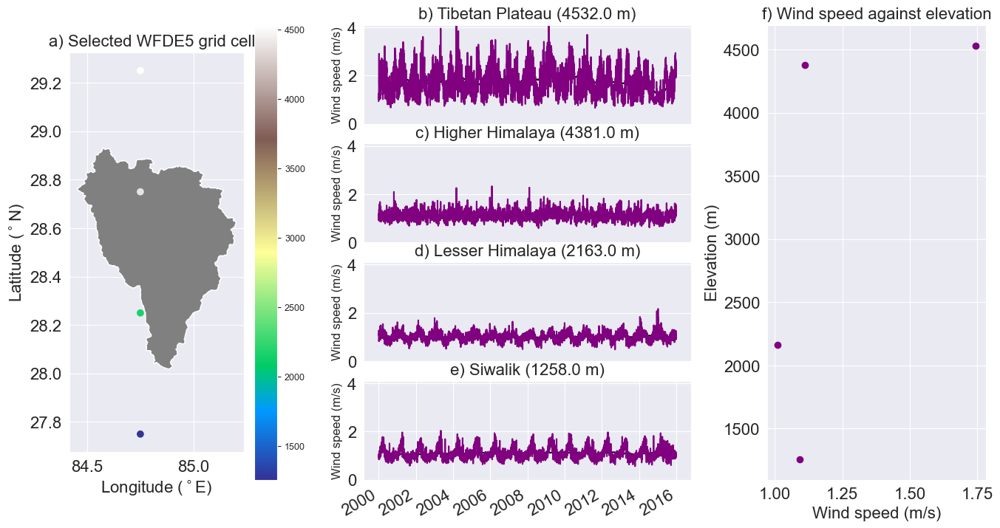

In [293]:

import matplotlib.gridspec as gridspec

# Create the figure and define the grid layout
fig = plt.figure(figsize=(16, 8))
gs = fig.add_gridspec(nrows=4, ncols=3, width_ratios=[1, 1.5,1], wspace=0.3)

# Subfigure to the left (covering all rows)
ax_left = fig.add_subplot(gs[:, 0])
ax_left.set_title('a) Selected WFDE5 grid cells', fontsize=16)

# Subfigures to the right
ax_right_1 = fig.add_subplot(gs[0, 1])
ax_right_1.set_title('Right Subfigure 1')

ax_right_2 = fig.add_subplot(gs[1, 1])
ax_right_2.set_title('Right Subfigure 2')

ax_right_3 = fig.add_subplot(gs[2, 1])
ax_right_3.set_title('Right Subfigure 3')

ax_right_4 = fig.add_subplot(gs[3, 1])
ax_right_4.set_title('Right Subfigure 4')


# Adjust spacing between subfigures
plt.subplots_adjust(wspace=0.9)

catchment_outline.plot(ax = ax_left, color = 'grey')
im = ax_left.scatter(lon_s, lat_s, c = z_l, cmap = cmap)
# Show colorbar
cbar = fig.colorbar(im, ax=ax_left)
plt.tight_layout()
ax_left.tick_params(axis='both', which='major', labelsize=16)
ax_left.set_xlabel('Longitude ($^\circ$E)', fontsize=16)
ax_left.set_ylabel('Latitude ($^\circ$N)', fontsize=16)

wind_bg_rolling[0].plot(ax = ax_right_4, color = 'black')
wind_bg[0].plot(ax = ax_right_4, color = 'purple')
ax_right_4.set_ylabel('Wind speed (m/s)', fontsize=12)
ax_right_4.set_title(f'e) Siwalik ({temp_bg[0].z.item()} m)', fontsize=16)


wind_bg_rolling[1].plot(ax = ax_right_3, color = 'black')
wind_bg[1].plot(ax = ax_right_3, color = 'purple')
ax_right_3.set_ylabel('Wind speed (m/s)', fontsize=12)
ax_right_3.set_title(f'd) Lesser Himalaya ({temp_bg[1].z.item()} m)', fontsize=16)


wind_bg_rolling[2].plot(ax = ax_right_2, color = 'black')
wind_bg[2].plot(ax = ax_right_2, color = 'purple')
ax_right_2.set_ylabel('Wind speed (m/s)', fontsize=12)
ax_right_2.set_title(f'c) Higher Himalaya ({temp_bg[2].z.item()} m)', fontsize=16)


wind_bg_rolling[3].plot(ax = ax_right_1, color = 'black')
wind_bg[3].plot(ax = ax_right_1, color = 'purple')
ax_right_1.set_ylabel('Wind speed (m/s)', fontsize=12)
ax_right_1.set_title(f'b) Tibetan Plateau ({temp_bg[3].z.item()} m)', fontsize=16)


ax_right_4.tick_params(axis='both', which='major', labelsize=16)
ax_right_3.tick_params(axis='both', which='major', labelsize=16)
ax_right_2.tick_params(axis='both', which='major', labelsize=16)
ax_right_1.tick_params(axis='both', which='major', labelsize=16)

ax_right_1.set_xticks([])
ax_right_1.set_xticklabels([])

ax_right_2.set_xticks([])
ax_right_2.set_xticklabels([])

ax_right_3.set_xticks([])
ax_right_3.set_xticklabels([])

ax_right_4.set_xlabel('')
ax_right_3.set_xlabel('')
ax_right_2.set_xlabel('')
ax_right_1.set_xlabel('')

ax_right_4.set_ylim(0,4.1)
ax_right_3.set_ylim(0,4.1)
ax_right_2.set_ylim(0,4.1)
ax_right_1.set_ylim(0,4.1)


ax_full = fig.add_subplot(gs[:, -1])
ax_full.set_title('f) Wind speed against elevation', fontsize=16)

ax_full.scatter(wind_bg_mean, z_bg, color = 'purple', label = 'Precipitation')
ax_full.set_xlabel('Wind speed (m/s)', fontsize=16)
ax_full.set_ylabel('Elevation (m)', fontsize=16)    

ax_full.tick_params(axis='both', which='major', labelsize=16)   

plt.tight_layout()
# Show the figure
plt.show()

In [242]:
wind_689 = wind_speed.sel(station = 0).resample(time = '1D').mean()
wind_1457 = wind_speed.sel(station = 1).resample(time = '1D').mean()
wind_2163 = wind_speed.sel(station = 5).resample(time = '1D').mean()
wind_4063 = wind_speed.sel(station = 9).resample(time = '1D').mean()
wind_5159 = wind_speed.sel(station = 3).resample(time = '1D').mean()
wind_6612 = wind_speed.sel(station = 13).resample(time = '1D').mean()

temp_689 = temp.sel(station = 0).resample(time = '1D').mean()
temp_1457 = temp.sel(station = 1).resample(time = '1D').mean()
temp_2163 = temp.sel(station = 5).resample(time = '1D').mean()
temp_4063 = temp.sel(station = 9).resample(time = '1D').mean()
temp_5159 = temp.sel(station = 3).resample(time = '1D').mean()
temp_6612 = temp.sel(station = 13).resample(time = '1D').mean()

precip_689 = precip.sel(station = 0).resample(time = '1D').sum()
precip_1457 = precip.sel(station = 1).resample(time = '1D').sum()
precip_2163 = precip.sel(station = 5).resample(time = '1D').sum()
precip_4063 = precip.sel(station = 9).resample(time = '1D').sum()
precip_5159 = precip.sel(station = 3).resample(time = '1D').sum()

rel_hum_689 = rel_hum.sel(station = 0).resample(time = '1D').mean()
rel_hum_1457 = rel_hum.sel(station = 1).resample(time = '1D').mean()
rel_hum_2163 = rel_hum.sel(station = 5).resample(time = '1D').mean()
rel_hum_4063 = rel_hum.sel(station = 9).resample(time = '1D').mean()
rel_hum_5159 = rel_hum.sel(station = 3).resample(time = '1D').mean()
rel_hum_6612 = rel_hum.sel(station = 13).resample(time = '1D').mean()

radiation_689 = radiation.sel(station = 0).resample(time = '1D').mean()
radiation_1457 = radiation.sel(station = 1).resample(time = '1D').mean()
radiation_2163 = radiation.sel(station = 5).resample(time = '1D').mean()
radiation_4063 = radiation.sel(station = 9).resample(time = '1D').mean()
radiation_5159 = radiation.sel(station = 3).resample(time = '1D').mean()
radiation_6612 = radiation.sel(station = 13).resample(time = '1D').mean()

In [266]:
precip_6612 = precip.sel(station = 13).resample(time = '1D').sum()

In [267]:
wind_df = pd.DataFrame()
wind_df['689'] = wind_689.wind_speed.values
wind_df['1457'] = wind_1457.wind_speed.values
wind_df['2163'] = wind_2163.wind_speed.values
wind_df['4063'] = wind_4063.wind_speed.values
wind_df['5159'] = wind_5159.wind_speed.values
wind_df['6612'] = wind_6612.wind_speed.values
wind_df.index = wind_689.time.values
wind_df = wind_df.loc[(wind_df.index >= '2000-01-01') & (wind_df.index <= '2015-12-31')]

temp_df = pd.DataFrame()
temp_df['689'] = temp_689.temperature.values
temp_df['1457'] = temp_1457.temperature.values
temp_df['2163'] = temp_2163.temperature.values
temp_df['4063'] = temp_4063.temperature.values
temp_df['5159'] = temp_5159.temperature.values
temp_df['6612'] = temp_6612.temperature.values
temp_df.index = temp_689.time.values
temp_df = temp_df.loc[(temp_df.index >= '2000-01-01') & (temp_df.index <= '2015-12-31')]

precip_df = pd.DataFrame()
precip_df['689'] = precip_689.precipitation.values
precip_df['1457'] = precip_1457.precipitation.values
precip_df['2163'] = precip_2163.precipitation.values
precip_df['4063'] = precip_4063.precipitation.values
precip_df['5159'] = precip_5159.precipitation.values
precip_df['6612'] = precip_6612.precipitation.values
precip_df.index = precip_689.time.values
precip_df = precip_df.loc[(precip_df.index >= '2000-01-01') & (precip_df.index <= '2015-12-31')]

rel_hum_df = pd.DataFrame()
rel_hum_df['689'] = rel_hum_689.relative_humidity.values
rel_hum_df['1457'] = rel_hum_1457.relative_humidity.values
rel_hum_df['2163'] = rel_hum_2163.relative_humidity.values
rel_hum_df['4063'] = rel_hum_4063.relative_humidity.values
rel_hum_df['5159'] = rel_hum_5159.relative_humidity.values
rel_hum_df['6612'] = rel_hum_6612.relative_humidity.values
rel_hum_df.index = rel_hum_689.time.values
rel_hum_df = rel_hum_df.loc[(rel_hum_df.index >= '2000-01-01') & (rel_hum_df.index <= '2015-12-31')]

radiation_df = pd.DataFrame()
radiation_df['689'] = radiation_689.global_radiation.values
radiation_df['1457'] = radiation_1457.global_radiation.values
radiation_df['2163'] = radiation_2163.global_radiation.values
radiation_df['4063'] = radiation_4063.global_radiation.values
radiation_df['5159'] = radiation_5159.global_radiation.values
radiation_df['6612'] = radiation_6612.global_radiation.values
radiation_df.index = radiation_689.time.values
radiation_df = radiation_df.loc[(radiation_df.index >= '2000-01-01') & (radiation_df.index <= '2015-12-31')]



In [306]:
precip_df

,689,1457,2163,4063,5159,6612
2000-01-01,0.0,0.0,0.0,0.0,0.0,0.0
2000-01-02,0.0,0.0,0.0,0.0,0.0,0.0
2000-01-03,0.0,0.0,0.0,0.0,0.0,0.0
2000-01-04,0.0,0.0,0.0,0.0,0.0,0.0
2000-01-05,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...
2015-12-27,0.0,0.0,0.0,0.0,0.0,0.0
2015-12-28,0.0,0.0,0.0,0.0,0.0,0.0
2015-12-29,0.0,0.0,0.0,0.0,0.0,0.0
2015-12-30,0.0,0.0,0.0,0.0,0.0,0.0


In [313]:
temp_rolling_365 = temp_df.rolling(365).mean()
precip_rolling_365 = precip_df.rolling(365).mean()
rel_hum_rolling_365 = rel_hum_df.rolling(365).mean()
radiation_rolling_365 = radiation_df.rolling(365).mean()
wind_rolling_365 = wind_df.rolling(365).mean()

In [315]:
precip_rolling_365

,689,1457,2163,4063,5159,6612
2000-01-01,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-02,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-03,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-04,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-05,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...
2015-12-27,4.849335,5.882498,4.809577,3.855211,0.461094,3.579586
2015-12-28,4.849335,5.882498,4.809577,3.855211,0.461094,3.579586
2015-12-29,4.849335,5.882498,4.809577,3.855211,0.461094,3.579586
2015-12-30,4.849335,5.882498,4.809577,3.855211,0.461094,3.579586


In [302]:
temp_rolling_365

,689,1457,2163,4063,5159,6612
2000-01-01,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-02,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-03,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-04,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-05,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...
2015-12-27,23.345337,14.656983,8.563783,3.354689,-2.075405,-2.705343
2015-12-28,23.348297,14.665283,8.571129,3.364249,-2.050058,-2.692467
2015-12-29,23.350631,14.673165,8.579519,3.378745,-2.034606,-2.681294
2015-12-30,23.355211,14.681213,8.588453,3.390408,-2.019784,-2.672157


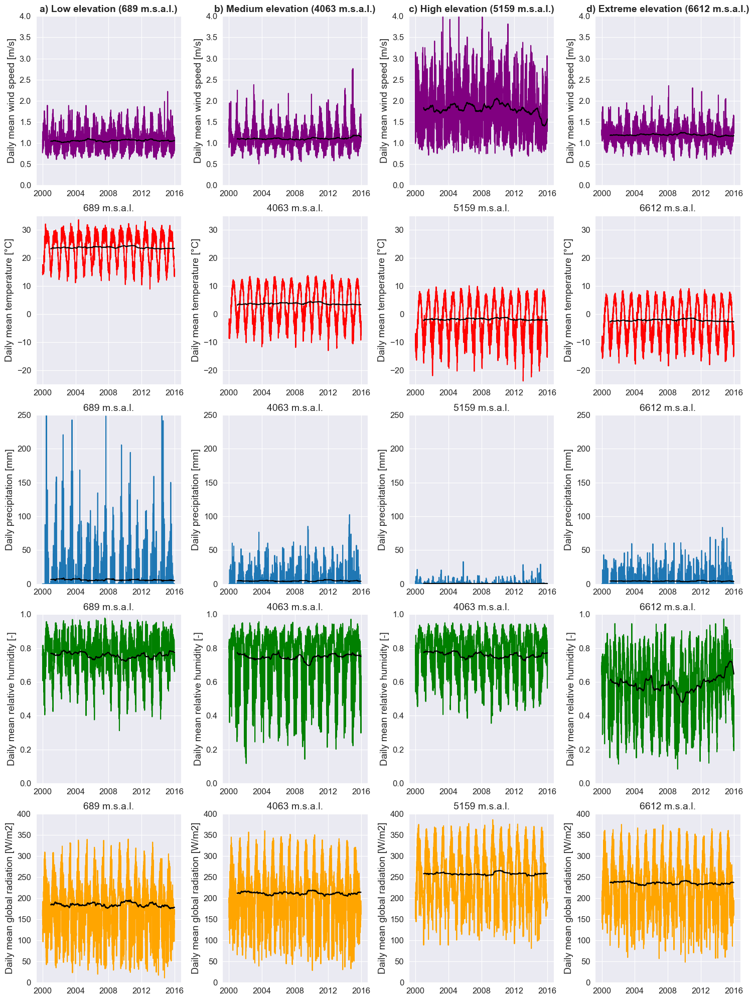

In [338]:
import matplotlib.dates as mdates
import matplotlib.ticker as ticker
fig, ax = plt.subplots(5,4, figsize = (15,20))

years = np.arange(2000,2016)

#fig.bbox_inches = 'tight'
ax[0,0].plot(wind_df['689'].index, wind_df['689'].values, color = 'purple')
ax[0,0].plot(wind_rolling_365['689'].index, wind_rolling_365['689'].values, color = 'black')
ax[0,0].set_title('689 m.s.a.l.', fontsize = 14)
ax[0,0].set_ylabel('Daily mean wind speed [m/s]', fontsize = 14)
ax[0,0].set_ylim(0,4)


# ax[0,1].plot(wind_df['2163'], color = 'purple')
# ax[0,1].set_title('2163 m.s.a.l.')
# ax[0,1].set_ylabel('Daily mean wind speed [m/s]')
# ax[0,1].set_ylim(0,4)

ax[0,1].plot(wind_df['4063'], color = 'purple')
ax[0,1].plot(wind_rolling_365['4063'].index, wind_rolling_365['4063'].values, color = 'black')
ax[0,1].set_title('4063 m.s.a.l.', fontsize = 14)
ax[0,1].set_ylabel('Daily mean wind speed [m/s]', fontsize = 14)
ax[0,1].set_ylim(0,4)

ax[0,2].plot(wind_df['5159'], color = 'purple')
ax[0,2].plot(wind_rolling_365['5159'].index, wind_rolling_365['5159'].values, color = 'black')
ax[0,2].set_title('5159 m.s.a.l.', fontsize = 14)
ax[0,2].set_ylabel('Daily mean wind speed [m/s]', fontsize = 14)
ax[0,2].set_ylim(0,4)

ax[0,3].plot(wind_df['6612'], color = 'purple')
ax[0,3].plot(wind_rolling_365['6612'].index, wind_rolling_365['6612'].values, color = 'black')
ax[0,3].set_title('6612 m.s.a.l.', fontsize = 14)
ax[0,3].set_ylabel('Daily mean wind speed [m/s]',   fontsize = 14)
ax[0,3].set_ylim(0,4)

ax[1,0].plot(temp_df['689'], color = 'red')
ax[1,0].plot(temp_rolling_365['689'], color = 'black')
ax[1,0].set_ylabel('Daily mean temperature [°C]', fontsize = 14)
ax[1,0].set_title('689 m.s.a.l.', fontsize = 14)
ax[1,0].set_ylim(-25,35)

# ax[1,1].plot(temp_df['2163'], color = 'red')
# ax[1,1].set_ylabel('Daily mean temperature [°C]')
# ax[1,1].set_title('2163 m.s.a.l.')
# ax[1,1].set_ylim(-25,35)

ax[1,1].plot(temp_df['4063'], color = 'red')
ax[1,1].plot(temp_rolling_365['4063'], color = 'black')
ax[1,1].set_ylabel('Daily mean temperature [°C]', fontsize = 14)
ax[1,1].set_title('4063 m.s.a.l.', fontsize = 14)
ax[1,1].set_ylim(-25,35)

ax[1,2].plot(temp_df['5159'], color = 'red')
ax[1,2].plot(temp_rolling_365['5159'], color = 'black')
ax[1,2].set_ylabel('Daily mean temperature [°C]', fontsize = 14)
ax[1,2].set_title('5159 m.s.a.l.', fontsize = 14)
ax[1,2].set_ylim(-25,35)

ax[1,3].plot(temp_df['6612'], color = 'red')
ax[1,3].plot(temp_rolling_365['6612'], color = 'black')
ax[1,3].set_ylabel('Daily mean temperature [°C]', fontsize = 14)
ax[1,3].set_title('6612 m.s.a.l.', fontsize = 14)
ax[1,3].set_ylim(-25,35)

ax[2,0].plot(precip_df['689'])
ax[2,0].plot(precip_rolling_365['689'], color = 'black')
ax[2,0].set_ylabel('Daily precipitation [mm]', fontsize = 14)
ax[2,0].set_title('689 m.s.a.l.', fontsize = 14)
ax[2,0].set_ylim(0,250)

# ax[2,1].plot(precip_df['2163'])
# ax[2,1].set_ylabel('Daily precipitation [mm]')
# ax[2,1].set_title('2163 m.s.a.l.')
# ax[2,1].set_ylim(0,250)

ax[2,1].plot(precip_df['4063'])
ax[2,1].plot(precip_rolling_365['4063'], color = 'black')
ax[2,1].set_ylabel('Daily precipitation [mm]', fontsize = 14)
ax[2,1].set_title('4063 m.s.a.l.', fontsize = 14)
ax[2,1].set_ylim(0,250)

ax[2,2].plot(precip_df['5159'])
ax[2,2].plot(precip_rolling_365['5159'], color = 'black')
ax[2,2].set_ylabel('Daily precipitation [mm]', fontsize = 14)
ax[2,2].set_title('5159 m.s.a.l.', fontsize = 14)
ax[2,2].set_ylim(0,250)

ax[2,3].plot(precip_df['6612'])
ax[2,3].plot(precip_rolling_365['6612'], color = 'black')
ax[2,3].set_ylabel('Daily precipitation [mm]', fontsize = 14)
ax[2,3].set_title('6612 m.s.a.l.', fontsize = 14)
ax[2,3].set_ylim(0,250)

ax[3,0].plot(rel_hum_df['689'], color = 'green')
ax[3,0].plot(rel_hum_rolling_365['689'], color = 'black')
ax[3,0].set_ylabel('Daily mean relative humidity [-]', fontsize = 14)
ax[3,0].set_title('689 m.s.a.l.', fontsize = 14)
ax[3,0].set_ylim(0,1)

# ax[3,1].plot(rel_hum_df['2163'], color = 'green')
# ax[3,1].set_ylabel('Daily mean relative humidity [-]')
# ax[3,1].set_title('2163 m.s.a.l.')
# ax[3,1].set_ylim(0,1)

ax[3,1].plot(rel_hum_df['4063'], color = 'green')
ax[3,1].plot(rel_hum_rolling_365['4063'], color = 'black')
ax[3,1].set_ylabel('Daily mean relative humidity [-]', fontsize = 14)
ax[3,1].set_title('4063 m.s.a.l.', fontsize = 14)
ax[3,1].set_ylim(0,1)

ax[3,2].plot(rel_hum_df['5159'], color = 'green')
ax[3,2].plot(rel_hum_rolling_365['5159'], color = 'black')
ax[3,2].set_ylabel('Daily mean relative humidity [-]', fontsize = 14)
ax[3,2].set_title('4063 m.s.a.l.', fontsize = 14)
ax[3,2].set_ylim(0,1)

ax[3,3].plot(rel_hum_df['6612'], color = 'green')
ax[3,3].plot(rel_hum_rolling_365['6612'], color = 'black')
ax[3,3].set_ylabel('Daily mean relative humidity [-]', fontsize = 14)
ax[3,3].set_title('6612 m.s.a.l.', fontsize = 14)
ax[3,3].set_ylim(0,1)

ax[4,0].plot(radiation_df['689'], color = 'orange')
ax[4,0].plot(radiation_rolling_365['689'], color = 'black')
ax[4,0].set_ylabel('Daily mean global radiation [W/m2]', fontsize = 14)
ax[4,0].set_title('689 m.s.a.l.',   fontsize = 14)
ax[4,0].set_ylim(0,400)

# ax[4,1].plot(radiation_df['2163'], color = 'orange')
# ax[4,1].set_ylabel('Daily mean global radiation [W/m2]')
# ax[4,1].set_title('2163 m.s.a.l.')
# ax[4,1].set_ylim(0,400)

ax[4,1].plot(radiation_df['4063'], color = 'orange')
ax[4,1].plot(radiation_rolling_365['4063'], color = 'black')
ax[4,1].set_ylabel('Daily mean global radiation [W/m2]', fontsize = 14)
ax[4,1].set_title('4063 m.s.a.l.', fontsize = 14)
ax[4,1].set_ylim(0,400)

ax[4,2].plot(radiation_df['5159'], color = 'orange')
ax[4,2].plot(radiation_rolling_365['5159'], color = 'black')
ax[4,2].set_ylabel('Daily mean global radiation [W/m2]', fontsize = 14)
ax[4,2].set_title('5159 m.s.a.l.', fontsize = 14)
ax[4,2].set_ylim(0,400)

ax[4,3].plot(radiation_df['6612'], color = 'orange')
ax[4,3].plot(radiation_rolling_365['6612'], color = 'black')
ax[4,3].set_ylabel('Daily mean global radiation [W/m2]', fontsize = 14)
ax[4,3].set_title('6612 m.s.a.l.', fontsize = 14)
ax[4,3].set_ylim(0,400)

ax[0,0].set_title('a) Low elevation (689 m.s.a.l.)', fontsize = 14, fontweight = 'bold')
ax[0,1].set_title('b) Medium elevation (4063 m.s.a.l.)', fontsize = 14, fontweight = 'bold')
ax[0,2].set_title('c) High elevation (5159 m.s.a.l.)', fontsize = 14, fontweight = 'bold')
ax[0,3].set_title('d) Extreme elevation (6612 m.s.a.l.)', fontsize = 14, fontweight = 'bold')
ax[0,0].tick_params(axis='both', which='major', labelsize=14)

ax[0,0].xaxis.set_major_locator(mdates.YearLocator(4))
ax[0,0].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
ax[0,0].tick_params(axis='both', labelsize=12)

ax[0,1].xaxis.set_major_locator(mdates.YearLocator(4))
ax[0,1].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
ax[0,1].tick_params(axis='both', labelsize=12)

ax[0,2].xaxis.set_major_locator(mdates.YearLocator(4))
ax[0,2].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
ax[0,2].tick_params(axis='both', labelsize=12)

ax[0,3].xaxis.set_major_locator(mdates.YearLocator(4))
ax[0,3].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
ax[0,3].tick_params(axis='both', labelsize=12)

ax[1,0].xaxis.set_major_locator(mdates.YearLocator(4))
ax[1,0].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
ax[1,0].tick_params(axis='both', labelsize=12)

ax[1,1].xaxis.set_major_locator(mdates.YearLocator(4))
ax[1,1].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
ax[1,1].tick_params(axis='both', labelsize=12)

ax[1,2].xaxis.set_major_locator(mdates.YearLocator(4))
ax[1,2].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
ax[1,2].tick_params(axis='both', labelsize=12)

ax[1,3].xaxis.set_major_locator(mdates.YearLocator(4))
ax[1,3].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
ax[1,3].tick_params(axis='both', labelsize=12)

ax[2,0].xaxis.set_major_locator(mdates.YearLocator(4))
ax[2,0].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
ax[2,0].tick_params(axis='both', labelsize=12)

ax[2,1].xaxis.set_major_locator(mdates.YearLocator(4))
ax[2,1].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
ax[2,1].tick_params(axis='both', labelsize=12)

ax[2,2].xaxis.set_major_locator(mdates.YearLocator(4))
ax[2,2].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
ax[2,2].tick_params(axis='both', labelsize=12)

ax[2,3].xaxis.set_major_locator(mdates.YearLocator(4))
ax[2,3].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
ax[2,3].tick_params(axis='both', labelsize=12)

ax[3,0].xaxis.set_major_locator(mdates.YearLocator(4))
ax[3,0].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
ax[3,0].tick_params(axis='both', labelsize=12)

ax[3,1].xaxis.set_major_locator(mdates.YearLocator(4))
ax[3,1].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
ax[3,1].tick_params(axis='both', labelsize=12)

ax[3,2].xaxis.set_major_locator(mdates.YearLocator(4))
ax[3,2].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
ax[3,2].tick_params(axis='both', labelsize=12)

ax[3,3].xaxis.set_major_locator(mdates.YearLocator(4))
ax[3,3].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
ax[3,3].tick_params(axis='both', labelsize=12)

ax[4,0].xaxis.set_major_locator(mdates.YearLocator(4))
ax[4,0].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
ax[4,0].tick_params(axis='both', labelsize=12)

ax[4,1].xaxis.set_major_locator(mdates.YearLocator(4))
ax[4,1].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
ax[4,1].tick_params(axis='both', labelsize=12)

ax[4,2].xaxis.set_major_locator(mdates.YearLocator(4))
ax[4,2].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
ax[4,2].tick_params(axis='both', labelsize=12)

ax[4,3].xaxis.set_major_locator(mdates.YearLocator(4))
ax[4,3].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
ax[4,3].tick_params(axis='both', labelsize=12)


plt.tight_layout()
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Generate some sample data
years = np.arange(2000, 2023)
values = np.random.rand(len(years))

# Create the plot
fig, ax = plt.subplots()
ax.plot(years, values)

# Set the x-axis tick interval to display every 2 years
ax.set_xticks(years[::2])

# Set the x-axis tick labels to display only the years divisible by 4
ax.set_xticklabels([str(year) if year % 4 == 0 else '' for year in years[::2]])

# Show the plot
plt.show()


In [106]:
catchment_area = catchment_outline['area'][0] * 10**-6 #km^2

In [111]:
obs_disc = observed_discharge.discharge.values
obs_disc_time = observed_discharge.time.values
obs_disc_df = pd.DataFrame(obs_disc, index=obs_disc_time, columns=['Total runoff [m^3 s^-1]'])
obs_disc_df.index = obs_disc_df.index.astype('datetime64[ns]')
obs_disc_mean_monthly = obs_disc_df.groupby(obs_disc_df.index.month).mean().values.flatten()
obs_disc_df = obs_disc_df.rename_axis('Date')
obs_disc_df

,Total runoff [m^3 s^-1]
Date,
2000-01-01,39.1
2000-01-02,39.1
2000-01-03,38.5
2000-01-04,38.5
2000-01-05,38.3
...,...
2015-12-27,25.4
2015-12-28,26.2
2015-12-29,27.3


In [219]:
np.mean(precip.z.values)

3586.5

In [221]:
6/16

0.375

In [220]:
precip.z.values

array([ 689., 1457., 4855., 5159., 1258., 2163., 4381., 4532., 2083.,
       4063., 4773., 4598., 1545., 6612., 4667., 4549.])

In [205]:
mean_obs = obs_disc_df.mean().values[0]
median_obs = obs_disc_df.median().values[0]
min_obs = obs_disc_df.min().values[0]
max_obs = obs_disc_df.max().values[0]
std_obs = obs_disc_df.std().values[0]
obs_mean_annual = obs_disc_df.groupby(obs_disc_df.index.year).sum() * 60 * 60
obs_mean_vol = obs_mean_annual.mean()[0]
print('Mean observed discharge: ', mean_obs)
print('Median observed discharge: ', median_obs)
print('Min observed discharge: ', min_obs)
print('Max observed discharge: ', max_obs)
print('Std observed discharge: ', std_obs)
print('Mean vol: ', obs_mean_vol)

Mean observed discharge:  158.6063318004952
Median observed discharge:  71.75
Min observed discharge:  19.6
Max observed discharge:  906.0
Std observed discharge:  166.48856886143463
Mean vol:  201771045.0


In [141]:
obs_2000 = obs_disc_df.loc[obs_disc_df.index.year == 2000]
obs_2000_grouped = obs_2000.groupby(obs_2000.index.month).mean()

obs_2001 = obs_disc_df.loc[obs_disc_df.index.year == 2001]
obs_2001_grouped = obs_2001.groupby(obs_2001.index.month).mean()

obs_2002 = obs_disc_df.loc[obs_disc_df.index.year == 2002]
obs_2002_grouped = obs_2002.groupby(obs_2002.index.month).mean()

obs_2003 = obs_disc_df.loc[obs_disc_df.index.year == 2003]
obs_2003_grouped = obs_2003.groupby(obs_2003.index.month).mean()

obs_2004 = obs_disc_df.loc[obs_disc_df.index.year == 2004]
obs_2004_grouped = obs_2004.groupby(obs_2004.index.month).mean()

obs_2005 = obs_disc_df.loc[obs_disc_df.index.year == 2005]
obs_2005_grouped = obs_2005.groupby(obs_2005.index.month).mean()

obs_2006 = obs_disc_df.loc[obs_disc_df.index.year == 2006]
obs_2006_grouped = obs_2006.groupby(obs_2006.index.month).mean()

obs_2007 = obs_disc_df.loc[obs_disc_df.index.year == 2007]
obs_2007_grouped = obs_2007.groupby(obs_2007.index.month).mean()

obs_2008 = obs_disc_df.loc[obs_disc_df.index.year == 2008]
obs_2008_grouped = obs_2008.groupby(obs_2008.index.month).mean()

obs_2009 = obs_disc_df.loc[obs_disc_df.index.year == 2009]
obs_2009_grouped = obs_2009.groupby(obs_2009.index.month).mean()

obs_2010 = obs_disc_df.loc[obs_disc_df.index.year == 2010]
obs_2010_grouped = obs_2010.groupby(obs_2010.index.month).mean()

obs_2011 = obs_disc_df.loc[obs_disc_df.index.year == 2011]
obs_2011_grouped = obs_2011.groupby(obs_2011.index.month).mean()

obs_2012 = obs_disc_df.loc[obs_disc_df.index.year == 2012]
obs_2012_grouped = obs_2012.groupby(obs_2012.index.month).mean()

obs_2013 = obs_disc_df.loc[obs_disc_df.index.year == 2013]
obs_2013_grouped = obs_2013.groupby(obs_2013.index.month).mean()

obs_2014 = obs_disc_df.loc[obs_disc_df.index.year == 2014]
obs_2014_grouped = obs_2014.groupby(obs_2014.index.month).mean()

obs_2015 = obs_disc_df.loc[obs_disc_df.index.year == 2015]
obs_2015_grouped = obs_2015.groupby(obs_2015.index.month).mean()


In [181]:
jan_disc = obs_disc_df_monthly.loc[obs_disc_df_monthly.index.month == 1]['discharge'].values
feb_disc = obs_disc_df_monthly.loc[obs_disc_df_monthly.index.month == 2]['discharge'].values
mar_disc = obs_disc_df_monthly.loc[obs_disc_df_monthly.index.month == 3]['discharge'].values
apr_disc = obs_disc_df_monthly.loc[obs_disc_df_monthly.index.month == 4]['discharge'].values
may_disc = obs_disc_df_monthly.loc[obs_disc_df_monthly.index.month == 5]['discharge'].values
jun_disc = obs_disc_df_monthly.loc[obs_disc_df_monthly.index.month == 6]['discharge'].values
jul_disc = obs_disc_df_monthly.loc[obs_disc_df_monthly.index.month == 7]['discharge'].values
aug_disc = obs_disc_df_monthly.loc[obs_disc_df_monthly.index.month == 8]['discharge'].values
sep_disc = obs_disc_df_monthly.loc[obs_disc_df_monthly.index.month == 9]['discharge'].values
oct_disc = obs_disc_df_monthly.loc[obs_disc_df_monthly.index.month == 10]['discharge'].values
nov_disc = obs_disc_df_monthly.loc[obs_disc_df_monthly.index.month == 11]['discharge'].values
dec_disc = obs_disc_df_monthly.loc[obs_disc_df_monthly.index.month == 12]['discharge'].values

monthly_disc = [jan_disc, feb_disc, mar_disc, apr_disc, may_disc, jun_disc, jul_disc, aug_disc, sep_disc, oct_disc, nov_disc, dec_disc]
monthly_disc_df = pd.DataFrame(monthly_disc).T

In [210]:
obs_disc_df_year = obs_disc_df.groupby(obs_disc_df.index.year).sum() * 60 * 60 
obs_disc_df_year

,Total runoff [m^3 s^-1]
Date,
2000,276546600.0
2001,232546680.0
2002,225531720.0
2003,243054360.0
2004,209923560.0
2005,194159520.0
2006,194527080.0
2007,213815880.0
2008,207550800.0


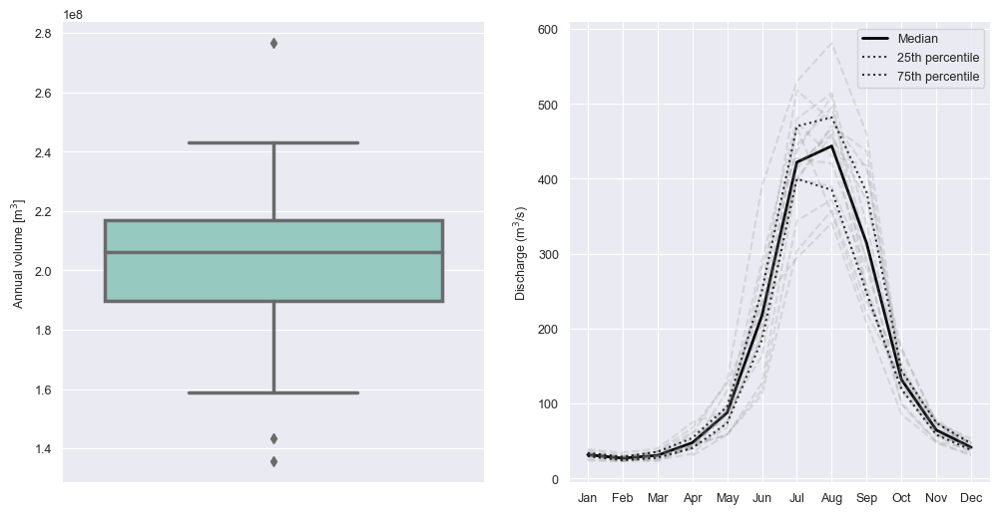

In [211]:

# resample the data to monthly means
monthly_mean = obs_disc_df.resample('M').mean()
monthly_median_grouped = monthly_mean.groupby(monthly_mean.index.month).median()
monthly_75_grouped = monthly_mean.groupby(monthly_mean.index.month).quantile(0.75)
monthly_25_grouped = monthly_mean.groupby(monthly_mean.index.month).quantile(0.25)

# create the plot
fig, ax = plt.subplots(1,2, figsize=(12, 6))

# plot the mean line
ax[1].plot(monthly_mean_grouped.index, monthly_mean_grouped['Total runoff [m^3 s^-1]'], color='black', label='Median', linewidth=2)

# fill in the range band
#ax.fill_between(monthly_mean_grouped.index, monthly_25_grouped['Total runoff [m^3 s^-1]'], monthly_75_grouped['Total runoff [m^3 s^-1]'], color='blue', alpha=0.3, label='25% to 75% range')

# set the x-axis labels to the month names
ax[1].set_xticks(range(1, 13))
ax[1].set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

# set the y-axis label
ax[1].set_ylabel('Discharge (m$^3$/s)')

# set the plot title
#ax.set_title('Mean Monthly River Discharge (2008-2023)')

# for i in range(2000, 2016):
#     df_sel = obs_disc_df.loc[obs_disc_df.index.year == i]
#     df_sel_monthly = df_sel.resample('M').mean()
#     ax.plot(df_sel_monthly.index, df_sel_monthly['Total runoff [m^3 s^-1]'], color='grey', alpha=0.3)

ax[1].plot(obs_2000_grouped.index, obs_2000_grouped['Total runoff [m^3 s^-1]'], color='grey', alpha=0.2, linestyle = '--')
ax[1].plot(obs_2001_grouped.index, obs_2001_grouped['Total runoff [m^3 s^-1]'], color='grey', alpha=0.2, linestyle = '--')
ax[1].plot(obs_2002_grouped.index, obs_2002_grouped['Total runoff [m^3 s^-1]'], color='grey', alpha=0.2, linestyle = '--')
ax[1].plot(obs_2003_grouped.index, obs_2003_grouped['Total runoff [m^3 s^-1]'], color='grey', alpha=0.2, linestyle = '--')
ax[1].plot(obs_2004_grouped.index, obs_2004_grouped['Total runoff [m^3 s^-1]'], color='grey', alpha=0.2, linestyle = '--')
ax[1].plot(obs_2005_grouped.index, obs_2005_grouped['Total runoff [m^3 s^-1]'], color='grey', alpha=0.2, linestyle = '--')
ax[1].plot(obs_2006_grouped.index, obs_2006_grouped['Total runoff [m^3 s^-1]'], color='grey', alpha=0.2, linestyle = '--')
ax[1].plot(obs_2007_grouped.index, obs_2007_grouped['Total runoff [m^3 s^-1]'], color='grey', alpha=0.2, linestyle = '--')
ax[1].plot(obs_2008_grouped.index, obs_2008_grouped['Total runoff [m^3 s^-1]'], color='grey', alpha=0.2, linestyle = '--')
ax[1].plot(obs_2009_grouped.index, obs_2009_grouped['Total runoff [m^3 s^-1]'], color='grey', alpha=0.2, linestyle = '--')
ax[1].plot(obs_2010_grouped.index, obs_2010_grouped['Total runoff [m^3 s^-1]'], color='grey', alpha=0.2, linestyle = '--')
ax[1].plot(obs_2011_grouped.index, obs_2011_grouped['Total runoff [m^3 s^-1]'], color='grey', alpha=0.2, linestyle = '--')
ax[1].plot(obs_2012_grouped.index, obs_2012_grouped['Total runoff [m^3 s^-1]'], color='grey', alpha=0.2, linestyle = '--')
ax[1].plot(obs_2013_grouped.index, obs_2013_grouped['Total runoff [m^3 s^-1]'], color='grey', alpha=0.2, linestyle = '--')
ax[1].plot(obs_2014_grouped.index, obs_2014_grouped['Total runoff [m^3 s^-1]'], color='grey', alpha=0.2, linestyle = '--')
ax[1].plot(obs_2015_grouped.index, obs_2015_grouped['Total runoff [m^3 s^-1]'], color='grey', alpha=0.2, linestyle = '--')
ax[1].plot(monthly_25_grouped.index, monthly_25_grouped['Total runoff [m^3 s^-1]'], color='black', label='25th percentile', alpha=0.8, linestyle = 'dotted')
ax[1].plot(monthly_75_grouped.index, monthly_75_grouped['Total runoff [m^3 s^-1]'], color='black', label='75th percentile', alpha=0.8, linestyle = 'dotted')
# display the plot

sns.boxplot(data=obs_disc_df_year, palette="Set3", linewidth=2.5, ax=ax[0])
sns.despine()
#ax[0].set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
ax[0].set_ylabel('Annual volume [m$^3$]')
ax[0].set_xticklabels('')
#ax[0].set_xlabel('Month')

plt.legend()
plt.show()


In [170]:
jan_disc = obs_disc_df_monthly.loc[obs_disc_df_monthly.index.month == 1]['discharge'].values
feb_disc = obs_disc_df_monthly.loc[obs_disc_df_monthly.index.month == 2]['discharge'].values
mar_disc = obs_disc_df_monthly.loc[obs_disc_df_monthly.index.month == 3]['discharge'].values
apr_disc = obs_disc_df_monthly.loc[obs_disc_df_monthly.index.month == 4]['discharge'].values
may_disc = obs_disc_df_monthly.loc[obs_disc_df_monthly.index.month == 5]['discharge'].values
jun_disc = obs_disc_df_monthly.loc[obs_disc_df_monthly.index.month == 6]['discharge'].values
jul_disc = obs_disc_df_monthly.loc[obs_disc_df_monthly.index.month == 7]['discharge'].values
aug_disc = obs_disc_df_monthly.loc[obs_disc_df_monthly.index.month == 8]['discharge'].values
sep_disc = obs_disc_df_monthly.loc[obs_disc_df_monthly.index.month == 9]['discharge'].values
oct_disc = obs_disc_df_monthly.loc[obs_disc_df_monthly.index.month == 10]['discharge'].values
nov_disc = obs_disc_df_monthly.loc[obs_disc_df_monthly.index.month == 11]['discharge'].values
dec_disc = obs_disc_df_monthly.loc[obs_disc_df_monthly.index.month == 12]['discharge'].values

monthly_disc = [jan_disc, feb_disc, mar_disc, apr_disc, may_disc, jun_disc, jul_disc, aug_disc, sep_disc, oct_disc, nov_disc, dec_disc]

In [178]:
monthly_disc_df = pd.DataFrame(monthly_disc).T
monthly_disc_df

,0,1,2,3,4,5,6,7,8,9,10,11
0,34.109677,28.103448,29.416129,59.546667,130.112903,390.033333,529.838710,580.967742,459.800000,143.045161,78.323333,48.393548
1,37.138710,30.992857,28.990323,40.376667,98.819355,290.066667,480.032258,514.129032,338.033333,138.732258,66.273333,46.867742
2,33.445161,29.760714,36.416129,67.196667,126.661290,234.230000,445.000000,495.290323,307.900000,142.325806,74.370000,53.232258
3,38.870968,34.210714,39.838710,74.626667,90.006452,255.000000,518.096774,477.451613,413.866667,145.870968,73.270000,46.454839
4,33.732258,28.855172,35.709677,43.790000,88.835484,205.346667,413.419355,467.645161,288.700000,174.806452,73.806667,47.980645
5,34.196774,28.689286,35.216129,52.096667,87.612903,163.796667,418.967742,459.290323,242.500000,123.312903,70.356667,43.577419
6,31.396774,28.675000,29.948387,42.703333,116.970968,225.000000,400.451613,389.258065,281.766667,119.993548,59.600000,39.732258
7,29.461290,27.625000,35.596774,61.306667,76.119355,192.483333,400.903226,457.225806,371.133333,170.967742,74.836667,43.500000
8,29.738710,24.051724,25.935484,40.523333,67.645161,281.330000,436.548387,510.774194,249.533333,116.596774,58.753333,40.222581
9,29.758065,24.550000,22.577419,42.736667,58.990323,111.830000,303.645161,357.612903,234.900000,153.190323,59.420000,39.916129


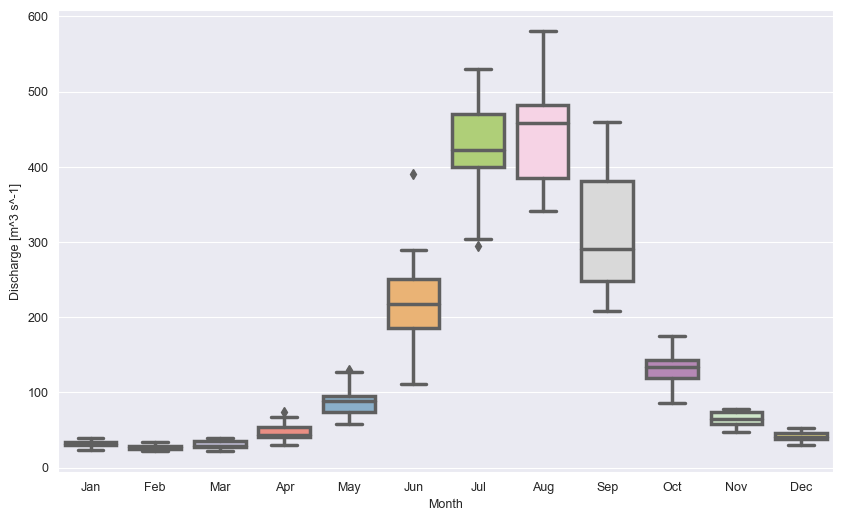

In [179]:
fig, ax = plt.subplots(figsize=(10, 6))
#sns.boxplot(data=monthly_disc_df[0], palette="Set3", linewidth=2.5)
sns.boxplot(data=monthly_disc_df, palette="Set3", linewidth=2.5)
ax.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
ax.set_ylabel('Discharge [m^3 s^-1]')
ax.set_xlabel('Month')
plt.show()

/Users/jacobqs/opt/miniconda3/envs/geohyd/lib/python3.10/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/jacobqs/opt/miniconda3/envs/geohyd/lib/python3.10/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/jacobqs/opt/miniconda3/envs/geohyd/lib/python3.10/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will resul

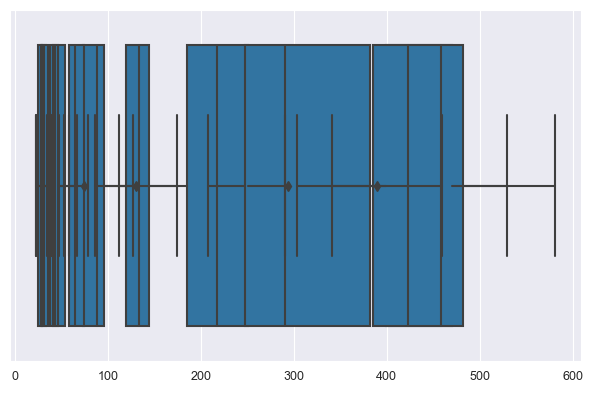

In [176]:
# # create a new column for the month of each data point
# obs_disc_df['Month'] = obs_disc_df.index.month

# create a list of the month names for labeling the x-axis
month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
fig, ax = plt.subplots(figsize=(6,4))
# loop through each month and create a figure with a boxplot for that month's data
for month in range(1,13):
    sns.boxplot(monthly_disc[month-1], ax=ax)
    # ax.set_title(f'{month_names[month-1]}: Hourly Discharge Boxplot (2008-2023)', fontsize=14)
    # ax.set_xlabel('Discharge (cfs)')
    plt.tight_layout()

# display the plots
plt.show()

<AxesSubplot:>

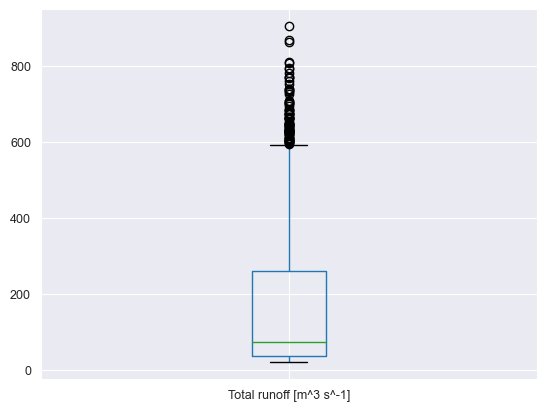

In [159]:
obs_disc_df.boxplot()

In [158]:
obs_disc_df

,Total runoff [m^3 s^-1]
Date,
2000-01-01,39.1
2000-01-02,39.1
2000-01-03,38.5
2000-01-04,38.5
2000-01-05,38.3
...,...
2015-12-27,25.4
2015-12-28,26.2
2015-12-29,27.3


In [112]:
sep_baseflow = sepBaseflow(obs_disc_df, 60, catchment_area)

Processing using a 60-minute interval...
2000-01-01 00:00:00
2000-01-01 01:00:00
2000-01-01 02:00:00
2000-01-01 03:00:00
2000-01-01 04:00:00
2000-01-01 05:00:00
2000-01-01 06:00:00
2000-01-01 07:00:00
2000-01-01 08:00:00
2000-01-01 09:00:00
2000-01-01 10:00:00
2000-01-01 11:00:00
2000-01-01 12:00:00
2000-01-01 13:00:00
2000-01-01 14:00:00
2000-01-01 15:00:00
2000-01-01 16:00:00
2000-01-01 17:00:00
2000-01-01 18:00:00
2000-01-01 19:00:00
2000-01-01 20:00:00
2000-01-01 21:00:00
2000-01-01 22:00:00
2000-01-01 23:00:00
2000-01-02 00:00:00
2000-01-02 01:00:00
2000-01-02 02:00:00
2000-01-02 03:00:00
2000-01-02 04:00:00
2000-01-02 05:00:00
2000-01-02 06:00:00
2000-01-02 07:00:00
2000-01-02 08:00:00
2000-01-02 09:00:00
2000-01-02 10:00:00
2000-01-02 11:00:00
2000-01-02 12:00:00
2000-01-02 13:00:00
2000-01-02 14:00:00
2000-01-02 15:00:00
2000-01-02 16:00:00
2000-01-02 17:00:00
2000-01-02 18:00:00
2000-01-02 19:00:00
2000-01-02 20:00:00
2000-01-02 21:00:00
2000-01-02 22:00:00
2000-01-02 23:00:00

In [113]:
sep_baseflow

,dt [hour],Total runoff [m^3 s^-1],Total runoff interp. [m^3 s^-1],Baseflow [m^3 s^-1],Peakflow [m^3 s^-1],Peak nr.,Peakflow starts,Peakflow ends,Flow volume [m^3],Max. flow [m^3 s^-1],Date max. flow,Tp [hour]
Date,,,,,,,,,,,,
2000-01-01 00:00:00,0.0,39.1,39.100000,39.100000,0.0,NaN,NaT,NaT,NaN,NaN,NaT,NaN
2000-01-01 01:00:00,1.0,NaN,39.100000,39.100000,0.0,NaN,NaT,NaT,NaN,NaN,NaT,NaN
2000-01-01 02:00:00,1.0,NaN,39.100000,39.100000,0.0,NaN,NaT,NaT,NaN,NaN,NaT,NaN
2000-01-01 03:00:00,1.0,NaN,39.100000,39.100000,0.0,NaN,NaT,NaT,NaN,NaN,NaT,NaN
2000-01-01 04:00:00,1.0,NaN,39.100000,39.100000,0.0,NaN,NaT,NaT,NaN,NaN,NaT,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
2015-12-30 20:00:00,1.0,NaN,27.033333,27.033333,0.0,NaN,NaT,NaT,NaN,NaN,NaT,NaN
2015-12-30 21:00:00,1.0,NaN,27.025000,27.025000,0.0,NaN,NaT,NaT,NaN,NaN,NaT,NaN
2015-12-30 22:00:00,1.0,NaN,27.016667,27.016667,0.0,NaN,NaT,NaT,NaN,NaN,NaT,NaN


In [98]:
obs_disc_df_monthly = obs_disc_df.resample('M').mean()

df_jan = obs_disc_df_monthly[obs_disc_df_monthly.index.month == 1]

In [99]:
df_jan

,discharge
2000-01-31,34.109677
2001-01-31,37.138710
2002-01-31,33.445161
2003-01-31,38.870968
2004-01-31,33.732258
2005-01-31,34.196774
2006-01-31,31.396774
2007-01-31,29.461290
2008-01-31,29.738710
2009-01-31,29.758065


In [97]:
obs_disc_df_monthly

,discharge
2000-01-31,34.109677
2000-02-29,28.103448
2000-03-31,29.416129
2000-04-30,59.546667
2000-05-31,130.112903
...,...
2015-08-31,340.935484
2015-09-30,207.900000
2015-10-31,85.764516
2015-11-30,47.496667


<AxesSubplot:>

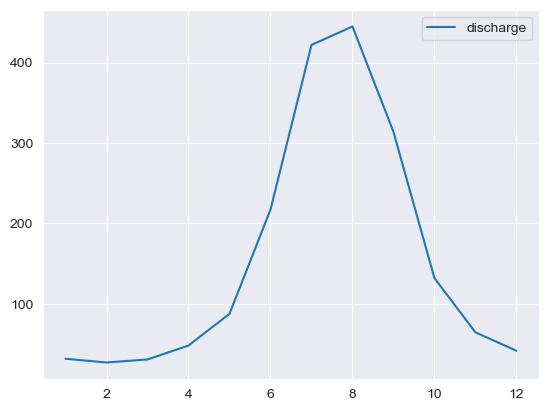

In [88]:
obs_disc_mean_monthly = obs_disc_df.groupby(obs_disc_df.index.month).mean()
obs_disc_monthly.plot()

<AxesSubplot:>

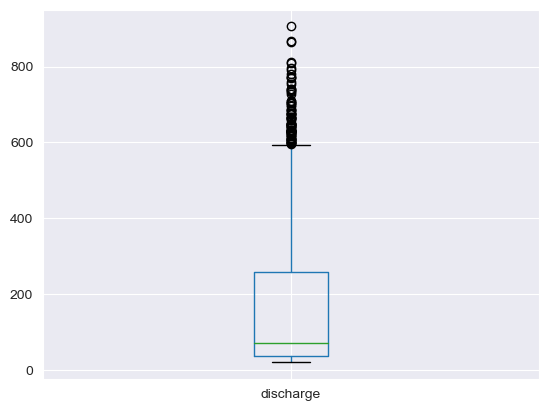

In [75]:
obs_disc_df.boxplot()

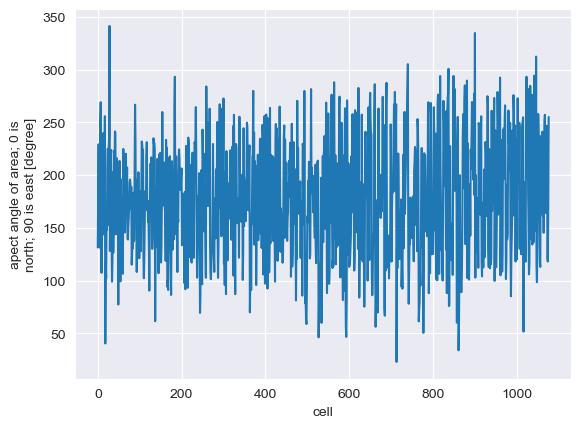

In [58]:
cell_data.aspect.plot()

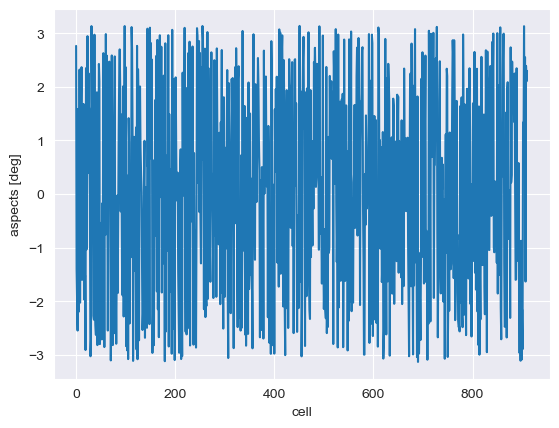

In [67]:
small_tin.aspects.plot()

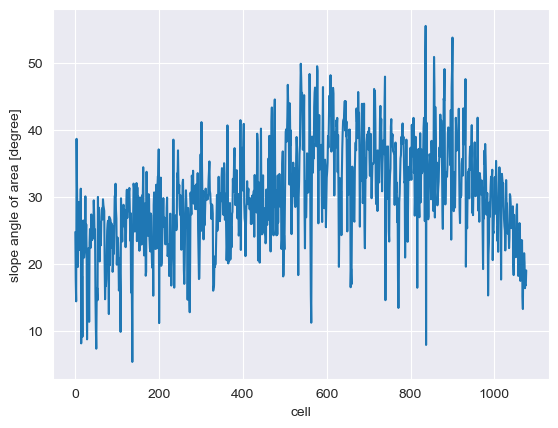

In [51]:
cell_data.slope.plot()

In [224]:
temp_vals = temp.temperature.mean(dim='time').values
precip_vals = precip.precipitation.mean(dim='time').values
temp_summer = temp.temperature.sel(time=temp.time.dt.season=='JJA').mean(dim='time').values
temp_winter = temp.temperature.sel(time=temp.time.dt.season=='DJF').mean(dim='time').values
precip_summer = precip.precipitation.sel(time=precip.time.dt.season=='JJA').mean(dim='time').values
precip_winter = precip.precipitation.sel(time=precip.time.dt.season=='DJF').mean(dim='time').values
z = temp.z.values
df = pd.DataFrame({'z': z, 'temp_mean': temp_vals, 'precip_mean': precip_vals, 'temp_summer': temp_summer, 'temp_winter': temp_winter, 'precip_summer': precip_summer, 'precip_winter': precip_winter})

In [225]:
df

,z,temp_mean,precip_mean,temp_summer,temp_winter,precip_summer,precip_winter
0,689.0,23.441659,0.239571,28.067324,16.017514,0.647534,0.021845
1,1457.0,14.753652,0.297666,20.432070,7.294317,0.761993,0.037581
2,4855.0,-3.241109,0.097195,4.447471,-10.930728,0.194294,0.038778
3,5159.0,-1.992619,0.025982,6.078557,-10.081558,0.052432,0.018724
4,1258.0,22.736058,0.219735,27.544936,15.290993,0.597959,0.018731
5,2163.0,8.675573,0.245798,15.288448,0.966945,0.626784,0.036977
6,4381.0,-6.305936,0.126659,1.593921,-13.891532,0.243530,0.053257
7,4532.0,-2.873454,0.066405,5.335223,-10.992938,0.123126,0.039265
8,2083.0,18.711469,0.222083,24.155115,11.182055,0.598140,0.020595
9,4063.0,3.520001,0.184543,10.848155,-4.408231,0.475691,0.030318


In [5]:
model_temp = LinearRegression()
model_temp = LinearRegression().fit(z.reshape(-1,1), temp_vals)
coeff_temp = np.abs(model_temp.coef_)
intercept_temp = model_temp.intercept_
r_sq_temp = model_temp.score(z.reshape(-1,1), temp_vals)

model_temp_summer = LinearRegression()
model_temp_summer = LinearRegression().fit(z.reshape(-1,1), temp_summer)
coeff_temp_summer = np.abs(model_temp_summer.coef_)
intercept_temp_summer = model_temp_summer.intercept_
r_sq_temp_summer = model_temp_summer.score(z.reshape(-1,1), temp_summer)

model_temp_winter = LinearRegression()
model_temp_winter = LinearRegression().fit(z.reshape(-1,1), temp_winter)
coeff_temp_winter = np.abs(model_temp_winter.coef_)
intercept_temp_winter = model_temp_winter.intercept_
r_sq_temp_winter = model_temp_winter.score(z.reshape(-1,1), temp_winter)

model_precip = LinearRegression()
model_precip = LinearRegression().fit(z.reshape(-1,1), precip_vals)
coeff_precip = np.abs(model_precip.coef_)
intercept_precip = model_precip.intercept_
r_sq_precip = model_precip.score(z.reshape(-1,1), precip_vals)

model_precip_summer = LinearRegression()
model_precip_summer = LinearRegression().fit(z.reshape(-1,1), precip_summer)
coeff_precip_summer = np.abs(model_precip_summer.coef_)
intercept_precip_summer = model_precip_summer.intercept_
r_sq_precip_summer = model_precip_summer.score(z.reshape(-1,1), precip_summer)

model_precip_winter = LinearRegression()
model_precip_winter = LinearRegression().fit(z.reshape(-1,1), precip_winter)
coeff_precip_winter = np.abs(model_precip_winter.coef_)
intercept_precip_winter = model_precip_winter.intercept_
r_sqrt_precip_winter = model_precip_winter.score(z.reshape(-1,1), precip_winter)

In [220]:
from sklearn.preprocessing import PolynomialFeatures
poly = PolynomialFeatures(degree=4, include_bias=False)
poly_features = poly.fit_transform(z.reshape(-1,1))
poly_reg_model_precip = LinearRegression()
poly_reg_model_precip.fit(poly_features, precip_vals)
y_pred_precip = poly_reg_model_precip.predict(poly_features)


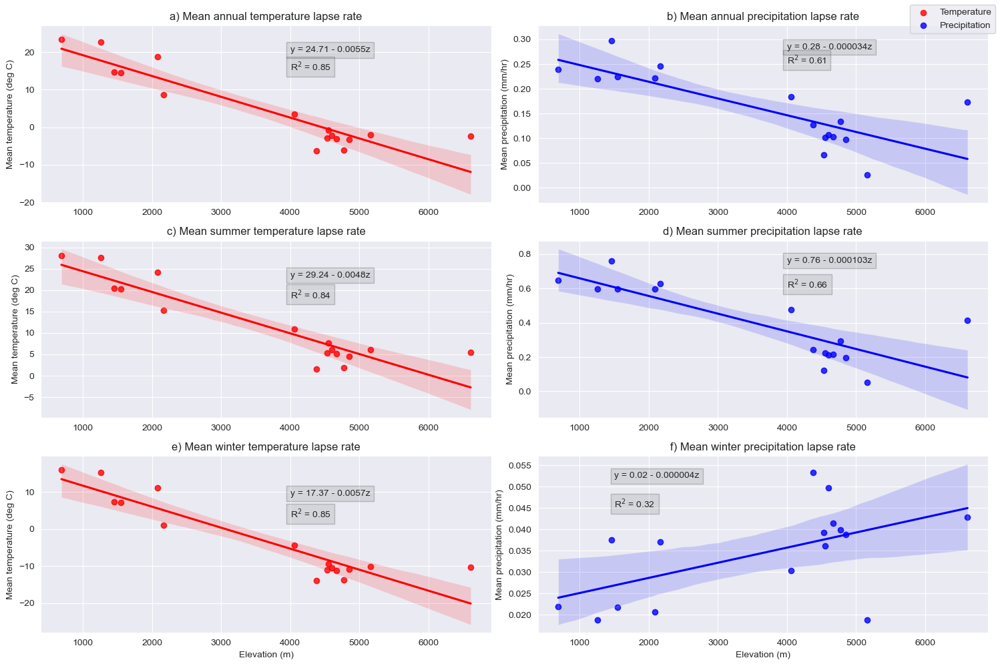

In [221]:
fig, ax = plt.subplots(3, 2, figsize=(15, 10))
sns.regplot(x='z', y='temp_mean', data=df, ax=ax[0,0], color='red', label='Temperature')
sns.regplot(x='z', y='precip_mean', data=df, ax=ax[0,1], color='blue', label='Precipitation')
sns.regplot(x='z', y='temp_summer', data=df, ax=ax[1,0], color='red')
sns.regplot(x='z', y='precip_summer', data=df, ax=ax[1,1], color='blue')
sns.regplot(x='z', y='temp_winter', data=df, ax=ax[2,0], color='red')
sns.regplot(x='z', y='precip_winter', data=df, ax=ax[2,1], color='blue')

ax[0,0].set_title('a) Mean annual temperature lapse rate')
ax[0,1].set_title('b) Mean annual precipitation lapse rate')
ax[1,0].set_title('c) Mean summer temperature lapse rate')
ax[1,1].set_title('d) Mean summer precipitation lapse rate')
ax[2,0].set_title('e) Mean winter temperature lapse rate')
ax[2,1].set_title('f) Mean winter precipitation lapse rate')
ax[0,0].set_xlabel('')
ax[0,1].set_xlabel('')
ax[1,0].set_xlabel('')
ax[1,1].set_xlabel('')
ax[2,0].set_xlabel('Elevation (m)')
ax[2,1].set_xlabel('Elevation (m)')

ax[0,0].set_ylabel('Mean temperature (deg C)')
ax[1,0].set_ylabel('Mean temperature (deg C)')
ax[2,0].set_ylabel('Mean temperature (deg C)')
ax[0,1].set_ylabel('Mean precipitation (mm/hr)')
ax[1,1].set_ylabel('Mean precipitation (mm/hr)')
ax[2,1].set_ylabel('Mean precipitation (mm/hr)')
t1 = ax[0,0].text(4000,15, f'R$^2$ = {r_sq_temp:.2f}')
t1.set_bbox(dict(facecolor='grey', alpha=0.2, edgecolor='black'))

t2 = ax[0,0].text(4000, 20, f'y = {intercept_temp:.2f} - {coeff_temp[0]:.4f}z')
t2.set_bbox(dict(facecolor='grey', alpha=0.2, edgecolor='black'))

t3 = ax[0,1].text(4000, 0.25, f'R$^2$ = {r_sq_precip:.2f}')
t3.set_bbox(dict(facecolor='grey', alpha=0.2, edgecolor='black'))
t4 = ax[0,1].text(4000, 0.28, f'y = {intercept_precip:.2f} - {coeff_precip[0]:.6f}z')
t4.set_bbox(dict(facecolor='grey', alpha=0.2, edgecolor='black'))

t5 = ax[1,0].text(4000, 18, f'R$^2$ = {r_sq_temp_summer:.2f}')
t5.set_bbox(dict(facecolor='grey', alpha=0.2, edgecolor='black'))
t6 = ax[1,0].text(4000, 23, f'y = {intercept_temp_summer:.2f} - {coeff_temp_summer[0]:.4f}z')
t6.set_bbox(dict(facecolor='grey', alpha=0.2, edgecolor='black'))

t7 = ax[1,1].text(4000, 0.6, f'R$^2$ = {r_sq_precip_summer:.2f}')
t7.set_bbox(dict(facecolor='grey', alpha=0.2, edgecolor='black'))
t8 = ax[1,1].text(4000, 0.75, f'y = {intercept_precip_summer:.2f} - {coeff_precip_summer[0]:.6f}z')
t8.set_bbox(dict(facecolor='grey', alpha=0.2, edgecolor='black'))

t9 = ax[2,0].text(4000, 3, f'R$^2$ = {r_sq_temp_winter:.2f}')
t9.set_bbox(dict(facecolor='grey', alpha=0.2, edgecolor='black'))
t10 = ax[2,0].text(4000, 9, f'y = {intercept_temp_winter:.2f} - {coeff_temp_winter[0]:.4f}z')
t10.set_bbox(dict(facecolor='grey', alpha=0.2, edgecolor='black'))

t11 = ax[2,1].text(1500, 0.045, f'R$^2$ = {r_sqrt_precip_winter:.2f}')
t11.set_bbox(dict(facecolor='grey', alpha=0.2, edgecolor='black'))
t12 = ax[2,1].text(1500, 0.052, f'y = {intercept_precip_winter:.2f} - {coeff_precip_winter[0]:.6f}z')
t12.set_bbox(dict(facecolor='grey', alpha=0.2, edgecolor='black'))

fig.set_tight_layout(True)


fig.legend()

In [119]:
x, y = temp.x.values , temp.y.values

# Analysis of cell data and TINS

In [295]:
cell_data_stacked = cell_data.stack()

In [296]:
cell_data.sel(cell=10).area.values

array(4000000.)

In [297]:
x_stacked_reg = cell_data_stacked.x.values
y_stacked_reg = cell_data_stacked.y.values

x_small = small_tin.x.values
y_small = small_tin.y.values

x_avg = avg_tin.x.values
y_avg = avg_tin.y.values

x_bigger = bigger_tin.x.values
y_bigger = bigger_tin.y.values

x_largest = largest_tin.x.values
y_largest = largest_tin.y.values

reg_z = cell_data.z.values
small_z = small_tin.z.values
avg_z = avg_tin.z.values
bigger_tin_z = bigger_tin.z.values
largest_tin_z = largest_tin.z.values

reg_glac = cell_data['glacier-fraction'].values
small_glac = small_tin['glacier-fraction'].values
avg_glac = avg_tin['glacier-fraction'].values
bigger_tin_glac = bigger_tin['glacier-fraction'].values
largest_tin_glac = largest_tin['glacier-fraction'].values

reg_for = cell_data['forest-fraction'].values
small_for = small_tin['forest-fraction'].values
avg_for = avg_tin['forest-fraction'].values
bigger_tin_for = bigger_tin['forest-fraction'].values
largest_tin_for = largest_tin['forest-fraction'].values

reg_lake = cell_data['lake-fraction'].values
small_lake = small_tin['lake-fraction'].values
avg_lake = avg_tin['lake-fraction'].values
bigger_tin_lake = bigger_tin['lake-fraction'].values
largest_tin_lake = largest_tin['lake-fraction'].values


reg_area = cell_data.area.values * 1e-6
small_area = small_tin.area.values * 1e-6
avg_area = avg_tin.area.values * 1e-6
bigger_tin_area = bigger_tin.area.values * 1e-6
largest_tin_area = largest_tin.area.values * 1e-6

In [320]:
np.min(avg_tin['lake-fraction'].values)

0.0

In [37]:


# print(np.mean(reg_area))
# print(np.mean(small_area))
# print(np.mean(avg_area))
# print(np.mean(bigger_tin_area))
# print(np.mean(largest_tin_area))

# print(np.min(reg_area))
# print(np.min(small_area))
# print(np.min(avg_area))
# print(np.min(bigger_tin_area))
# print(np.min(largest_tin_area))

# print(np.max(reg_area))
# print(np.max(small_area))
# print(np.max(avg_area))
# print(np.max(bigger_tin_area))
# print(np.max(largest_tin_area))

# print(np.std(reg_area))
# print(np.std(small_area))
# print(np.std(avg_area))
# print(np.std(bigger_tin_area))
# print(np.std(largest_tin_area))


# print(np.mean(reg_z))
# print(np.mean(small_z))
# print(np.mean(avg_z))
# print(np.mean(bigger_tin_z))
# print(np.mean(largest_tin_z))

# print(np.min(reg_z))
# print(np.min(small_z))
# print(np.min(avg_z))
# print(np.min(bigger_tin_z))
# print(np.min(largest_tin_z))

# print(np.max(reg_z))
# print(np.max(small_z))
# print(np.max(avg_z))
# print(np.max(bigger_tin_z))
# print(np.max(largest_tin_z))

print(np.std(reg_z))
print(np.std(small_z))
print(np.std(avg_z))
print(np.std(bigger_tin_z))
print(np.std(largest_tin_z))

1282.75451174811
1241.6669
1238.5461
1249.803
1257.4574


In [32]:
area = np.concatenate((reg_area, small_area, avg_area, bigger_tin_area, largest_tin_area))

In [33]:
area

array([1.86119678, 2.48758703, 0.46135942, ..., 0.43554306, 0.29408953,
       0.68146861])

/Users/jacobqs/opt/miniconda3/envs/geohyd/lib/python3.10/site-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))


<AxesSubplot:>

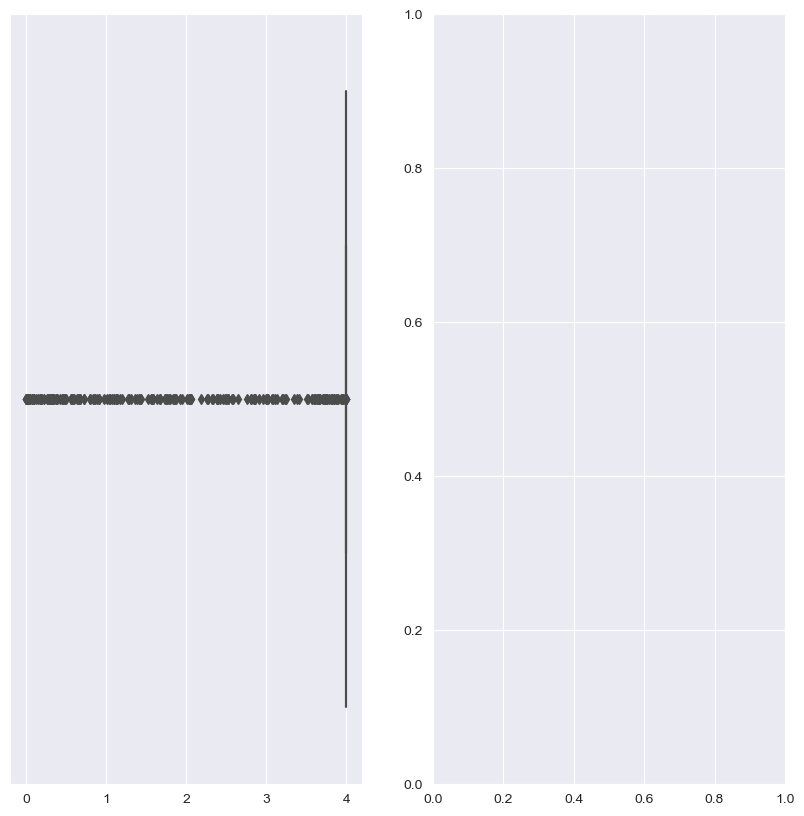

In [26]:
fig, ax = plt.subplots(1,2, figsize=(10,10))

sns.boxplot(x=reg_area, ax=ax[0], color='blue', orient='v')

In [301]:
crs_32645 = CRS.from_epsg(32645) # CRS from cell_data file
crs_4326 = CRS.from_epsg(4326) # Lat-lon


## Create transformer to convert from CRS to CRS

transformer = Transformer.from_crs(crs_32645, crs_4326, always_xy = True)

lon_reg, lat_reg = transformer.transform(x_stacked_reg, y_stacked_reg)
lon_small, lat_small = transformer.transform(x_small, y_small)
lon_avg, lat_avg = transformer.transform(x_avg, y_avg)
lon_bigger, lat_bigger = transformer.transform(x_bigger, y_bigger)
lon_largest, lat_largest = transformer.transform(x_largest, y_largest)

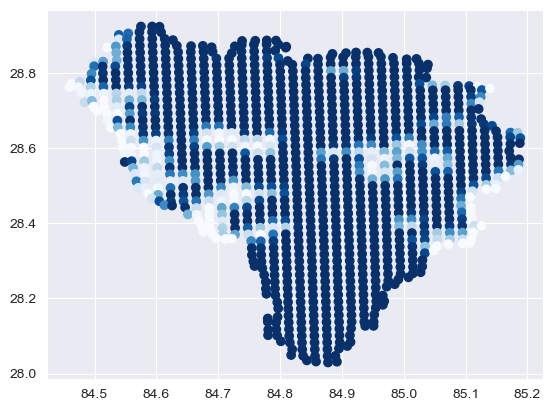

In [321]:
plt.scatter(lon_reg, lat_reg, c = cell_data['glacier-fraction'], cmap = 'Blues_r')

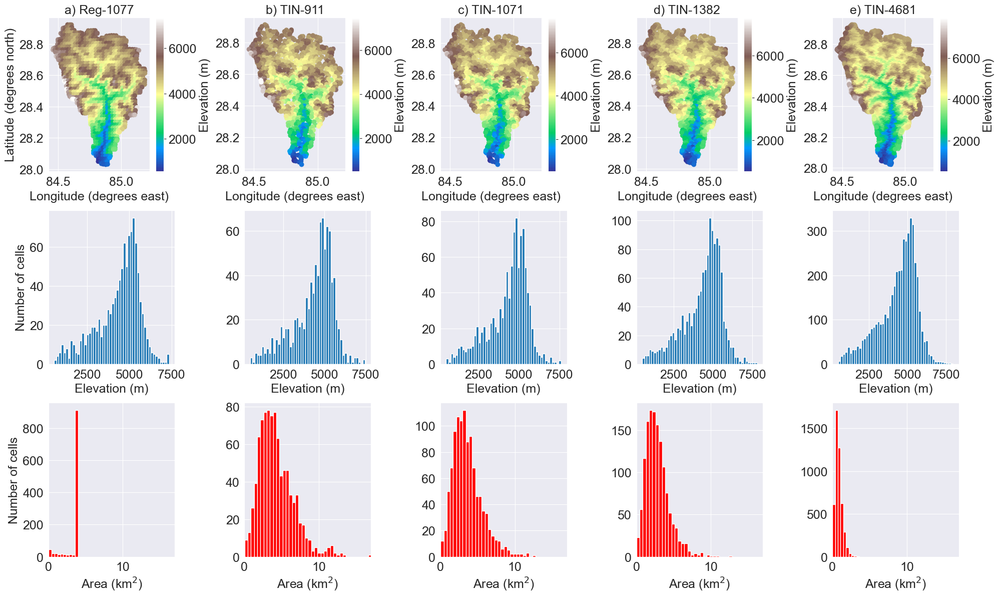

In [388]:
fig, ax = plt.subplots(3, 5, figsize=(20, 12))

ax[0,0].set_title('a) Reg-1077', fontsize=18)
im1 = ax[0,0].scatter(lon_reg, lat_reg, c=reg_z, cmap='terrain')
ax[0,0].set_xlabel('Longitude (degrees east)', fontsize=18) 
ax[0,0].set_ylabel('Latitude (degrees north)', fontsize=18)
cbar1 = fig.colorbar(im1, ax=ax[0,0])
cbar1.ax.tick_params(labelsize=18)
cbar1.set_label('Elevation (m)', fontsize=18)

ax[0,1].set_title('b) TIN-911', fontsize=18)
im2 = ax[0,1].scatter(lon_small, lat_small, c=small_z, cmap='terrain')
cbar2 = fig.colorbar(im2, ax=ax[0,1])
cbar2.set_label('Elevation (m)', fontsize=18)
cbar2.ax.tick_params(labelsize=18)
ax[0,1].set_xlabel('Longitude (degrees east)', fontsize=18)

ax[0,2].set_title('c) TIN-1071', fontsize=18)
im3 = ax[0,2].scatter(lon_avg, lat_avg, c=avg_z, cmap='terrain')
cbar3 = fig.colorbar(im3, ax=ax[0,2])
cbar3.set_label('Elevation (m)', fontsize=18)
cbar3.ax.tick_params(labelsize=18)
ax[0,2].set_xlabel('Longitude (degrees east)', fontsize=18)

ax[0,3].set_title('d) TIN-1382', fontsize=18)
im4 = ax[0,3].scatter(lon_bigger, lat_bigger, c=bigger_tin_z, cmap='terrain')
cbar4 = fig.colorbar(im4, ax=ax[0,3])
cbar4.set_label('Elevation (m)', fontsize=18)
cbar4.ax.tick_params(labelsize=18)
ax[0,3].set_xlabel('Longitude (degrees east)', fontsize=18)

ax[0,4].set_title('e) TIN-4681', fontsize=18)
im5 = ax[0,4].scatter(lon_largest, lat_largest, c=largest_tin_z, cmap='terrain')
cbar5 = fig.colorbar(im5, ax=ax[0,4])
cbar5.ax.tick_params(labelsize=18)
cbar5.set_label('Elevation (m)', fontsize=18)
ax[0,4].set_xlabel('Longitude (degrees east)', fontsize=18)


ax[1,0].hist(reg_z, bins=50)
ax[1,0].set_ylabel('Number of cells', fontsize=18)
ax[1,0].set_xlabel('Elevation (m)', fontsize=18)

ax[1,1].hist(small_z, bins=50)
ax[1,1].set_xlabel('Elevation (m)', fontsize=18)

ax[1,2].hist(avg_z, bins=50)
ax[1,2].set_xlabel('Elevation (m)', fontsize=18)

ax[1,3].hist(bigger_tin_z, bins=50)
ax[1,3].set_xlabel('Elevation (m)', fontsize=18)

ax[1,4].hist(largest_tin_z, bins=50)
ax[1,4].set_xlabel('Elevation (m)', fontsize=18)

ax[2,0].hist(reg_area, bins=10, color = 'red')

ax[2,1].hist(small_area, bins=40, color = 'red')

ax[2,2].hist(avg_area, bins=30, color = 'red')

ax[2,3].hist(bigger_tin_area, bins=30, color = 'red')

ax[2,4].hist(largest_tin_area, bins=10, color = 'red')

ax[2,0].set_ylabel('Number of cells', fontsize=18)

ax[2,0].set_xlabel('Area (km$^2$)', fontsize=18)
ax[2,1].set_xlabel('Area (km$^2$)', fontsize=18)
ax[2,2].set_xlabel('Area (km$^2$)', fontsize=18)
ax[2,3].set_xlabel('Area (km$^2$)', fontsize=18)
ax[2,4].set_xlabel('Area (km$^2$)', fontsize=18)

# show xlabel 

ax[0,0].tick_params(axis='both', labelsize=18)
ax[0,1].tick_params(axis='both', labelsize=18)
ax[0,2].tick_params(axis='both', labelsize=18)
ax[0,3].tick_params(axis='both', labelsize=18)
ax[0,4].tick_params(axis='both', labelsize=18)
ax[1,0].tick_params(axis='both', labelsize=18)
ax[1,1].tick_params(axis='both', labelsize=18)
ax[1,2].tick_params(axis='both', labelsize=18)
ax[1,3].tick_params(axis='both', labelsize=18)
ax[1,4].tick_params(axis='both', labelsize=18)
ax[2,0].tick_params(axis='both', labelsize=18)
ax[2,1].tick_params(axis='both', labelsize=18)
ax[2,2].tick_params(axis='both', labelsize=18)
ax[2,3].tick_params(axis='both', labelsize=18)
ax[2,4].tick_params(axis='both', labelsize=18)

ax[2,0].set_xlim(0, 17)
ax[2,1].set_xlim(0, 17)
ax[2,2].set_xlim(0, 17)
ax[2,3].set_xlim(0, 17)
ax[2,4].set_xlim(0, 17)


plt.tight_layout()

plt.show()


In [299]:
south = 28.00
north = 28.94
west = 84.47
east = 85.21

In [305]:

import geopandas as gpd

In [306]:
glims_shapefile = gpd.read_file('../data/glims/glims_download_72354/glims_polygons.shp')
glacier_polygons = glims_shapefile.to_crs(epsg=4326)
glacier_polygons = glacier_polygons.cx[west:east, south:north]

In [322]:
small_lake

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.

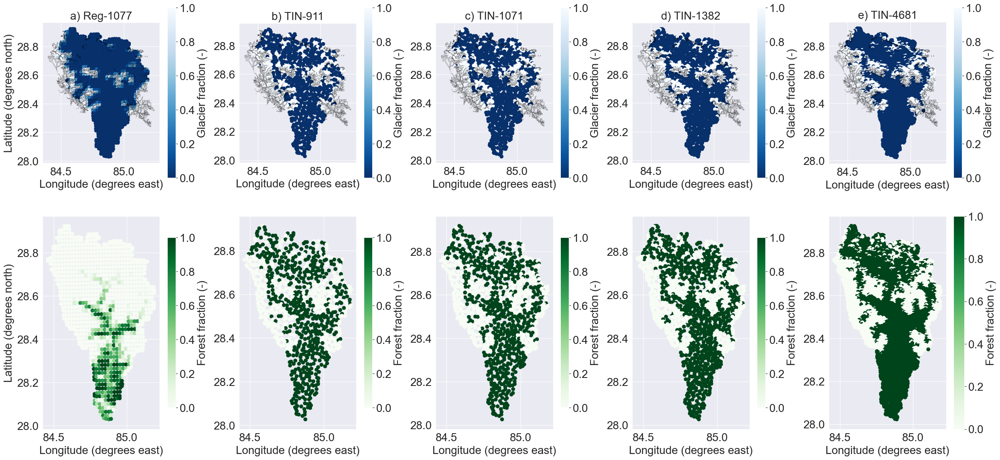

In [332]:
fig, ax = plt.subplots(2, 5, figsize=(25, 12))

ax[0,0].set_title('a) Reg-1077', fontsize=20)
im1 = ax[0,0].scatter(lon_reg, lat_reg, c=reg_glac, cmap='Blues_r')
ax[0,0].set_ylabel('Latitude (degrees north)', fontsize=20)
cbar1 = fig.colorbar(im1, ax=ax[0,0],shrink=0.8)
cbar1.set_label('Glacier fraction (-)', fontsize=20)
ax[0,0].set_xlabel('Longitude (degrees east)', fontsize=20)
glacier_polygons.plot(ax=ax[0,0], edgecolor='black', linewidth=0.5, alpha = 0.2, facecolor = 'none')

ax[0,1].set_title('b) TIN-911', fontsize=20)
im2 = ax[0,1].scatter(lon_small, lat_small, c=small_glac, cmap='Blues_r')
cbar2 = fig.colorbar(im2, ax=ax[0,1],shrink=0.8)
cbar2.set_label('Glacier fraction (-)', fontsize=20)
ax[0,1].set_xlabel('Longitude (degrees east)', fontsize=20)
glacier_polygons.plot(ax=ax[0,1], edgecolor='black', linewidth=0.5, alpha = 0.2, facecolor = 'none')

ax[0,2].set_title('c) TIN-1071', fontsize=20)
im3 = ax[0,2].scatter(lon_avg, lat_avg, c=avg_glac, cmap='Blues_r')
cbar3 = fig.colorbar(im3, ax=ax[0,2],shrink=0.8)
cbar3.set_label('Glacier fraction (-)', fontsize=20)
ax[0,2].set_xlabel('Longitude (degrees east)', fontsize=20)
glacier_polygons.plot(ax=ax[0,2], edgecolor='black', linewidth=0.5, alpha = 0.2, facecolor = 'none')

ax[0,3].set_title('d) TIN-1382', fontsize=20)
im4 = ax[0,3].scatter(lon_bigger, lat_bigger, c=bigger_tin_glac, cmap='Blues_r')
cbar4 = fig.colorbar(im4, ax=ax[0,3],shrink=0.8)
cbar4.set_label('Glacier fraction (-)', fontsize=20)
ax[0,3].set_xlabel('Longitude (degrees east)', fontsize=20)
glacier_polygons.plot(ax=ax[0,3], edgecolor='black', linewidth=0.5, alpha = 0.2, facecolor = 'none')

ax[0,4].set_title('e) TIN-4681', fontsize=20)
im5 = ax[0,4].scatter(lon_largest, lat_largest, c=largest_tin_glac, cmap='Blues_r')
cbar5 = fig.colorbar(im5, ax=ax[0,4],shrink=0.8)
cbar5.set_label('Glacier fraction (-)', fontsize=20)
ax[0,4].set_xlabel('Longitude (degrees east)', fontsize=20)
glacier_polygons.plot(ax=ax[0,4], edgecolor='black', linewidth=0.5, alpha = 0.2, facecolor = 'none')

im6 = ax[1,0].scatter(lon_reg, lat_reg, c=reg_for, cmap='Greens')
cbar6 = fig.colorbar(im6, ax=ax[1,0],shrink=0.8)
cbar6.set_label('Forest fraction (-)', fontsize=20) 
ax[1,0].set_ylabel('Latitude (degrees north)', fontsize=20)
ax[1,0].set_xlabel('Longitude (degrees east)', fontsize=20)

im7 = ax[1,1].scatter(lon_small, lat_small, c=small_for, cmap='Greens')
cbar7 = fig.colorbar(im7, ax=ax[1,1],shrink=0.8)
cbar7.set_label('Forest fraction (-)', fontsize=20)
ax[1,1].set_xlabel('Longitude (degrees east)', fontsize=20) 

im8 = ax[1,2].scatter(lon_avg, lat_avg, c=avg_for, cmap='Greens')
cbar8 = fig.colorbar(im8, ax=ax[1,2],shrink=0.8)
cbar8.set_label('Forest fraction (-)', fontsize=20)
ax[1,2].set_xlabel('Longitude (degrees east)', fontsize=20) 

im9 = ax[1,3].scatter(lon_bigger, lat_bigger, c=bigger_tin_for, cmap='Greens')
cbar9 = fig.colorbar(im9, ax=ax[1,3],shrink=0.8)
cbar9.set_label('Forest fraction (-)', fontsize=20)
ax[1,3].set_xlabel('Longitude (degrees east)', fontsize=20) 


im10 = ax[1,4].scatter(lon_largest, lat_largest, c=largest_tin_for, cmap='Greens')
cbar10 = fig.colorbar(im10, ax=ax[1,4])
cbar10.set_label('Forest fraction (-)', fontsize=20)
ax[1,4].set_xlabel('Longitude (degrees east)', fontsize=20) 

# im11 = ax[2,0].scatter(lon_reg, lat_reg, c=reg_lake, cmap='Blues')
# cbar11 = fig.colorbar(im11, ax=ax[2,0])
# cbar11.set_label('Lake fraction (-)', fontsize=20)
# ax[2,0].set_ylabel('Latitude (degrees north)', fontsize=20)
# ax[2,0].set_xlabel('Longitude (degrees east)', fontsize=20)

# im12 = ax[2,1].scatter(lon_small, lat_small, c=small_lake, cmap='Blues')
# cbar12 = fig.colorbar(im12, ax=ax[2,1])
# cbar12.set_label('Lake fraction (-)', fontsize=20)
# ax[2,1].set_xlabel('Longitude (degrees east)', fontsize=20)

# im13 = ax[2,2].scatter(lon_avg, lat_avg, c=avg_lake, cmap='Blues')
# cbar13 = fig.colorbar(im13, ax=ax[2,2])
# cbar13.set_label('Lake fraction (-)', fontsize=20)
# ax[2,2].set_xlabel('Longitude (degrees east)', fontsize=20)

# im14 = ax[2,3].scatter(lon_bigger, lat_bigger, c=bigger_tin_lake, cmap='Blues_r')
# cbar14 = fig.colorbar(im14, ax=ax[2,3])
# cbar14.set_label('Lake fraction (-)', fontsize=20)
# ax[2,3].set_xlabel('Longitude (degrees east)', fontsize=20)

# im15 = ax[2,4].scatter(lon_largest, lat_largest, c=largest_tin_lake, cmap='Blues')
# cbar15 = fig.colorbar(im15, ax=ax[2,4])
# cbar15.set_label('Lake fraction (-)', fontsize=20)
# ax[2,4].set_xlabel('Longitude (degrees east)', fontsize=20)

cbar1.ax.tick_params(labelsize=20)
cbar2.ax.tick_params(labelsize=20)
cbar3.ax.tick_params(labelsize=20)
cbar4.ax.tick_params(labelsize=20)
cbar5.ax.tick_params(labelsize=20)
cbar6.ax.tick_params(labelsize=20)
cbar7.ax.tick_params(labelsize=20)
cbar8.ax.tick_params(labelsize=20)
cbar9.ax.tick_params(labelsize=20)
cbar10.ax.tick_params(labelsize=20)
# cbar11.ax.tick_params(labelsize=20)
# cbar12.ax.tick_params(labelsize=20)
# cbar13.ax.tick_params(labelsize=20)
# cbar14.ax.tick_params(labelsize=20)
# cbar15.ax.tick_params(labelsize=20)

ax[0,0].tick_params(axis='both', labelsize=20)
ax[0,1].tick_params(axis='both', labelsize=20)
ax[0,2].tick_params(axis='both', labelsize=20)
ax[0,3].tick_params(axis='both', labelsize=20)
ax[0,4].tick_params(axis='both', labelsize=20)
ax[1,0].tick_params(axis='both', labelsize=20)
ax[1,1].tick_params(axis='both', labelsize=20)
ax[1,2].tick_params(axis='both', labelsize=20)
ax[1,3].tick_params(axis='both', labelsize=20)  
ax[1,4].tick_params(axis='both', labelsize=20)
# ax[2,0].tick_params(axis='both', labelsize=20)
# ax[2,1].tick_params(axis='both', labelsize=20)
# ax[2,2].tick_params(axis='both', labelsize=20)
# ax[2,3].tick_params(axis='both', labelsize=20)
# ax[2,4].tick_params(axis='both', labelsize=20)

# cbar11.ax.set_ylim(0, 1)
# cbar12.ax.set_ylim(0, 1)
# cbar13.ax.set_ylim(0, 1)
# cbar14.ax.set_ylim(0, 1)
# cbar15.ax.set_ylim(0, 1)



fig.tight_layout()
plt.show()


# Analysis of input data

In [5]:
precip_hma_d = precip_hma.resample(time='D').sum()
temp_hma_d = temp_hma.resample(time='D').mean()

In [6]:
month_length_temp = temp_hma.time.dt.days_in_month
weights_temp = (month_length_temp.groupby("time.season") / month_length_temp.groupby("time.season").sum())
# Test that the sum of the weights for each season is 1.0
np.testing.assert_allclose(weights_temp.groupby("time.season").sum().values, np.ones(4))
temp_season_resampled = (temp_hma * weights_temp).groupby("time.season").sum(dim="time")

month_length_precip = precip_hma_d.time.dt.days_in_month
weights_length_precip = (month_length_precip.groupby("time.season") / month_length_precip.groupby("time.season").sum())
np.testing.assert_allclose(weights_length_precip.groupby("time.season").sum().values, np.ones(4))
precip_season_resampled = (precip_hma_d * weights_length_precip).groupby("time.season").sum(dim="time")

In [20]:
temp_hma_season = (temp_hma_d * weights_temp).groupby("time.season").sum(dim="time")
precip_hma_season = (precip_hma_d * weights_length_precip).groupby("time.season").sum(dim="time")


In [13]:
import geopandas as gpd

In [14]:
gpd = gpd.read_file('../data/countries_geojson/countries.geojson')

In [39]:
# Resample the dataset to a seasonal frequency and calculate the sum
seasonal_acc_precip = precip_hma.resample(time='QS-DEC').sum(dim='time').groupby('time.season').sum(dim='time')


KeyboardInterrupt: 

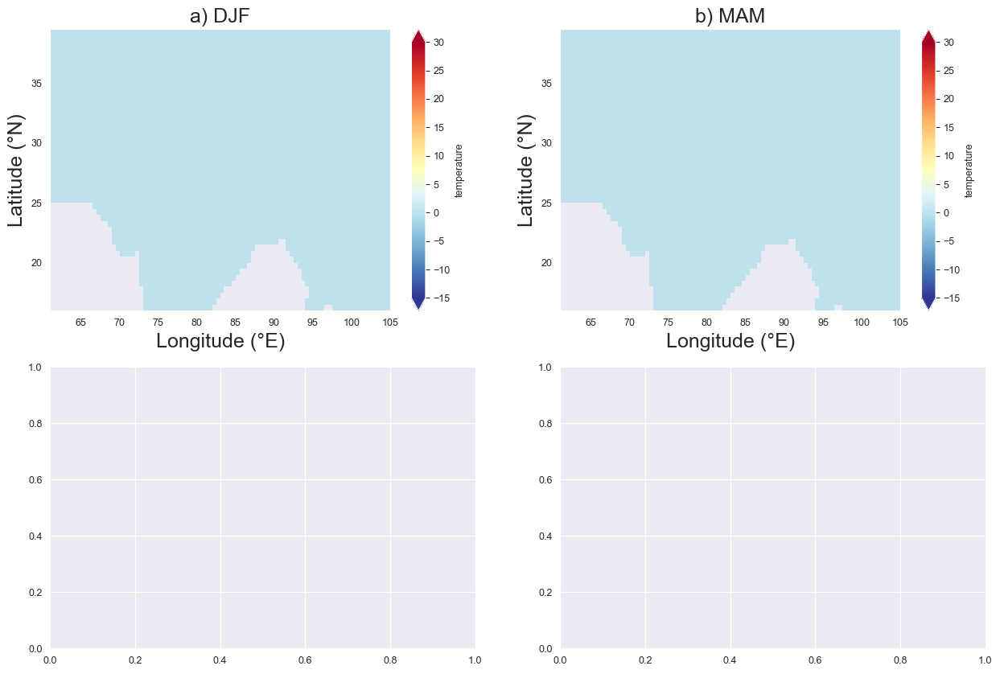

In [15]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15,10))


djf = temp_hma_season.temperature.sel(season='DJF').plot.pcolormesh(
                    ax=axes[0, 0],
                    vmin= -15,
                    vmax=30,
                    cmap= 'RdYlBu_r',
                    add_colorbar=True,
                    extend="both",
                )
axes[0, 0].set_ylabel('Latitude (°N)', fontsize=18)
axes[0, 0].set_xlabel('Longitude (°E)', fontsize=18)
axes[0, 0].set_title('a) DJF', fontsize=18)

# set colorbar label
#axes[0, 0].collections[0].colorbar.set_label('Temperature (deg C)', fontsize=18)

mam = temp_hma_season.temperature.sel(season='MAM').plot.pcolormesh(
                    ax=axes[0, 1],
                    vmin= -15,
                    vmax=30,
                    cmap= 'RdYlBu_r',
                    add_colorbar=True,
                    extend="both",
                )
axes[0, 1].set_ylabel('Latitude (°N)', fontsize=18)
axes[0, 1].set_xlabel('Longitude (°E)', fontsize=18)
axes[0, 1].set_title('b) MAM', fontsize=18)

# set colorbar label
#axes[0, 1].collections[0].colorbar.set_label('Temperature (deg C)', fontsize=18)

jja = temp_hma_season.temperature.sel(season='JJA').plot.pcolormesh(
                    ax=axes[1, 0],
                    vmin= -15,
                    vmax=30,
                    cmap= 'RdYlBu_r',
                    add_colorbar=True,
                    extend="both",
                )
axes[1, 0].set_ylabel('Latitude (°N)', fontsize=18)
axes[1, 0].set_xlabel('Longitude (°E)', fontsize=18)
axes[1, 0].set_title('c) JJA', fontsize=18)

# set colorbar label
#axes[1, 0].collections[0].colorbar.set_label('Temperature (deg C)', fontsize=18)

son = temp_hma_season.temperature.sel(season='SON').plot.pcolormesh(
                    ax=axes[1, 1],
                    vmin= -15,
                    vmax=30,
                    cmap= 'RdYlBu_r',
                    add_colorbar=True,
                    extend="both",
                )
axes[1, 1].set_ylabel('Latitude (°N)', fontsize=18)
axes[1, 1].set_xlabel('Longitude (°E)', fontsize=18)
axes[1, 1].set_title('d) SON', fontsize=18)

# Change size of colorbar ticks
djf.colorbar.ax.tick_params(labelsize=18)
mam.colorbar.ax.tick_params(labelsize=18)
jja.colorbar.ax.tick_params(labelsize=18)
son.colorbar.ax.tick_params(labelsize=18)

djf.colorbar.set_label('Temperature (°C)', fontsize=18)
mam.colorbar.set_label('Temperature (°C)', fontsize=18)
jja.colorbar.set_label('Temperature (°C)', fontsize=18)
son.colorbar.set_label('Temperature (°C)', fontsize=18)

# change ticks size for x and y axis using djf 
gpd['geometry'].plot(ax=axes[0,0], edgecolor='black', linewidth=0.5, facecolor='none')
gpd['geometry'].plot(ax=axes[0,1], edgecolor='black', linewidth=0.5, facecolor='none')
gpd['geometry'].plot(ax=axes[1,0], edgecolor='black', linewidth=0.5, facecolor='none')
gpd['geometry'].plot(ax=axes[1,1], edgecolor='black', linewidth=0.5, facecolor='none')

for ax in axes.flatten():
    ax.tick_params(axis='both', which='major', labelsize=16)

# set colorbar label
#axes[1, 1].collections[0].colorbar.set_label('Temperature (deg C)', fontsize=18)


fig.tight_layout()
plt.show()

In [6]:
precip_season_df = precip_season_notnull.to_dataframe()
precip_season_data = gpd.merge(catchment_outline, precip_season_df, on = 'column_name')

AttributeError: module 'geopandas' has no attribute 'merge'

In [47]:
p_min = seasonal_acc_precip['precipitation'].min().values
p_max = seasonal_acc_precip['precipitation'].max().values

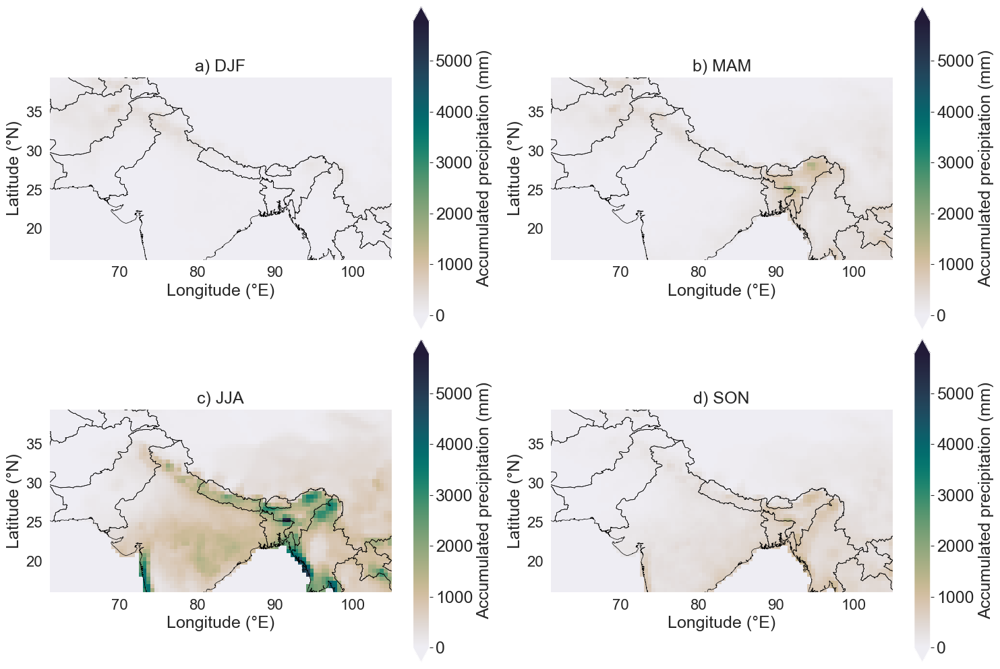

In [50]:
import cmocean as cmo
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15,10))

cmap = cmo.cm.rain

djf = seasonal_acc_precip.precipitation.sel(season='DJF').plot.pcolormesh(
                    ax=axes[0, 0],
                    cmap= cmap,
                    add_colorbar=True,
                    extend="both",
                    vmin = p_min,
                    vmax = p_max
                )
axes[0, 0].set_ylabel('Latitude (°N)', fontsize=18)
axes[0, 0].set_xlabel('Longitude (°E)', fontsize=18)
axes[0, 0].set_title('a) DJF', fontsize=18)

# set colorbar label
#axes[0, 0].collections[0].colorbar.set_label('Temperature (deg C)', fontsize=18)

mam = seasonal_acc_precip.precipitation.sel(season='MAM').plot.pcolormesh(
                    ax=axes[0, 1],
                    cmap= cmap,
                    add_colorbar=True,
                    extend="both",
                    vmin = p_min,
                    vmax = p_max
                )
axes[0, 1].set_ylabel('Latitude (°N)', fontsize=18)
axes[0, 1].set_xlabel('Longitude (°E)', fontsize=18)
axes[0, 1].set_title('b) MAM', fontsize=18)

# set colorbar label
#axes[0, 1].collections[0].colorbar.set_label('Temperature (deg C)', fontsize=18)

jja = seasonal_acc_precip.precipitation.sel(season='JJA').plot.pcolormesh(
                    ax=axes[1, 0],
                    cmap= cmap,
                    add_colorbar=True,
                    extend="both",
                    vmin = p_min,
                    vmax = p_max
                )
axes[1, 0].set_ylabel('Latitude (°N)', fontsize=18)
axes[1, 0].set_xlabel('Longitude (°E)', fontsize=18)
axes[1, 0].set_title('c) JJA', fontsize=18)

# set colorbar label
#axes[1, 0].collections[0].colorbar.set_label('Temperature (deg C)', fontsize=18)

son = seasonal_acc_precip.precipitation.sel(season='SON').plot.pcolormesh(
                    ax=axes[1, 1],
                    cmap= cmap,
                    add_colorbar=True,
                    extend="both",
                    vmin = p_min,
                    vmax = p_max
                )
axes[1, 1].set_ylabel('Latitude (°N)', fontsize=18)
axes[1, 1].set_xlabel('Longitude (°E)', fontsize=18)
axes[1, 1].set_title('d) SON', fontsize=18)

# Change size of colorbar ticks
djf.colorbar.ax.tick_params(labelsize=18)
mam.colorbar.ax.tick_params(labelsize=18)
jja.colorbar.ax.tick_params(labelsize=18)
son.colorbar.ax.tick_params(labelsize=18)

djf.colorbar.set_label('Accumulated precipitation (mm)', fontsize=18)
mam.colorbar.set_label('Accumulated precipitation (mm)', fontsize=18)
jja.colorbar.set_label('Accumulated precipitation (mm)', fontsize=18)
son.colorbar.set_label('Accumulated precipitation (mm)', fontsize=18)

# change ticks size for x and y axis using djf 
gpd['geometry'].plot(ax=axes[0,0], edgecolor='black', linewidth=0.5, facecolor='none')
gpd['geometry'].plot(ax=axes[0,1], edgecolor='black', linewidth=0.5, facecolor='none')
gpd['geometry'].plot(ax=axes[1,0], edgecolor='black', linewidth=0.5, facecolor='none')
gpd['geometry'].plot(ax=axes[1,1], edgecolor='black', linewidth=0.5, facecolor='none')

for ax in axes.flatten():
    ax.tick_params(axis='both', which='major', labelsize=16)

# set colorbar label
#axes[1, 1].collections[0].colorbar.set_label('Temperature (deg C)', fontsize=18)


fig.tight_layout()
plt.show()

# Trends

In [51]:
temp_hma_timeseries = temp_hma.mean(dim=["lon", "lat"]).resample(time="1D").mean()
precip_hma_timeseries = precip_hma.mean(dim=["lon", "lat"]).resample(time="1D").mean()
wind_speed_hma_timeseries = wind_speed_hma.mean(dim=["lon", "lat"])
rel_hum_hma_timeseries = rel_hum_hma.mean(dim=["lon", "lat"]).resample(time="1D").mean()
radiation_hma_timeseries = radiation_hma.mean(dim=["lon", "lat"]).resample(time="1D").mean()

In [52]:
df = pd.DataFrame({'time': temp_hma_timeseries.time, 'Temperature': temp_hma_timeseries.temperature.values, 'Precipitation': precip_hma_timeseries.precipitation.values, 'Relative Humidity': rel_hum_hma_timeseries.relative_humidity.values, 'Radiation': radiation_hma_timeseries.radiation.values})
df.set_index('time', inplace=True)

In [53]:
len(df)

10957

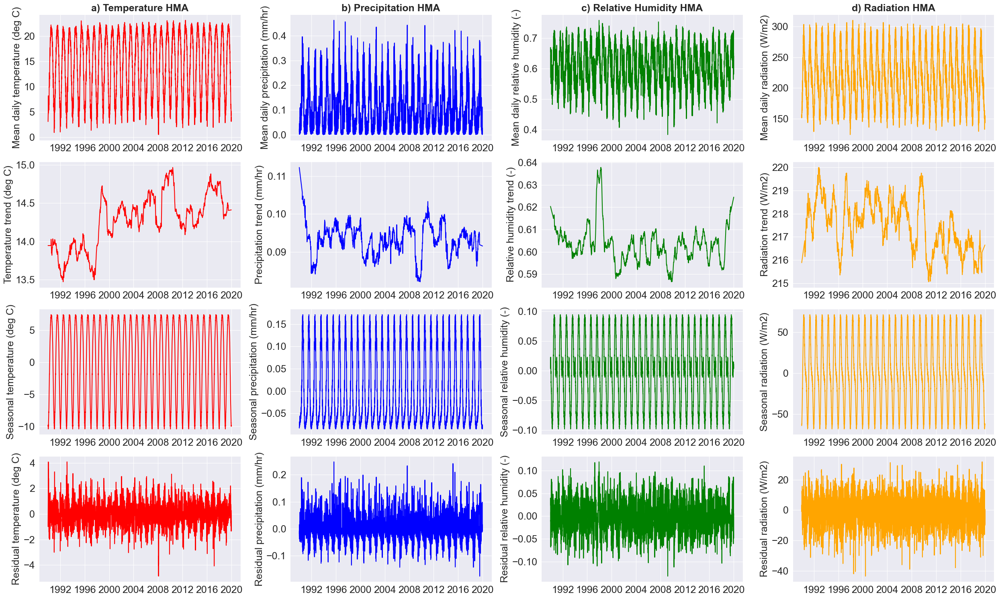

In [63]:
result_add_temp = seasonal_decompose(df['Temperature'], model='additive', extrapolate_trend='freq', period=365)
result_add_precip = seasonal_decompose(df['Precipitation'], model='additive', extrapolate_trend='freq', period=365)
result_add_rel_hum = seasonal_decompose(df['Relative Humidity'], model='additive', extrapolate_trend='freq', period=365)
result_add_rad = seasonal_decompose(df['Radiation'], model='additive', extrapolate_trend='freq', period=365)

fig, ax = plt.subplots(4,4, figsize=(25, 15))
ax[0,0].plot(result_add_temp.observed, label='Observed', color = 'red')
ax[0,0].set_ylabel('Mean daily temperature (deg C)', fontsize=18)
ax[0,1].plot(result_add_precip.observed, label='Observed', color = 'blue')
ax[0,1].set_ylabel('Mean daily precipitation (mm/hr)', fontsize=18)
ax[0,2].plot(result_add_rel_hum.observed, label='Observed', color = 'green')
ax[0,2].set_ylabel('Mean daily relative humidity (-)', fontsize=18)
ax[0,3].plot(result_add_rad.observed, label='Observed', color = 'orange')
ax[0,3].set_ylabel('Mean daily radiation (W/m2)', fontsize=18)


ax[1,0].plot(result_add_temp.trend, label='Trend', color = 'red')
ax[1,0].set_ylabel('Temperature trend (deg C)', fontsize=18)
ax[1,1].plot(result_add_precip.trend, label='Trend', color = 'blue')
ax[1,1].set_ylabel('Precipitation trend (mm/hr)', fontsize=18)
ax[1,2].plot(result_add_rel_hum.trend, label='Trend', color = 'green')
ax[1,2].set_ylabel('Relative humidity trend (-)', fontsize=18)
ax[1,3].plot(result_add_rad.trend, label='Trend', color = 'orange')
ax[1,3].set_ylabel('Radiation trend (W/m2)', fontsize=18)

ax[2,0].plot(result_add_temp.seasonal, label='Seasonal', color = 'red')
ax[2,0].set_ylabel('Seasonal temperature (deg C)', fontsize=18)
ax[2,1].plot(result_add_precip.seasonal, label='Seasonal', color = 'blue')
ax[2,1].set_ylabel('Seasonal precipitation (mm/hr)', fontsize=18)
ax[2,2].plot(result_add_rel_hum.seasonal, label='Seasonal', color = 'green')
ax[2,2].set_ylabel('Seasonal relative humidity (-)', fontsize=18)
ax[2,3].plot(result_add_rad.seasonal, label='Seasonal', color = 'orange')
ax[2,3].set_ylabel('Seasonal radiation (W/m2)', fontsize=18)

ax[3,0].plot(result_add_temp.resid, label='Residual', color = 'red')
ax[3,0].set_ylabel('Residual temperature (deg C)', fontsize=18)
ax[3,1].plot(result_add_precip.resid, label='Residual', color = 'blue')
ax[3,1].set_ylabel('Residual precipitation (mm/hr)', fontsize=18)
ax[3,2].plot(result_add_rel_hum.resid, label='Residual', color = 'green')
ax[3,2].set_ylabel('Residual relative humidity (-)', fontsize=18)
ax[3,3].plot(result_add_rad.resid, label='Residual', color = 'orange')
ax[3,3].set_ylabel('Residual radiation (W/m2)', fontsize=18)

ax[0,0].set_title('a) Temperature HMA', fontsize=18, fontweight='bold')
ax[0,1].set_title('b) Precipitation HMA', fontsize=18, fontweight='bold')
ax[0,2].set_title('c) Relative Humidity HMA',   fontsize=18, fontweight='bold')
ax[0,3].set_title('d) Radiation HMA', fontsize=18, fontweight='bold')

ax[0,0].tick_params(axis='both', labelsize=18)
ax[0,1].tick_params(axis='both', labelsize=18)
ax[0,2].tick_params(axis='both', labelsize=18)
ax[0,3].tick_params(axis='both', labelsize=18)
ax[1,0].tick_params(axis='both', labelsize=18)
ax[1,1].tick_params(axis='both', labelsize=18)
ax[1,2].tick_params(axis='both', labelsize=18)
ax[1,3].tick_params(axis='both', labelsize=18)
ax[2,0].tick_params(axis='both', labelsize=18)
ax[2,1].tick_params(axis='both', labelsize=18)
ax[2,2].tick_params(axis='both', labelsize=18)
ax[2,3].tick_params(axis='both', labelsize=18)
ax[3,0].tick_params(axis='both', labelsize=18)
ax[3,1].tick_params(axis='both', labelsize=18)
ax[3,2].tick_params(axis='both', labelsize=18)
ax[3,3].tick_params(axis='both', labelsize=18)

plt.tight_layout()
plt.show()


In [6]:
temp_hma_yrly = temp_hma.temperature.resample(time="1Y").mean()
precip_hma_yrly = precip_hma.precipitation.resample(time="1Y").mean()
rel_hum_hma_yrly = rel_hum_hma.relative_humidity.resample(time="1Y").mean()
radiation_hma_yrly = radiation_hma.radiation.resample(time="1Y").mean()

In [130]:
temp_hma_yrly = temp_hma_yrly.mean(dim=["lon", "lat"])
precip_hma_yrly = precip_hma_yrly.mean(dim=["lon", "lat"])
rel_hum_hma_yrly = rel_hum_hma_yrly.mean(dim=["lon", "lat"])
radiation_hma_yrly = radiation_hma_yrly.mean(dim=["lon", "lat"])

In [12]:
print(mk.original_test(result_add_temp.trend, alpha=0.05))
print(mk.original_test(result_add_precip.trend, alpha=0.05))
print(mk.original_test(result_add_rel_hum.trend, alpha=0.05))
print(mk.original_test(result_add_rad.trend.values, alpha=0.05))

Mann_Kendall_Test(trend='increasing', h=True, p=0.0, z=76.57315908758659, Tau=0.48776299453041283, s=29276728.0, var_s=146181332652.66666, slope=7.73303984473297e-05, intercept=13.898474070116132)
Mann_Kendall_Test(trend='decreasing', h=True, p=0.0, z=-12.164239819058865, Tau=-0.07748494621495432, s=-4650836.0, var_s=146181332652.66666, slope=-1.4424975828298546e-07, intercept=0.09430221906354477)
Mann_Kendall_Test(trend='decreasing', h=True, p=0.0, z=-16.68677745516268, Tau=-0.10629303577531646, s=-6379968.0, var_s=146181332652.66666, slope=-3.6441829398039075e-07, intercept=0.6050855375291504)
Mann_Kendall_Test(trend='decreasing', h=True, p=0.0, z=-52.1975325205887, Tau=-0.3324928144381187, s=-19957032.0, var_s=146181332652.66666, slope=-0.0001821125846789599, intercept=218.541899555612)


# Heatmap

In [140]:
temp_hma_timeseries_selected = temp_hma_timeseries.sel(time=slice('1999-01-01', '2016-12-31'))
precip_hma_timeseries_selected = precip_hma_timeseries.sel(time=slice('1999-01-01', '2016-12-31'))
rel_hum_hma_timeseries_selected = rel_hum_hma_timeseries.sel(time=slice('1999-01-01', '2016-12-31'))
radiation_hma_timeseries_selected = radiation_hma_timeseries.sel(time=slice('1999-01-01', '2016-12-31'))

In [144]:
df = pd.DataFrame({'time': temp_hma_timeseries_selected.time.values, 'Temperature': temp_hma_timeseries_selected.temperature.values, 'Precipitation': precip_hma_timeseries_selected.precipitation.values, 'Relative Humidity': rel_hum_hma_timeseries_selected.relative_humidity.values, 'Radiation': radiation_hma_timeseries_selected.radiation.values, 'Wind': wind_speed_hma_timeseries.wind.values})

<AxesSubplot:>

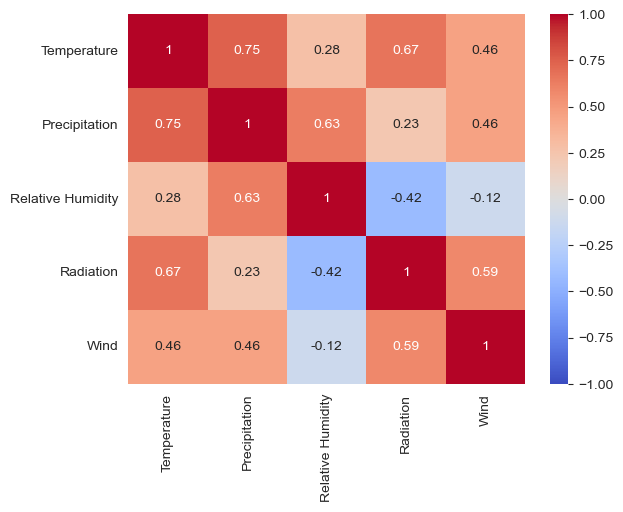

In [146]:
sns.heatmap(df.corr(), annot=True, cmap='coolwarm', vmin=-1, vmax=1)

# Budhi Gandaki

In [4]:
temp_bg = xr.open_mfdataset('../data/forcing_data/prepared/temperature.nc')
precip_bg = xr.open_mfdataset('../data/forcing_data/prepared/precipitation.nc')
rel_hum_bg = xr.open_mfdataset('../data/forcing_data/prepared/relative_humidity.nc')
radiation_bg = xr.open_mfdataset('../data/forcing_data/prepared/radiation.nc')
wind_speed_bg = xr.open_mfdataset('../data/forcing_data/prepared/wind_speed.nc')

In [5]:
temp_bg_df = temp_bg.sel(time = slice('2000-01-01', '2015-12-31')).to_dataframe()
precip_bg_df = precip_bg.sel(time = slice('2000-01-01', '2015-12-31')).to_dataframe()
rel_hum_bg_df = rel_hum_bg.sel(time = slice('2000-01-01', '2015-12-31')).to_dataframe()
radiation_bg_df = radiation_bg.sel(time = slice('2000-01-01', '2015-12-31')).to_dataframe()
wind_speed_bg_df = wind_speed_bg.sel(time = slice('2000-01-01', '2015-12-31')).to_dataframe()

In [6]:
bg_df = pd.DataFrame({'time': temp_bg_df.index.values, 'Temperature': temp_bg_df.temperature.values, 'Precipitation': precip_bg_df.precipitation.values, 'Relative Humidity': rel_hum_bg_df.relative_humidity.values, 'Radiation': radiation_bg_df.global_radiation.values, 'Wind': wind_speed_bg_df.wind_speed.values})

In [7]:
temp = bg_df['Temperature'].values
precip = bg_df['Precipitation'].values
rel_hum = bg_df['Relative Humidity'].values
radiation = bg_df['Radiation'].values
wind = bg_df['Wind'].values

data = np.array([temp, precip])

In [8]:
# # import stats
# from scipy import stats
# bg_df_remove_outliers = bg_df[(np.abs(stats.zscore(bg_df)) < 3).all(axis=1)]

In [12]:
# Create a figure and axis object
fig, ax = plt.subplots()

# Add each box plot to the axis object
ax.boxplot(data)

# Set the y-axis label
ax.set_ylabel('Value')

# Set the x-axis tick labels
ax.set_xticklabels(['Temperature', 'Precipitation'])

# Show the plot
plt.show()

: 

: 

In [ ]:
bg_df_remove_outliers.boxplot(column=['Temperature', 'Precipitation', 'Relative Humidity', 'Radiation', 'Wind'], figsize=(12,8))

In [159]:
bg_df.describe()

,Temperature,Precipitation,Relative Humidity,Radiation,Wind
count,2.244096e+06,2.244096e+06,2.244096e+06,2.244096e+06,2.244096e+06
mean,5.003807e+00,1.576413e-01,7.150148e-01,2.237789e+02,1.300541e+00
std,1.292892e+01,6.233764e-01,1.929653e-01,3.017541e+02,8.028735e-01
min,-3.668616e+01,0.000000e+00,2.252122e-02,0.000000e+00,1.237965e-01
25%,-4.284286e+00,0.000000e+00,6.021518e-01,0.000000e+00,7.978095e-01
50%,4.196838e+00,0.000000e+00,7.649590e-01,1.095831e+01,1.100833e+00
75%,1.446723e+01,0.000000e+00,8.679669e-01,4.389966e+02,1.530652e+00
max,4.174313e+01,2.419994e+01,1.004150e+00,1.196406e+03,1.073462e+01


In [151]:
temp_bg_df.describe()

,series_name,crs,temperature,x,y,z
count,4.207488e+06,4.207488e+06,4.207488e+06,4.207488e+06,4.207488e+06,4.207488e+06
mean,7.500000e+00,-2.147484e+09,4.829999e+00,3.042525e+05,3.154352e+06,3.586500e+03
std,4.609773e+00,0.000000e+00,1.294404e+01,5.473514e+04,6.195884e+04,1.701458e+03
min,0.000000e+00,-2.147484e+09,-3.668616e+01,2.289322e+05,3.070135e+06,6.890000e+02
25%,3.750000e+00,-2.147484e+09,-4.514587e+00,2.668608e+05,3.112282e+06,1.948500e+03
50%,7.500000e+00,-2.147484e+09,4.062943e+00,3.044374e+05,3.154446e+06,4.456500e+03
75%,1.125000e+01,-2.147484e+09,1.428452e+01,3.416632e+05,3.196625e+06,4.693500e+03
max,1.500000e+01,-2.147484e+09,4.174313e+01,3.785391e+05,3.238819e+06,6.612000e+03


## Precipitation analysis

In [468]:
precip_input = precip_bg.sel(time = slice('2000-01-01', '2015-12-31'))
precip_input_mean = precip_input.mean(dim=["time"])

NameError: name 'precip_bg' is not defined

In [64]:
# This gives 
min_lat = 27.75
max_lat = 29.25
min_lon = 84.25
max_lon = 85.75

In [65]:
bg_precip = precip_hma.precipitation.sel(lon=slice(min_lon, max_lon), lat=slice(min_lat, max_lat))
bg_precip = bg_precip.sel(time = slice('2000-01-01', '2015-12-31'))
bg_precip_mean = bg_precip.mean(dim=["time"])

bg_snowf = snowfall.Snowf.sel(lon=slice(min_lon, max_lon), lat=slice(min_lat, max_lat))
bg_snowf = bg_snowf.sel(time = slice('2000-01-01', '2015-12-31'))
bg_snowf = bg_snowf * 3600

bg_temp = temp_hma.temperature.sel(lon=slice(min_lon, max_lon), lat=slice(min_lat, max_lat))
bg_temp = bg_temp.sel(time = slice('2000-01-01', '2015-12-31'))

bg_rel_hum = rel_hum_hma.relative_humidity.sel(lon=slice(min_lon, max_lon), lat=slice(min_lat, max_lat))
bg_rel_hum = bg_rel_hum.sel(time = slice('2000-01-01', '2015-12-31'))

bg_radiation = radiation_hma.radiation.sel(lon=slice(min_lon, max_lon), lat=slice(min_lat, max_lat))
bg_radiation = bg_radiation.sel(time = slice('2000-01-01', '2015-12-31'))

bg_wind = wind_speed_hma.wind.sel(lon=slice(min_lon, max_lon), lat=slice(min_lat, max_lat))
bg_wind = bg_wind.sel(time = slice('2000-01-01', '2015-12-31'))

In [67]:
bg_rel_hum.mean(dim=["lon", "lat"]).min().values

array(0.22925329, dtype=float32)

In [14]:
catchment_outline = catchment_outline.to_crs(epsg=4326)

In [17]:

month_length_precip_bg = bg_precip.time.dt.days_in_month
weights_length_precip_bg = (month_length_precip_bg.groupby("time.season") / month_length_precip_bg.groupby("time.season").sum())
precip_season_resampled_bg = (bg_precip * weights_length_precip_bg).groupby("time.season").sum(dim="time")
precip_season_notnull_bg = precip_season_resampled_bg.where(precip_season_resampled_bg >= 0, drop=True)

month_length_snowf_bg = bg_snowf.time.dt.days_in_month
weights_length_snowf_bg = (month_length_snowf_bg.groupby("time.season") / month_length_snowf_bg.groupby("time.season").sum())
snowf_season_resampled_bg = (bg_snowf * weights_length_snowf_bg).groupby("time.season").sum(dim="time")
snowf_season_notnull_bg = snowf_season_resampled_bg.where(snowf_season_resampled_bg >= 0, drop=True)

month_length_temp_bg = bg_temp.time.dt.days_in_month
weights_length_temp_bg = (month_length_temp_bg.groupby("time.season") / month_length_temp_bg.groupby("time.season").sum())
temp_season_resampled_bg = (bg_temp * weights_length_temp_bg).groupby("time.season").sum(dim="time")

month_length_rel_hum_bg = bg_rel_hum.time.dt.days_in_month
weights_length_rel_hum_bg = (month_length_rel_hum_bg.groupby("time.season") / month_length_rel_hum_bg.groupby("time.season").sum())
rel_hum_season_resampled_bg = (bg_rel_hum * weights_length_rel_hum_bg).groupby("time.season").sum(dim="time")
rel_hum_season_notnull_bg = rel_hum_season_resampled_bg.where(rel_hum_season_resampled_bg >= 0, drop=True)

month_length_radiation_bg = bg_radiation.time.dt.days_in_month
weights_length_radiation_bg = (month_length_radiation_bg.groupby("time.season") / month_length_radiation_bg.groupby("time.season").sum())
radiation_season_resampled_bg = (bg_radiation * weights_length_radiation_bg).groupby("time.season").sum(dim="time")
radiation_season_notnull_bg = radiation_season_resampled_bg.where(radiation_season_resampled_bg >= 0, drop=True)

month_length_wind_bg = bg_wind.time.dt.days_in_month
weights_length_wind_bg = (month_length_wind_bg.groupby("time.season") / month_length_wind_bg.groupby("time.season").sum())
wind_season_resampled_bg = (bg_wind * weights_length_wind_bg).groupby("time.season").sum(dim="time")
wind_season_notnull_bg = wind_season_resampled_bg.where(wind_season_resampled_bg >= 0, drop=True)


In [ ]:
month_length_precip_bg = bg_precip.time.dt.days_in_month
weights_length_precip_bg = (month_length_precip_bg.groupby("time.season") / month_length_precip_bg.groupby("time.season").sum())
precip_season_resampled_bg = (bg_precip * weights_length_precip_bg).groupby("time.season").sum(dim="time")
precip_season_notnull_bg = precip_season_resampled_bg.where(precip_season_resampled_bg >= 0, drop=True)


### Precipitation

In [24]:
precip_season_notnull_bg.sel(season = 'JJA').max().values

array(0.77351247)

In [71]:
# Resample the dataset to a seasonal frequency and calculate the sum
seasonal_acc_precip_bg = bg_precip.resample(time='QS-DEC').sum(dim='time').groupby('time.season').sum(dim='time')
min_precip_bg = seasonal_acc_precip_bg.min().values
max_precip_bg = seasonal_acc_precip_bg.max().values



In [79]:
catchment_outline = catchment_outline.to_crs(epsg=4326)

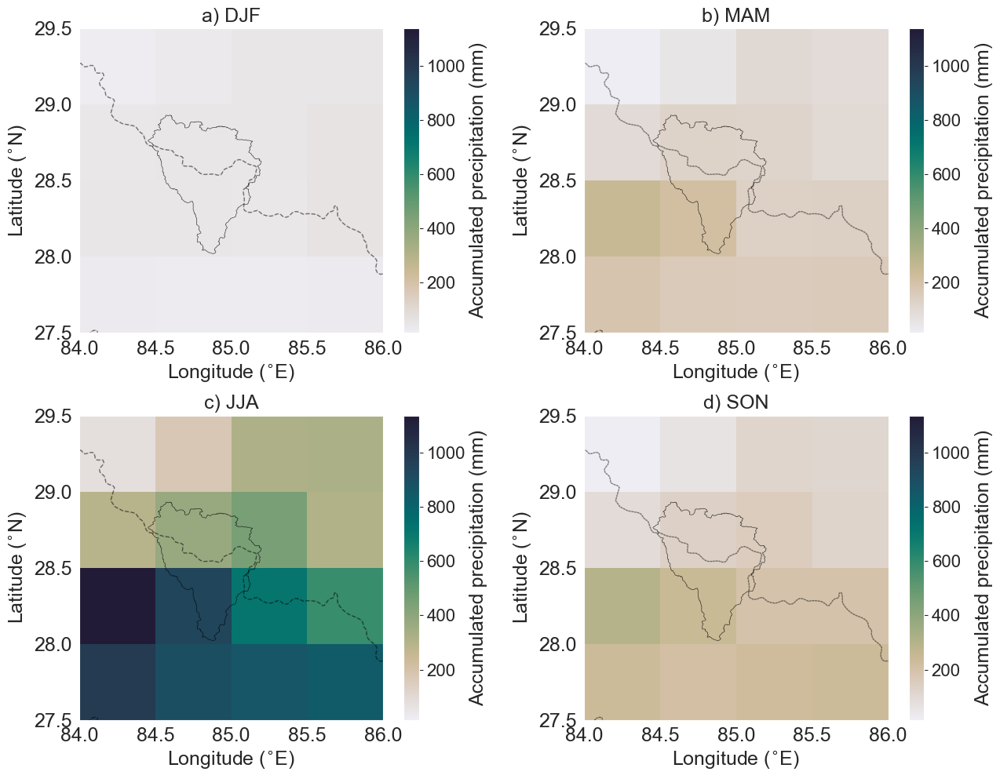

In [83]:
fig, ax = plt.subplots(2,2, figsize=(13, 10))

cmap = cmocean.cm.rain

# import matplotlib.pyplot as plt
# from matplotlib.colors import LinearSegmentedColormap

# # Define the RGB values for your colormap
# color1 = (224/255, 243/255, 219/255)  # RGB values for the first color
# color2 = (168/255, 221/255, 181/255)  # RGB values for the second color
# color3 = (67/255, 162/255, 202/255)  # RGB values for the third color

# # Create a list of RGB color tuples
# colors = [color1, color2, color3]

# # Create a colormap using the LinearSegmentedColormap
# cmap = LinearSegmentedColormap.from_list('my_colormap', colors)


im1 = seasonal_acc_precip_bg.sel(season = 'DJF').plot.pcolormesh(
    ax=ax[0,0], cmap=cmap, vmin=min_precip_bg, vmax=max_precip_bg)
im1.colorbar.set_label('Precipitation (mm/hr)')
catchment_outline.plot(ax=ax[0,0],  linewidth=0.5, edgecolor='black', alpha = 0.7, facecolor='none')
ax[0,0].set_xlabel('Longitude ($^{\circ}$E)', fontsize=18)
ax[0,0].set_ylabel('Latitude ($^{\circ}$N)', fontsize=18)
ax[0,0].set_title('a) DJF', fontsize=18)

im2 = seasonal_acc_precip_bg.sel(season = 'MAM').plot.pcolormesh(
    ax=ax[0,1], cmap=cmap, vmin=min_precip_bg, vmax=max_precip_bg)
im2.colorbar.set_label('Precipitation (mm/hr)')
catchment_outline.plot(ax=ax[0,1],  linewidth=0.5, edgecolor='black', alpha = 0.7, facecolor='none')
ax[0,1].set_xlabel('Longitude ($^{\circ}$E)', fontsize=18)
ax[0,1].set_ylabel('Latitude ($^{\circ}$N)', fontsize=18)
ax[0,1].set_title('b) MAM', fontsize=18)

im3 = seasonal_acc_precip_bg.sel(season = 'JJA').plot.pcolormesh(
    ax=ax[1,0], cmap=cmap, vmin=min_precip_bg, vmax=max_precip_bg)
im3.colorbar.set_label('Precipitation (mm/hr)')
catchment_outline.plot(ax=ax[1,0],  linewidth=0.5, edgecolor='black', alpha = 0.7, facecolor = 'none')
ax[1,0].set_xlabel('Longitude ($^{\circ}$E)', fontsize=18)
ax[1,0].set_ylabel('Latitude ($^{\circ}$N)', fontsize=18)
ax[1,0].set_title('c) JJA', fontsize=18)


im4 = seasonal_acc_precip_bg.sel(season = 'SON').plot.pcolormesh(
    ax=ax[1,1], cmap=cmap, vmin=min_precip_bg, vmax=max_precip_bg)
im4.colorbar.set_label('Precipitation (mm/hr)')
catchment_outline.plot(ax=ax[1,1],  linewidth=0.5, edgecolor='black',alpha = 0.7,  facecolor = 'none')

ax[1,1].set_xlabel('Longitude ($^{\circ}$E)', fontsize=18)
ax[1,1].set_ylabel('Latitude ($^{\circ}$N)', fontsize=18)
ax[1,1].set_title('d) SON', fontsize=18)

ax[0,0].tick_params(axis='both', which='major', labelsize=18)
ax[0,1].tick_params(axis='both', which='major', labelsize=18)
ax[1,0].tick_params(axis='both', which='major', labelsize=18)
ax[1,1].tick_params(axis='both', which='major', labelsize=18)

im1.colorbar.ax.tick_params(labelsize=16)
im2.colorbar.ax.tick_params(labelsize=16)
im3.colorbar.ax.tick_params(labelsize=16)
im4.colorbar.ax.tick_params(labelsize=16)

im1.colorbar.set_label('Accumulated precipitation (mm)', fontsize=18)
im2.colorbar.set_label('Accumulated precipitation (mm)', fontsize=18)
im3.colorbar.set_label('Accumulated precipitation (mm)', fontsize=18)
im4.colorbar.set_label('Accumulated precipitation (mm)', fontsize=18)

gpd['geometry'].plot(ax=ax[0,0], edgecolor='black', linewidth=1, facecolor='none', linestyle='--', alpha = 0.3)
gpd['geometry'].plot(ax=ax[0,1], edgecolor='black', linewidth=1, facecolor='none', linestyle='--', alpha = 0.3)
gpd['geometry'].plot(ax=ax[1,0], edgecolor='black', linewidth=1, facecolor='none', linestyle='--', alpha = 0.3)
gpd['geometry'].plot(ax=ax[1,1], edgecolor='black', linewidth=1, facecolor='none', linestyle='--', alpha = 0.3)

# background_props = dict(facecolor='none', edgecolor='black', alpha=0.2)

# ax[0,0].text(85.25, 29.25, 'China' , fontsize=18, bbox=background_props)
# ax[0,0].text(84.25, 27.6, 'Nepal' , fontsize=18, bbox=background_props)

fig.tight_layout()
plt.show()

### Snowfall

In [84]:
# Resample the dataset to a seasonal frequency and calculate the sum
seasonal_acc_snow_bg = bg_snowf.resample(time='QS-DEC').sum(dim='time').groupby('time.season').sum(dim='time')
min_snow_bg = seasonal_acc_snow_bg.min().values
max_snow_bg = seasonal_acc_snow_bg.max().values



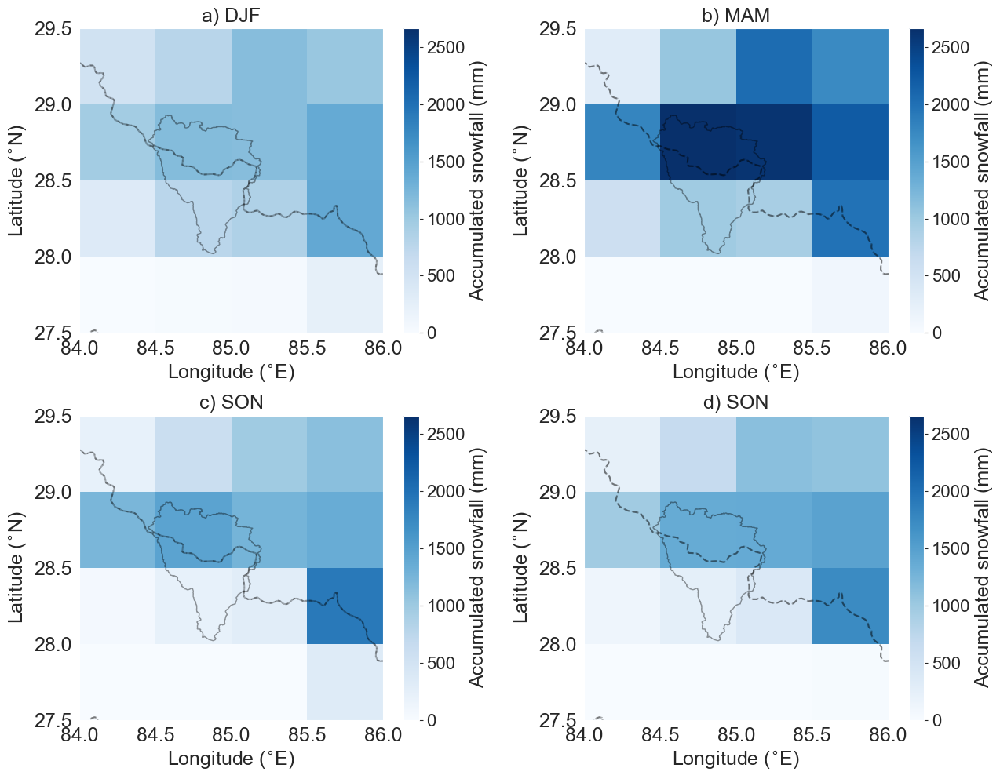

In [87]:
fig, ax = plt.subplots(2,2, figsize=(13, 10))

im1 = seasonal_acc_snow_bg.sel(season = 'DJF').plot.pcolormesh(
    ax=ax[0,0], cmap='Blues', vmin=min_snow_bg, vmax=max_snow_bg)
im1.colorbar.set_label('Accumulated snowfall (mm)', fontsize=18)
catchment_outline.plot(ax=ax[0,0],  linewidth=1, edgecolor='black', alpha = 0.4, facecolor='none')
ax[0,0].set_xlabel('Longitude ($^{\circ}$E)', fontsize=18)
ax[0,0].set_ylabel('Latitude ($^{\circ}$N)', fontsize=18)
ax[0,0].set_title('a) DJF', fontsize=18)

im2 = seasonal_acc_snow_bg.sel(season = 'MAM').plot.pcolormesh(
    ax=ax[0,1], cmap='Blues', vmin=min_snow_bg, vmax=max_snow_bg)
im2.colorbar.set_label('Accumulated snowfall (mm)', fontsize=18)
catchment_outline.plot(ax=ax[0,1],  linewidth=1, edgecolor='black', alpha = 0.4, facecolor='none')
ax[0,1].set_xlabel('Longitude ($^{\circ}$E)', fontsize=18)
ax[0,1].set_ylabel('Latitude ($^{\circ}$N)', fontsize=18)
ax[0,1].set_title('b) MAM', fontsize=18)

im3 = seasonal_acc_snow_bg.sel(season = 'JJA').plot.pcolormesh(
    ax=ax[1,0], cmap='Blues', vmin=min_snow_bg, vmax=max_snow_bg)
im3.colorbar.set_label('Accumulated snowfall (mm)', fontsize=18)
catchment_outline.plot(ax=ax[1,0],  linewidth=1, edgecolor='black', alpha = 0.4, facecolor='none')
ax[1,0].set_xlabel('Longitude ($^{\circ}$E)', fontsize=18)
ax[1,0].set_ylabel('Latitude ($^{\circ}$N)', fontsize=18)
ax[1,0].set_title('c) SON', fontsize=18)


im4 = seasonal_acc_snow_bg.sel(season = 'SON').plot.pcolormesh(
    ax=ax[1,1], cmap='Blues', vmin=min_snow_bg, vmax=max_snow_bg)
im4.colorbar.set_label('Accumulated snowfall (mm)', fontsize=18)
catchment_outline.plot(ax=ax[1,1],  linewidth=1, edgecolor='black', alpha = 0.4, facecolor='none')
ax[1,1].set_xlabel('Longitude ($^{\circ}$E)', fontsize=18)
ax[1,1].set_ylabel('Latitude ($^{\circ}$N)', fontsize=18)
ax[1,1].set_title('d) SON', fontsize=18)

im1.colorbar.ax.tick_params(labelsize=16)
im2.colorbar.ax.tick_params(labelsize=16)
im3.colorbar.ax.tick_params(labelsize=16)
im4.colorbar.ax.tick_params(labelsize=16)

im1.colorbar.set_label('Accumulated snowfall (mm)', fontsize=18)
im2.colorbar.set_label('Accumulated snowfall (mm)', fontsize=18)
im3.colorbar.set_label('Accumulated snowfall (mm)', fontsize=18)
im4.colorbar.set_label('Accumulated snowfall (mm)', fontsize=18)

gpd['geometry'].plot(ax=ax[0,0], edgecolor='black', linewidth=1.5, facecolor='none', linestyle='--', alpha = 0.3)
gpd['geometry'].plot(ax=ax[0,1], edgecolor='black', linewidth=1.5, facecolor='none', linestyle='--', alpha = 0.3)
gpd['geometry'].plot(ax=ax[1,0], edgecolor='black', linewidth=1.5, facecolor='none', linestyle='--', alpha = 0.3)
gpd['geometry'].plot(ax=ax[1,1], edgecolor='black', linewidth=1.5, facecolor='none', linestyle='--', alpha = 0.3)

ax[0,0].tick_params(axis='both', which='major', labelsize=18)
ax[0,1].tick_params(axis='both', which='major', labelsize=18)
ax[1,0].tick_params(axis='both', which='major', labelsize=18)
ax[1,1].tick_params(axis='both', which='major', labelsize=18)
fig.tight_layout()
plt.show()



In [90]:
seasonal_acc_snow_bg.sel(season = 'MAM').max().values

array(2662.4668, dtype=float32)

### Temperature

In [72]:
temp_min = temp_season_resampled_bg.min().values
temp_max = temp_season_resampled_bg.max().values

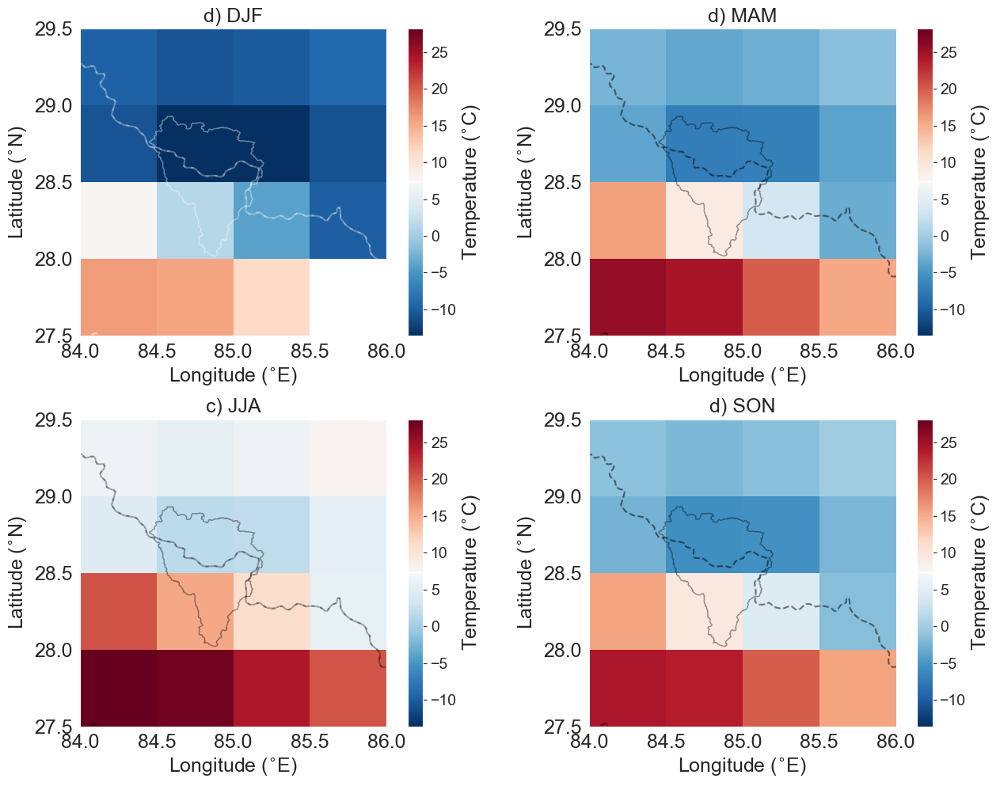

In [119]:
import matplotlib.colors as mcolors

# Choose the RdBu colormap
colormap = plt.cm.get_cmap('RdBu_r')

# Define the number of color segments for the colormap
num_segments = 256

# Create a new colormap with a modified center segment
cmap_segments = colormap(np.linspace(0, 1, num_segments))
center_index = int(num_segments / 2)
cmap_segments[center_index] = (1, 1, 1, 1)  # Set the center segment to white (RGB values: 1, 1, 1)

# Create the modified colormap
cmap = mcolors.ListedColormap(cmap_segments)

fig, ax = plt.subplots(2,2, figsize=(13, 10))

im1 = temp_season_resampled_bg.sel(season = 'DJF').plot.pcolormesh(
    ax=ax[0,0], cmap=cmap, vmin=temp_min, vmax=temp_max)
im1.colorbar.set_label('Temperature ($^\circ$C)')
catchment_outline.plot(ax=ax[0,0],  linewidth=1, edgecolor='white', alpha = 0.4, facecolor='none')
ax[0,0].set_xlabel('Longitude ($^{\circ}$E)', fontsize=18)
ax[0,0].set_ylabel('Latitude ($^{\circ}$N)', fontsize=18)
ax[0,0].set_title('d) DJF', fontsize=18)

im2 = temp_season_resampled_bg.sel(season = 'MAM').plot.pcolormesh(
    ax=ax[0,1], cmap=cmap, vmin=temp_min, vmax=temp_max)
im2.colorbar.set_label('Temperature ($^\circ$C)')
catchment_outline.plot(ax=ax[0,1],  linewidth=1, edgecolor='black', alpha = 0.4, facecolor='none')
ax[0,1].set_xlabel('Longitude ($^{\circ}$E)', fontsize=18)
ax[0,1].set_ylabel('Latitude ($^{\circ}$N)', fontsize=18)
ax[0,1].set_title('d) MAM', fontsize=18)

im3 = temp_season_resampled_bg.sel(season = 'JJA').plot.pcolormesh(
    ax=ax[1,0], cmap=cmap, vmin=temp_min, vmax=temp_max)
im3.colorbar.set_label('Temperature ($^\circ$C)')
catchment_outline.plot(ax=ax[1,0],  linewidth=1, edgecolor='black', alpha = 0.4, facecolor='none')
ax[1,0].set_xlabel('Longitude ($^{\circ}$E)', fontsize=18)
ax[1,0].set_ylabel('Latitude ($^{\circ}$N)', fontsize=18)
ax[1,0].set_title('c) JJA', fontsize=18)


im4 = temp_season_resampled_bg.sel(season = 'SON').plot.pcolormesh(
    ax=ax[1,1], cmap=cmap, vmin=temp_min, vmax=temp_max)
im4.colorbar.set_label('Temperature ($^\circ$C)')
catchment_outline.plot(ax=ax[1,1],  linewidth=1, edgecolor='black', alpha = 0.4, facecolor='none')
ax[1,1].set_xlabel('Longitude ($^{\circ}$E)', fontsize=18)
ax[1,1].set_ylabel('Latitude ($^{\circ}$N)', fontsize=18)
ax[1,1].set_title('d) SON', fontsize=18)


im1.colorbar.ax.tick_params(labelsize=14)
im2.colorbar.ax.tick_params(labelsize=14)
im3.colorbar.ax.tick_params(labelsize=14)
im4.colorbar.ax.tick_params(labelsize=14)

im1.colorbar.set_label('Temperature ($^{\circ}$C)', fontsize=18)
im2.colorbar.set_label('Temperature ($^{\circ}$C)', fontsize=18)
im3.colorbar.set_label('Temperature ($^{\circ}$C)', fontsize=18)
im4.colorbar.set_label('Temperature ($^{\circ}$C)', fontsize=18)

gpd['geometry'].plot(ax=ax[0,0], edgecolor='white', linewidth=1.5, facecolor='none', linestyle='--', alpha = 0.3)
gpd['geometry'].plot(ax=ax[0,1], edgecolor='black', linewidth=1.5, facecolor='none', linestyle='--', alpha = 0.3)
gpd['geometry'].plot(ax=ax[1,0], edgecolor='black', linewidth=1.5, facecolor='none', linestyle='--', alpha = 0.3)
gpd['geometry'].plot(ax=ax[1,1], edgecolor='black', linewidth=1.5, facecolor='none', linestyle='--', alpha = 0.3)

ax[0,0].tick_params(axis='both', which='major', labelsize=18)
ax[0,1].tick_params(axis='both', which='major', labelsize=18)
ax[1,0].tick_params(axis='both', which='major', labelsize=18)
ax[1,1].tick_params(axis='both', which='major', labelsize=18)
fig.tight_layout()
plt.show()



# Wind

In [81]:
wind_season_notnull_bg.max().values

array(2.28772769)

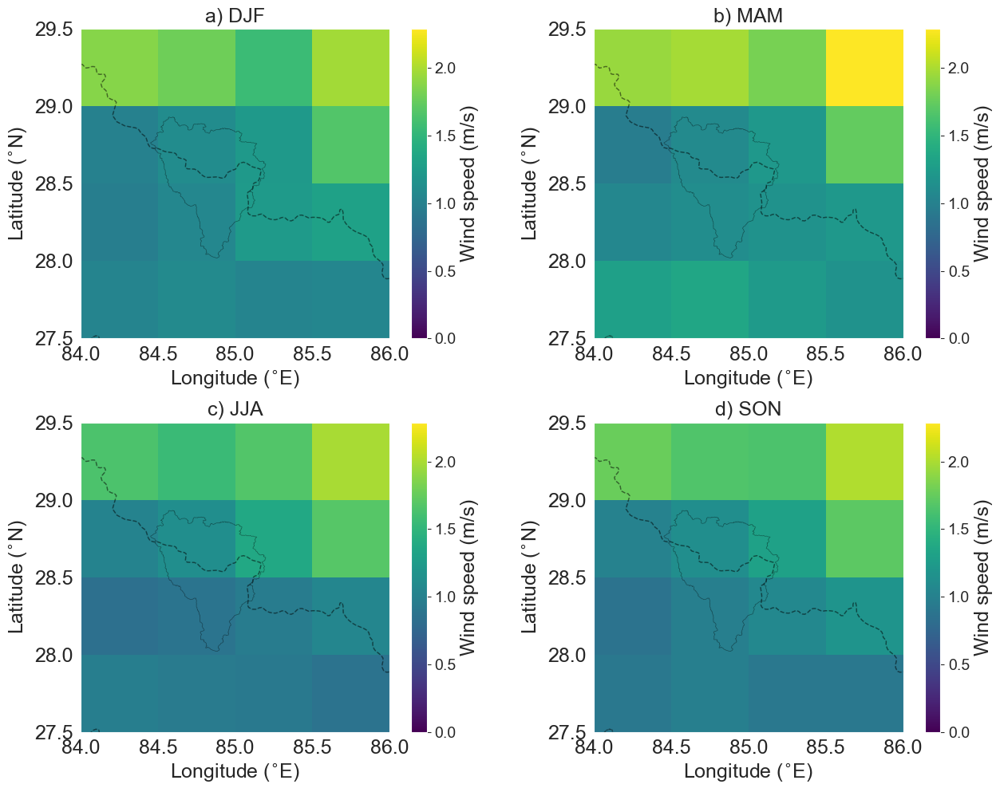

In [89]:
cmap = 'viridis'
fig, ax = plt.subplots(2,2, figsize=(13, 10))

im1 = wind_season_resampled_bg.sel(season = 'DJF').plot.pcolormesh(
    ax=ax[0,0], cmap=cmap, vmin=0, vmax=2.29)
im1.colorbar.set_label('Wind (m/s)')
catchment_outline.plot(ax=ax[0,0],  linewidth=0.5, edgecolor='black', alpha = 0.4, facecolor='none')
ax[0,0].set_xlabel('Longitude ($^{\circ}$E)', fontsize=18)
ax[0,0].set_ylabel('Latitude ($^{\circ}$N)', fontsize=18)
ax[0,0].set_title('a) DJF', fontsize=18)

im2 = wind_season_resampled_bg.sel(season = 'MAM').plot.pcolormesh(
    ax=ax[0,1], cmap=cmap, vmin=0, vmax=2.29)
im2.colorbar.set_label('Wind (m/s)')
catchment_outline.plot(ax=ax[0,1],  linewidth=0.5, edgecolor='black', alpha = 0.4, facecolor='none')
ax[0,1].set_xlabel('Longitude ($^{\circ}$E)', fontsize=18)
ax[0,1].set_ylabel('Latitude ($^{\circ}$N)', fontsize=18)
ax[0,1].set_title('b) MAM', fontsize=18)

im3 = wind_season_resampled_bg.sel(season = 'JJA').plot.pcolormesh(
    ax=ax[1,0], cmap=cmap, vmin=0, vmax=2.29)
im3.colorbar.set_label('Wind (m/s)')
catchment_outline.plot(ax=ax[1,0],  linewidth=0.5, edgecolor='black', alpha = 0.4, facecolor='none')
ax[1,0].set_xlabel('Longitude ($^{\circ}$E)', fontsize=18)
ax[1,0].set_ylabel('Latitude ($^{\circ}$N)', fontsize=18)
ax[1,0].set_title('c) JJA', fontsize=18)


im4 = wind_season_resampled_bg.sel(season = 'SON').plot.pcolormesh(
    ax=ax[1,1], cmap=cmap, vmin=0, vmax=2.29)
im4.colorbar.set_label('Wind (m/s)')
catchment_outline.plot(ax=ax[1,1],  linewidth=0.5, edgecolor='black', alpha = 0.4, facecolor='none')
ax[1,1].set_xlabel('Longitude ($^{\circ}$E)', fontsize=18)
ax[1,1].set_ylabel('Latitude ($^{\circ}$N)', fontsize=18)
ax[1,1].set_title('d) SON', fontsize=18)

im1.colorbar.ax.tick_params(labelsize=14)
im2.colorbar.ax.tick_params(labelsize=14)
im3.colorbar.ax.tick_params(labelsize=14)
im4.colorbar.ax.tick_params(labelsize=14)

im1.colorbar.set_label('Wind speed (m/s)', fontsize=18)
im2.colorbar.set_label('Wind speed (m/s)', fontsize=18)
im3.colorbar.set_label('Wind speed (m/s)', fontsize=18)
im4.colorbar.set_label('Wind speed (m/s)', fontsize=18)

gpd['geometry'].plot(ax=ax[0,0], edgecolor='black', linewidth=1, facecolor='none', linestyle='--', alpha = 0.3)
gpd['geometry'].plot(ax=ax[0,1], edgecolor='black', linewidth=1, facecolor='none', linestyle='--', alpha = 0.3)
gpd['geometry'].plot(ax=ax[1,0], edgecolor='black', linewidth=1, facecolor='none', linestyle='--', alpha = 0.3)
gpd['geometry'].plot(ax=ax[1,1], edgecolor='black', linewidth=1, facecolor='none', linestyle='--', alpha = 0.3)

ax[0,0].tick_params(axis='both', which='major', labelsize=18)
ax[0,1].tick_params(axis='both', which='major', labelsize=18)
ax[1,0].tick_params(axis='both', which='major', labelsize=18)
ax[1,1].tick_params(axis='both', which='major', labelsize=18)
fig.tight_layout()
plt.show()


## Radiation

In [85]:
rad_min = radiation_season_notnull_bg.min().values
rad_max = radiation_season_notnull_bg.max().values

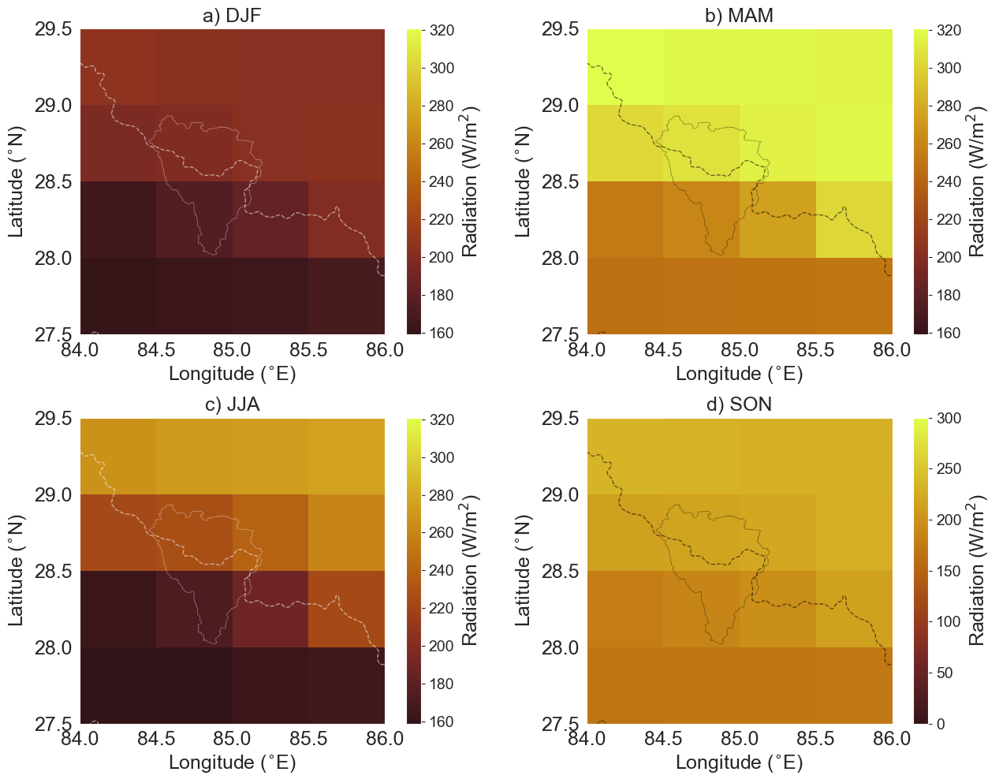

In [109]:
cmap = cmocean.cm.solar
fig, ax = plt.subplots(2,2, figsize=(13, 10))

im1 = radiation_season_resampled_bg.sel(season = 'DJF').plot.pcolormesh(
    ax=ax[0,0], cmap=cmap, vmin=rad_min, vmax=rad_max)
im1.colorbar.set_label('Radiation (W/m$^2$)')
catchment_outline.plot(ax=ax[0,0],  linewidth=0.5, edgecolor='white', alpha = 0.4, facecolor='none')
ax[0,0].set_xlabel('Longitude ($^{\circ}$E)', fontsize=18)
ax[0,0].set_ylabel('Latitude ($^{\circ}$N)', fontsize=18)
ax[0,0].set_title('a) DJF', fontsize=18)

im2 = radiation_season_resampled_bg.sel(season = 'MAM').plot.pcolormesh(
    ax=ax[0,1], cmap=cmap, vmin=rad_min, vmax=rad_max)
im2.colorbar.set_label('Radiation (W/m$^2$)')
catchment_outline.plot(ax=ax[0,1],  linewidth=0.5, edgecolor='black', alpha = 0.4, facecolor='none')
ax[0,1].set_xlabel('Longitude ($^{\circ}$E)', fontsize=18)
ax[0,1].set_ylabel('Latitude ($^{\circ}$N)', fontsize=18)
ax[0,1].set_title('b) MAM', fontsize=18)

im3 = radiation_season_resampled_bg.sel(season = 'JJA').plot.pcolormesh(
    ax=ax[1,0], cmap=cmap, vmin=rad_min, vmax=rad_max)
im3.colorbar.set_label('Radiation (W/m$^2$)')
catchment_outline.plot(ax=ax[1,0],  linewidth=0.5, edgecolor='white', alpha = 0.4, facecolor='none')
ax[1,0].set_xlabel('Longitude ($^{\circ}$E)', fontsize=18)
ax[1,0].set_ylabel('Latitude ($^{\circ}$N)', fontsize=18)
ax[1,0].set_title('c) JJA', fontsize=18)


im4 = radiation_season_resampled_bg.sel(season = 'SON').plot.pcolormesh(
    ax=ax[1,1], cmap=cmap, vmin=0, vmax=300)
im4.colorbar.set_label('Radiation (W/m$^2$)')
catchment_outline.plot(ax=ax[1,1],  linewidth=0.5, edgecolor='black', alpha = 0.4, facecolor='none')
ax[1,1].set_xlabel('Longitude ($^{\circ}$E)', fontsize=18)
ax[1,1].set_ylabel('Latitude ($^{\circ}$N)', fontsize=18)
ax[1,1].set_title('d) SON', fontsize=18)

im1.colorbar.ax.tick_params(labelsize=14)
im2.colorbar.ax.tick_params(labelsize=14)
im3.colorbar.ax.tick_params(labelsize=14)
im4.colorbar.ax.tick_params(labelsize=14)

im1.colorbar.set_label('Radiation (W/m$^2$)', fontsize=18)
im2.colorbar.set_label('Radiation (W/m$^2$)', fontsize=18)
im3.colorbar.set_label('Radiation (W/m$^2$)', fontsize=18)
im4.colorbar.set_label('Radiation (W/m$^2$)', fontsize=18)

gpd['geometry'].plot(ax=ax[0,0], edgecolor='white', linewidth=1, facecolor='none', linestyle='--', alpha = 0.3)
gpd['geometry'].plot(ax=ax[0,1], edgecolor='black', linewidth=1, facecolor='none', linestyle='--', alpha = 0.3)
gpd['geometry'].plot(ax=ax[1,0], edgecolor='white', linewidth=1, facecolor='none', linestyle='--', alpha = 0.3)
gpd['geometry'].plot(ax=ax[1,1], edgecolor='black', linewidth=1, facecolor='none', linestyle='--', alpha = 0.3)

ax[0,0].tick_params(axis='both', which='major', labelsize=18)
ax[0,1].tick_params(axis='both', which='major', labelsize=18)
ax[1,0].tick_params(axis='both', which='major', labelsize=18)
ax[1,1].tick_params(axis='both', which='major', labelsize=18)
fig.tight_layout()
plt.show()



## Relative humidity

In [100]:
month_length_rel_hum_bg = bg_rel_hum.time.dt.days_in_month
weights_length_rel_hum_bg = (month_length_rel_hum_bg.groupby("time.season") / month_length_rel_hum_bg.groupby("time.season").sum())
rel_hum_season_resampled_bg = (bg_rel_hum * weights_length_rel_hum_bg).groupby("time.season").sum(dim="time")
rel_hum_season_notnull_bg = rel_hum_season_resampled_bg.where(rel_hum_season_resampled_bg >= 0, drop=True)


In [101]:
rel_hum_min = rel_hum_season_notnull_bg.min().values
rel_hum_max = rel_hum_season_notnull_bg.max().values

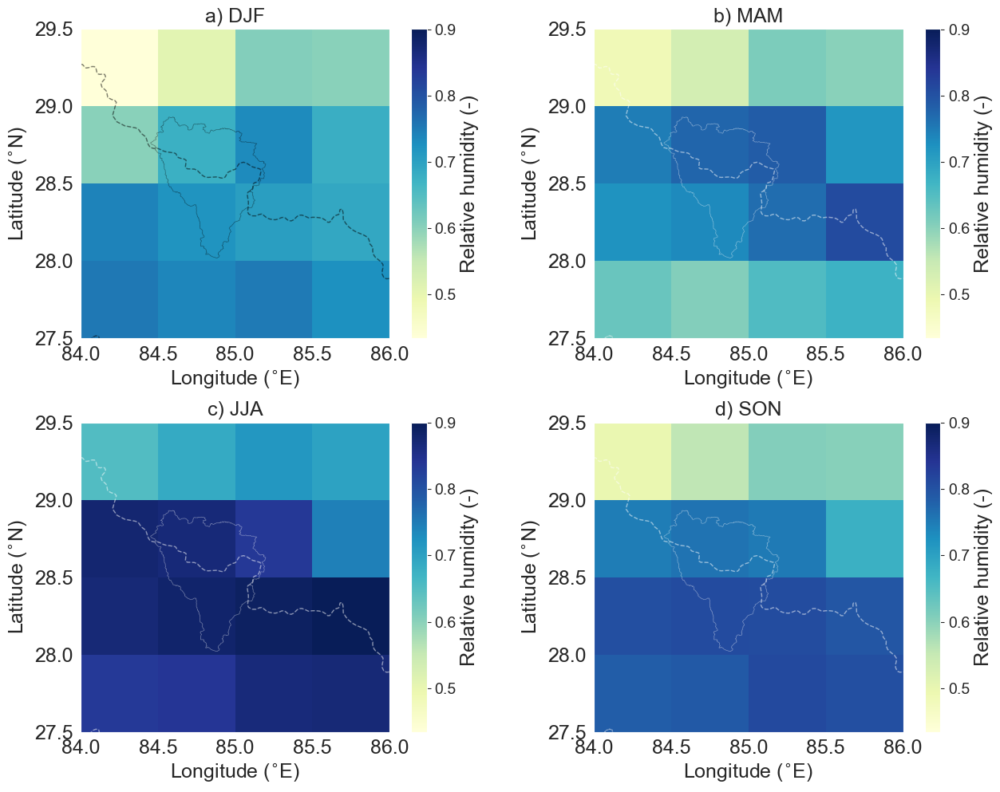

In [108]:
cmap = 'YlGnBu' #cmocean.cm.rain
fig, ax = plt.subplots(2,2, figsize=(13, 10))

im1 = rel_hum_season_notnull_bg.sel(season = 'DJF').plot.pcolormesh(
    ax=ax[0,0], cmap=cmap, vmin=rel_hum_min, vmax=rel_hum_max)
im1.colorbar.set_label('Relative humidity (-)')
catchment_outline.plot(ax=ax[0,0],  linewidth=0.5, edgecolor='black', alpha = 0.4, facecolor='none')
ax[0,0].set_xlabel('Longitude ($^{\circ}$E)', fontsize=18)
ax[0,0].set_ylabel('Latitude ($^{\circ}$N)', fontsize=18)
ax[0,0].set_title('a) DJF', fontsize=18)

im2 = rel_hum_season_notnull_bg.sel(season = 'MAM').plot.pcolormesh(
    ax=ax[0,1], cmap=cmap, vmin=rel_hum_min, vmax=rel_hum_max)
im2.colorbar.set_label('Relative humidity (-)')
catchment_outline.plot(ax=ax[0,1],  linewidth=0.5, edgecolor='white', alpha = 0.4, facecolor='none')
ax[0,1].set_xlabel('Longitude ($^{\circ}$E)', fontsize=18)
ax[0,1].set_ylabel('Latitude ($^{\circ}$N)', fontsize=18)
ax[0,1].set_title('b) MAM', fontsize=18)

im3 = rel_hum_season_notnull_bg.sel(season = 'JJA').plot.pcolormesh(
    ax=ax[1,0], cmap=cmap, vmin=rel_hum_min, vmax=rel_hum_max)
im3.colorbar.set_label('Relative humidity (-)')
catchment_outline.plot(ax=ax[1,0],  linewidth=0.5, edgecolor='white', alpha = 0.4, facecolor='none')
ax[1,0].set_xlabel('Longitude ($^{\circ}$E)', fontsize=18)
ax[1,0].set_ylabel('Latitude ($^{\circ}$N)', fontsize=18)
ax[1,0].set_title('c) JJA', fontsize=18)


im4 = rel_hum_season_notnull_bg.sel(season = 'SON').plot.pcolormesh(
    ax=ax[1,1], cmap=cmap, vmin=rel_hum_min, vmax=rel_hum_max)
im4.colorbar.set_label('Relative humidity (-)')
catchment_outline.plot(ax=ax[1,1],  linewidth=0.5, edgecolor='white', alpha = 0.4, facecolor='none')
ax[1,1].set_xlabel('Longitude ($^{\circ}$E)', fontsize=18)
ax[1,1].set_ylabel('Latitude ($^{\circ}$N)', fontsize=18)
ax[1,1].set_title('d) SON', fontsize=18)

im1.colorbar.ax.tick_params(labelsize=14)
im2.colorbar.ax.tick_params(labelsize=14)
im3.colorbar.ax.tick_params(labelsize=14)
im4.colorbar.ax.tick_params(labelsize=14)

im1.colorbar.set_label('Relative humidity (-)', fontsize=18)
im2.colorbar.set_label('Relative humidity (-)', fontsize=18)
im3.colorbar.set_label('Relative humidity (-)', fontsize=18)
im4.colorbar.set_label('Relative humidity (-)', fontsize=18)

gpd['geometry'].plot(ax=ax[0,0], edgecolor='black', linewidth=1, facecolor='none', linestyle='--', alpha = 0.3)
gpd['geometry'].plot(ax=ax[0,1], edgecolor='white', linewidth=1, facecolor='none', linestyle='--', alpha = 0.3)
gpd['geometry'].plot(ax=ax[1,0], edgecolor='white', linewidth=1, facecolor='none', linestyle='--', alpha = 0.3)
gpd['geometry'].plot(ax=ax[1,1], edgecolor='white', linewidth=1, facecolor='none', linestyle='--', alpha = 0.3)

ax[0,0].tick_params(axis='both', which='major', labelsize=18)
ax[0,1].tick_params(axis='both', which='major', labelsize=18)
ax[1,0].tick_params(axis='both', which='major', labelsize=18)
ax[1,1].tick_params(axis='both', which='major', labelsize=18)
fig.tight_layout()
plt.show()



In [202]:
crs_32645 = CRS.from_epsg(32645) # CRS from cell_data file
crs_4326 = CRS.from_epsg(4326) # Lat-lon


## Create transformer to convert from CRS to CRS

transformer = Transformer.from_crs(crs_4326, crs_32645,  always_xy = True)

min_x, min_y = transformer.transform(min_lon, min_lat)
max_x, max_y = transformer.transform(max_lon, max_lat)

In [217]:
precip_ds = xr.Dataset(
    data_vars= dict(
        precipitation = (["lat", "lon"], bg_precip_mean.values)
    ),
    coords=dict(
        lon = (["lon"], bg_precip_mean.lon.values),
        lat = (["lat"], bg_precip_mean.lat.values),
    attrs = dict(
        crs = 'EPSG:4326')
))

TypeError: variable 'attrs' has invalid type <class 'dict'>

In [215]:
precip_ds.to_netcdf('/Users/jacobqs/Downloads/precip_mean_bg1.nc')

In [212]:
bg_precip_mean

<xarray.DataArray 'precipitation' (lat: 4, lon: 4)>
dask.array<mean_agg-aggregate, shape=(4, 4), dtype=float32, chunksize=(4, 4), chunktype=numpy.ndarray>
Coordinates:
  * lon      (lon) float64 84.25 84.75 85.25 85.75
  * lat      (lat) float64 27.75 28.25 28.75 29.25

In [195]:
precip_input_mean.station.x.values

array([228932.24375772, 230182.07027536, 231452.43294869, 232743.23816529,
       278233.34753697, 279255.45076518, 280294.35423899, 281349.98165787,
       327524.81694515, 328319.48629999, 329127.22122567, 329947.96255853,
       376808.79301656, 377376.25342891, 377953.04570131, 378539.12767101])

In [184]:
precip_input_mean.precipitation.values

array([0.24636834, 0.29660009, 0.09016314, 0.02281528, 0.22249837,
       0.24841375, 0.11602017, 0.05538392, 0.2173542 , 0.18543408,
       0.13264124, 0.10045632, 0.21818342, 0.16960999, 0.1021515 ,
       0.0981675 ])

In [200]:
np.reshape(precip_input_mean.precipitation.values, (len(lon_prec), len(lat_prec)))

ValueError: cannot reshape array of size 16 into shape (16,16)

In [197]:
precip_ds = xr.Dataset(
    data_vars= dict(
        precipitation = (["lat", "lon"], precip_input_mean.precipitation.values)
    ),
    coords=dict(
        lon = (["lon"], lonlon_prec),
        lat = (["lat"], latlat_prec)
))

ValueError: Could not convert tuple of form (dims, data[, attrs, encoding]): (['lon'], array([[84.25, 84.25, 84.25, 84.25, 84.75, 84.75, 84.75, 84.75, 85.25,
        85.25, 85.25, 85.25, 85.75, 85.75, 85.75, 85.75],
       [84.25, 84.25, 84.25, 84.25, 84.75, 84.75, 84.75, 84.75, 85.25,
        85.25, 85.25, 85.25, 85.75, 85.75, 85.75, 85.75],
       [84.25, 84.25, 84.25, 84.25, 84.75, 84.75, 84.75, 84.75, 85.25,
        85.25, 85.25, 85.25, 85.75, 85.75, 85.75, 85.75],
       [84.25, 84.25, 84.25, 84.25, 84.75, 84.75, 84.75, 84.75, 85.25,
        85.25, 85.25, 85.25, 85.75, 85.75, 85.75, 85.75],
       [84.25, 84.25, 84.25, 84.25, 84.75, 84.75, 84.75, 84.75, 85.25,
        85.25, 85.25, 85.25, 85.75, 85.75, 85.75, 85.75],
       [84.25, 84.25, 84.25, 84.25, 84.75, 84.75, 84.75, 84.75, 85.25,
        85.25, 85.25, 85.25, 85.75, 85.75, 85.75, 85.75],
       [84.25, 84.25, 84.25, 84.25, 84.75, 84.75, 84.75, 84.75, 85.25,
        85.25, 85.25, 85.25, 85.75, 85.75, 85.75, 85.75],
       [84.25, 84.25, 84.25, 84.25, 84.75, 84.75, 84.75, 84.75, 85.25,
        85.25, 85.25, 85.25, 85.75, 85.75, 85.75, 85.75],
       [84.25, 84.25, 84.25, 84.25, 84.75, 84.75, 84.75, 84.75, 85.25,
        85.25, 85.25, 85.25, 85.75, 85.75, 85.75, 85.75],
       [84.25, 84.25, 84.25, 84.25, 84.75, 84.75, 84.75, 84.75, 85.25,
        85.25, 85.25, 85.25, 85.75, 85.75, 85.75, 85.75],
       [84.25, 84.25, 84.25, 84.25, 84.75, 84.75, 84.75, 84.75, 85.25,
        85.25, 85.25, 85.25, 85.75, 85.75, 85.75, 85.75],
       [84.25, 84.25, 84.25, 84.25, 84.75, 84.75, 84.75, 84.75, 85.25,
        85.25, 85.25, 85.25, 85.75, 85.75, 85.75, 85.75],
       [84.25, 84.25, 84.25, 84.25, 84.75, 84.75, 84.75, 84.75, 85.25,
        85.25, 85.25, 85.25, 85.75, 85.75, 85.75, 85.75],
       [84.25, 84.25, 84.25, 84.25, 84.75, 84.75, 84.75, 84.75, 85.25,
        85.25, 85.25, 85.25, 85.75, 85.75, 85.75, 85.75],
       [84.25, 84.25, 84.25, 84.25, 84.75, 84.75, 84.75, 84.75, 85.25,
        85.25, 85.25, 85.25, 85.75, 85.75, 85.75, 85.75],
       [84.25, 84.25, 84.25, 84.25, 84.75, 84.75, 84.75, 84.75, 85.25,
        85.25, 85.25, 85.25, 85.75, 85.75, 85.75, 85.75]])) to Variable.

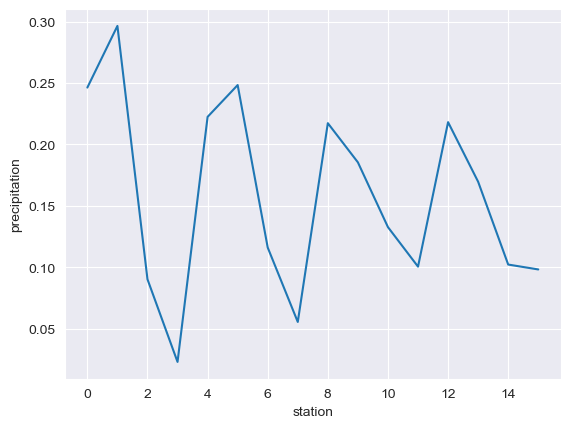

In [224]:
precip_input_mean.precipitation.plot()

TypeError: Invalid shape (16,) for image data

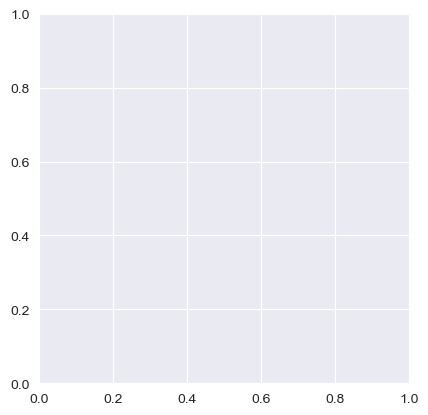

In [170]:
pre

In [165]:
precip_input.precipitation.mean(dim='time').implot()

AttributeError: 'DataArray' object has no attribute 'implot'

<AxesSubplot:xlabel='time'>

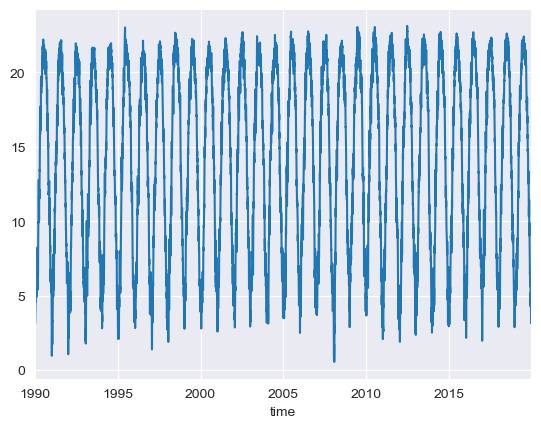

In [45]:
df['Temperature'].plot()

In [ ]:
fig, ax = plt.subplots(1,2, figsize=(15,10))

temp_hma.plot(ax = ax[0], )

In [19]:
temp_hma_df = temp_hma.to_dataframe()
precip_hma_df = precip_hma.to_dataframe()

In [18]:
decompose_result_mult = seasonal_decompose(temp_hma_df['temperature'].values, model='multiplicative')

ValueError: Multiplicative seasonality is not appropriate for zero and negative values

In [120]:
crs_32645 = CRS.from_epsg(32645) # CRS from cell_data file
crs_4326 = CRS.from_epsg(4326) # Lat-lon


## Create transformer to convert from CRS to CRS

transformer = Transformer.from_crs(crs_32645, crs_4326, always_xy = True)

lon, lat = transformer.transform(x, y)

In [121]:
model = LinearRegression()
model = LinearRegression().fit(z.reshape(-1,1), temp_mean)
coeff = np.abs(model.coef_)
intercept = model.intercept_

In [122]:
r_sq = model.score(z.reshape(-1,1), temp_mean)
r_sq

0.84647115926026

Text(4000, 20, 'y = 24.71 - 0.0055x')

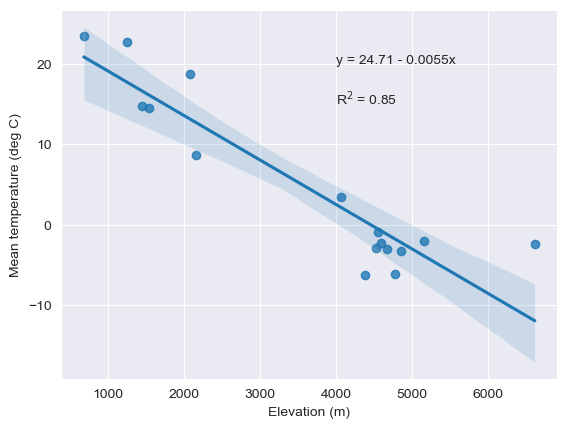

In [123]:
df = pd.DataFrame({'z': z, 'temp_mean': temp_mean})
p = sns.regplot(x='z', y='temp_mean', data=df)

plt.text(4000,15, f'R$^2$ = {r_sq:.2f}')
plt.text(4000, 20, f'y = {intercept:.2f} - {coeff[0]:.4f}x')

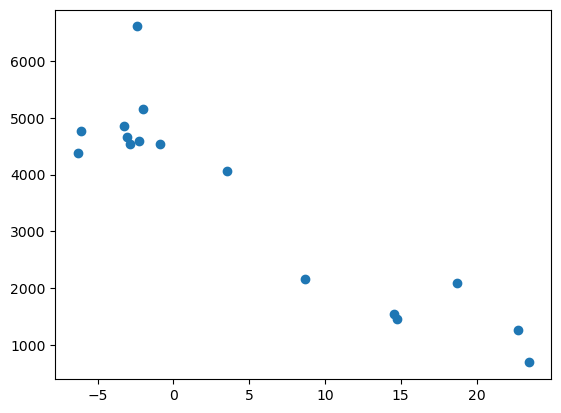

In [69]:
plt.scatter(temp_mean, z)

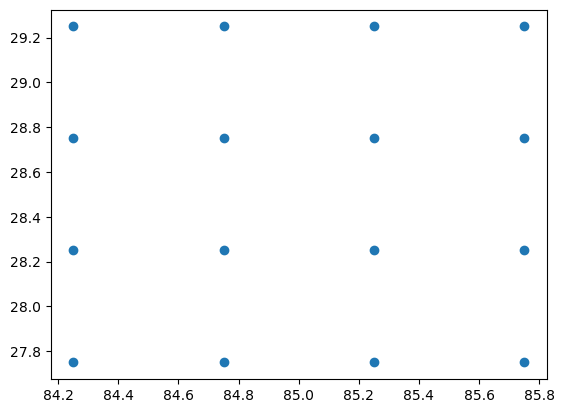

In [70]:
plt.scatter(lon,lat)

In [71]:
polygon_fn = '../data/forcing_data/raw/cell_data/cid10/10.shp'

In [72]:
import matplotlib.pyplot as plt
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point, Polygon

In [80]:
crs={'init':'epsg:32645'}

In [95]:
df = pd.DataFrame({'lon': lon, 'lat': lat, 'temp_mean': temp_mean})

In [96]:
geometry=[Point(xy) for xy in zip(df["lon"], df["lat"])]


In [97]:
geodata=gpd.GeoDataFrame(df,crs=crs, geometry=geometry)

/Users/jacobqs/opt/miniconda3/envs/geohyd/lib/python3.10/site-packages/pyproj/crs/crs.py:130: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


<AxesSubplot:>

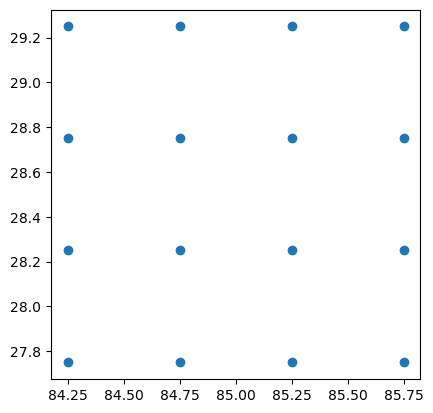

In [98]:
geodata.plot()


In [99]:
budhi_gandaki_shapefile = gpd.read_file(polygon_fn)

In [100]:
budhi_gandaki_shapefile_4326 = budhi_gandaki_shapefile.to_crs(epsg=4326)

In [101]:
geodata

,lon,lat,temp_mean,geometry
0,84.25,27.75,23.441659,POINT (84.250 27.750)
1,84.25,28.25,14.753652,POINT (84.250 28.250)
2,84.25,28.75,-3.241109,POINT (84.250 28.750)
3,84.25,29.25,-1.992619,POINT (84.250 29.250)
4,84.75,27.75,22.736058,POINT (84.750 27.750)
5,84.75,28.25,8.675573,POINT (84.750 28.250)
6,84.75,28.75,-6.305936,POINT (84.750 28.750)
7,84.75,29.25,-2.873454,POINT (84.750 29.250)
8,85.25,27.75,18.711469,POINT (85.250 27.750)
9,85.25,28.25,3.520001,POINT (85.250 28.250)


In [102]:
budhi_gandaki_shapefile

,ID,GRIDCODE,area,geometry
0,9,10,3.867040e+09,"POLYGON ((274129.137 3139364.792, 274114.268 3..."


Text(46.84722222222163, 0.5, 'Latitude (degrees north)')

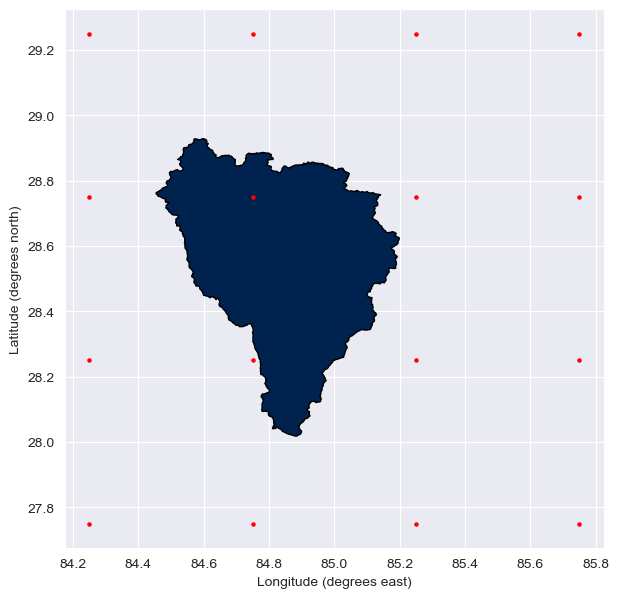

In [114]:
fig, ax = plt.subplots(figsize=(7,7))

budhi_gandaki_shapefile_4326.plot(ax=ax, facecolor='Grey', edgecolor='k',alpha=1,linewidth=1,cmap="cividis")


#You can use different 'cmaps' such as jet, plasm,magma, infereno,cividis, binary...(I simply chose cividis)


geodata.plot(ax=ax, color='red', markersize=5);



#fig.suptitle('Random locations', fontsize=12)
ax.set_xlabel('Longitude (degrees east)', fontsize=10)
ax.set_ylabel('Latitude (degrees north)', fontsize='medium')